In [2]:
# ============================================================
# 0.1. Импорты
# ============================================================
import os
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import font_manager
from matplotlib.colors import LinearSegmentedColormap
from pathlib import Path

# ============================================================
# 0.2. Регистрация шрифтов Gilroy
# ============================================================
font_dir = Path.cwd()
font_files = [
    font_dir / "Gilroy-Light.otf",
    font_dir / "Gilroy-ExtraBold.otf",
]

for f in font_files:
    if not f.exists():
        raise FileNotFoundError(f"Не найден шрифт: {f}")
    font_manager.fontManager.addfont(str(f))

# Узнаём имя семейства (обычно оба файла называются 'Gilroy')
light_name = font_manager.FontProperties(fname=str(font_files[0])).get_name()
bold_name  = font_manager.FontProperties(fname=str(font_files[1])).get_name()
print("Шрифты:", light_name, "и", bold_name)

# ============================================================
# 0.3. Палитра
# ============================================================
PINK   = '#FB52A5'   # кризис / главное
ORANGE = '#FD8616'   # второй акцент
PURPLE = '#7061F0'   # третий акцент
WHITE  = '#FFFFFF'
INK    = '#333333'   # текст
MUTE   = '#555555'   # оси
GREY   = '#B0B0B0'   # 2025 / норма / нейтральное
GREEN  = '#00A88F'   # дополнительный

# ============================================================
# 0.4. Глобальные настройки графиков
# ============================================================
plt.rcParams.update({
    'font.family': light_name,
    'font.weight': 'regular',

    'font.size': 12,
    'axes.titlesize': 15,
    'axes.titleweight': 'bold',
    'axes.labelsize': 12,
    'legend.fontsize': 11,
    'figure.titlesize': 17,
    'figure.dpi': 130,

    'figure.facecolor': WHITE,
    'axes.facecolor': WHITE,
    'savefig.facecolor': WHITE,

    'text.color': INK,
    'axes.labelcolor': INK,
    'xtick.color': MUTE,
    'ytick.color': MUTE,
    'axes.edgecolor': MUTE,

    'axes.grid': True,
    'grid.color': '#E8E8E8',
    'grid.alpha': 0.6,
    'grid.linewidth': 0.6,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.linewidth': 0.9,

    'lines.linewidth': 2.2,
    'lines.markersize': 6,
})

print("Дизайн готов.")

Шрифты: Gilroy и Gilroy
Дизайн готов.


In [13]:
from pathlib import Path

# Папка для сохранений
KATE_DIR = Path('kate')
KATE_DIR.mkdir(exist_ok=True)

print('Папка для сохранений:', KATE_DIR.resolve())

Папка для сохранений: /srv/shared/kate


In [9]:
# ============================================================
# ДИАГНОСТИКА: сколько строк в файле vs сколько прочитал pandas
# ============================================================
from pathlib import Path

DATA_DIR = Path('/shared/uploads')
if not DATA_DIR.exists():
    DATA_DIR = Path('uploads')

for name in ['clients_demographics.csv', 'fines_2026.csv', 'fuel_transaction.csv']:
    path = DATA_DIR / name

    # Считаем строки в файле вручную
    with open(path, 'r', encoding='utf-8', errors='replace') as f:
        lines = f.readlines()
    n_lines = len(lines)

    # Первая строка — заголовок, значит данных на 1 меньше
    print(f'{name}:')
    print(f'  строк в файле всего   : {n_lines}')
    print(f'  строк с данными       : {n_lines - 1}')
    print()

clients_demographics.csv:
  строк в файле всего   : 28238
  строк с данными       : 28237

fines_2026.csv:
  строк в файле всего   : 77979
  строк с данными       : 77978

fuel_transaction.csv:
  строк в файле всего   : 379700
  строк с данными       : 379699



In [10]:
# ============================================================
# 1.2. Чтение таблиц (с автоопределением разделителя)
# ============================================================
def smart_read(path):
    """Пробует разные разделители, возвращает первый удачный."""
    for sep in [';', ',', '\t']:
        try:
            df = pd.read_csv(path, sep=sep, decimal=',')
            # Если получилось больше 1 колонки — значит, разделитель подошёл
            if df.shape[1] > 1:
                print(f'  {path.name}: разделитель = {repr(sep)}, колонок = {df.shape[1]}')
                return df
        except Exception:
            continue
    # Если ничего не помогло — читаем как есть, потом разберёмся
    print(f'  {path.name}: не удалось определить разделитель')
    return pd.read_csv(path)

clients = smart_read(DATA_DIR / 'clients_demographics.csv')
fines   = smart_read(DATA_DIR / 'fines_2026.csv')
fuel    = smart_read(DATA_DIR / 'fuel_transaction.csv')

print()
print('clients:', clients.shape)
print('fines  :', fines.shape)
print('fuel   :', fuel.shape)
print()
print('Колонки clients:', list(clients.columns))
print('Колонки fines  :', list(fines.columns))
print('Колонки fuel   :', list(fuel.columns))

  clients_demographics.csv: разделитель = ';', колонок = 20
  fines_2026.csv: разделитель = ';', колонок = 7
  fuel_transaction.csv: разделитель = ';', колонок = 5

clients: (28237, 20)
fines  : (77978, 7)
fuel   : (379699, 5)

Колонки clients: ['client_id', 'gender', 'age_type_code', 'auto_document_id', 'auto_mark', 'auto_year', 'engine_type', 'price', 'color', 'kladr_code', 'april_2025_fines', 'may_2025_fines', 'jun_2025_fines', 'jul_2025_fines', 'aug_2025_fines', 'fines_last_6_month', 'fines_last_12_month', 'fines_last_24_month', 'fines_last_36_month', 'subscription_creation_date']
Колонки fines  : ['client_id', 'bill_id', 'offence_short_statement', 'total_fine_amount', 'region_name', 'bill_offence_date', 'auto_document_id']
Колонки fuel   : ['order_id', 'order_datetime', 'order_fuel_volume', 'order_fuel_price_1liter', 'client_id']


СКОЛЬКО КЛИЕНТОВ ЕСТЬ В КАЖДОЙ ГРУППЕ
Всего клиентов в демографии       :  25,675

Только демография (нет ни штрафов,
                    ни заправок)   :       0
Демография + штрафы               :       0
Демография + заправки             :  10,172
Во всех трёх таблицах             :  15,503

Рабочая выборка — 60.4% от всех клиентов

Пересечение хорошее — можно анализировать
почти по всем клиентам.


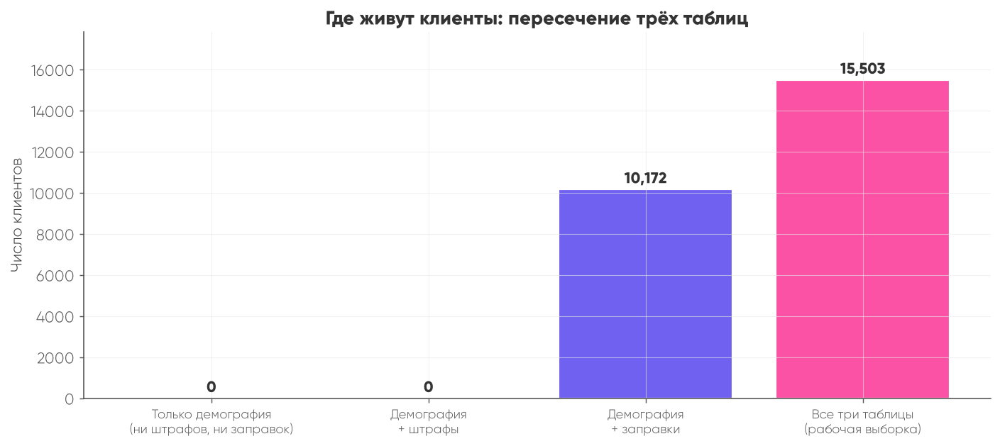

In [11]:
# ============================================================
# 2.1. Собираем ID клиентов из каждой таблицы
# ============================================================
клиенты_демография = set(clients['client_id'].dropna())
клиенты_штрафы     = set(fines['client_id'].dropna())
клиенты_заправки   = set(fuel['client_id'].dropna())

# ============================================================
# 2.2. Считаем группы
# ============================================================
# Клиенты, которые есть только в одной таблице
только_в_демографии = клиенты_демография - клиенты_штрафы - клиенты_заправки

# Клиенты, которые есть в двух таблицах, но не в третьей
демография_и_штрафы   = (клиенты_демография & клиенты_штрафы) - клиенты_заправки
демография_и_заправки = (клиенты_демография & клиенты_заправки) - клиенты_штрафы

# Клиенты, которые есть во всех трёх — рабочая выборка
во_всех_трёх = клиенты_демография & клиенты_штрафы & клиенты_заправки

# ============================================================
# 2.3. Печатаем результат по-русски
# ============================================================
всего = len(клиенты_демография)

print('СКОЛЬКО КЛИЕНТОВ ЕСТЬ В КАЖДОЙ ГРУППЕ')
print('=' * 60)
print(f'Всего клиентов в демографии       : {всего:>7,}')
print()
print(f'Только демография (нет ни штрафов,')
print(f'                    ни заправок)   : {len(только_в_демографии):>7,}')
print(f'Демография + штрафы               : {len(демография_и_штрафы):>7,}')
print(f'Демография + заправки             : {len(демография_и_заправки):>7,}')
print(f'Во всех трёх таблицах             : {len(во_всех_трёх):>7,}')
print()
print(f'Рабочая выборка — {round(len(во_всех_трёх) / всего * 100, 1)}% от всех клиентов')
print()
if len(во_всех_трёх) / всего < 0.2:
    print('ВНИМАНИЕ: пересечение маленькое — выводы будут')
    print('только про этих клиентов, не про всех.')
elif len(во_всех_трёх) / всего < 0.5:
    print('Пересечение среднее — можно анализировать,')
    print('но стоит упомянуть в ограничениях.')
else:
    print('Пересечение хорошее — можно анализировать')
    print('почти по всем клиентам.')

# ============================================================
# 2.4. Картинка
# ============================================================
подписи = [
    'Только демография\n(ни штрафов, ни заправок)',
    'Демография\n+ штрафы',
    'Демография\n+ заправки',
    'Все три таблицы\n(рабочая выборка)',
]
значения = [
    len(только_в_демографии),
    len(демография_и_штрафы),
    len(демография_и_заправки),
    len(во_всех_трёх),
]
цвета = [GREY, ORANGE, PURPLE, PINK]

fig, ax = plt.subplots(figsize=(11, 5))
bars = ax.bar(подписи, значения, color=цвета, edgecolor=WHITE, linewidth=1.2)

for bar, v in zip(bars, значения):
    ax.text(bar.get_x() + bar.get_width()/2,
            v + max(значения) * 0.01,
            f'{v:,}',
            ha='center', va='bottom',
            fontweight='bold', color=INK, fontsize=12)

ax.set_title('Где живут клиенты: пересечение трёх таблиц')
ax.set_ylabel('Число клиентов')
ax.set_ylim(0, max(значения) * 1.15)
plt.xticks(fontsize=10)
plt.tight_layout()
plt.show()

Объём заправки, литры
  минимум : -164.0
  медиана : 35.6
  среднее : 36.0
  максимум: 505.6

Доля > 80 л : 0.79 %
Доля > 100 л: 0.28 %

Самые частые объёмы:
order_fuel_volume
36.0    51721
46.0    24898
26.0    18342
21.0    14863
31.0    12981
41.0    11857
35.0    11122
20.0    10641
56.0    10103
34.0    10064
Name: count, dtype: int64


/tmp/ipykernel_74084/2308349203.py:31: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  ax[1].boxplot(vol, vert=False, patch_artist=True,


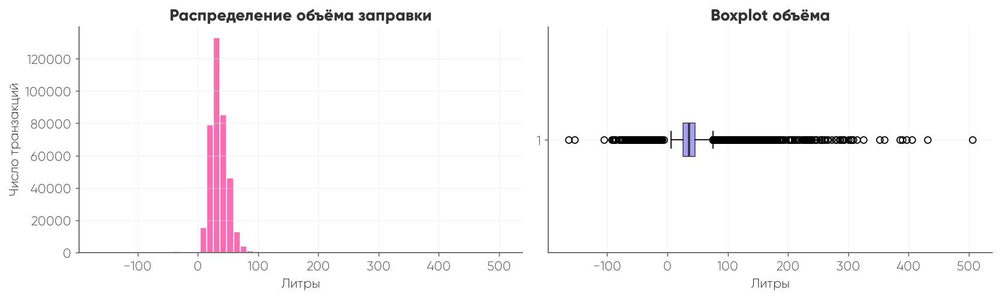

In [15]:
# ============================================================
# 3.1. Описательные статистики
# ============================================================
vol = fuel['order_fuel_volume'].dropna()

print('Объём заправки, литры')
print('  минимум :', round(vol.min(), 1))
print('  медиана :', round(vol.median(), 1))
print('  среднее :', round(vol.mean(), 1))
print('  максимум:', round(vol.max(), 1))
print()
print('Доля > 80 л :', round((vol > 80).mean() * 100, 2), '%')
print('Доля > 100 л:', round((vol > 100).mean() * 100, 2), '%')

# ============================================================
# 3.2. Топ частых объёмов (признак предоплаты)
# ============================================================
print('\nСамые частые объёмы:')
print(vol.round(0).value_counts().head(10))

# ============================================================
# 3.3. График
# ============================================================
fig, ax = plt.subplots(1, 2, figsize=(13, 4))

ax[0].hist(vol, bins=60, color=PINK, alpha=0.85, edgecolor=WHITE)
ax[0].set_title('Распределение объёма заправки')
ax[0].set_xlabel('Литры')
ax[0].set_ylabel('Число транзакций')

ax[1].boxplot(vol, vert=False, patch_artist=True,
              boxprops=dict(facecolor=PURPLE, alpha=0.6),
              medianprops=dict(color=INK, linewidth=2))
ax[1].set_title('Boxplot объёма')
ax[1].set_xlabel('Литры')

plt.tight_layout()
plt.show()

In [19]:
# ============================================================
# 1.1. Смотрим, что было до обрезки
# ============================================================
print('ДО обрезки:')
print(f'  всего строк              : {len(fuel):,}')
print(f'  объём < 0                : {(fuel["order_fuel_volume"] < 0).sum():,}')
print(f'  объём = 0                : {(fuel["order_fuel_volume"] == 0).sum():,}')
print(f'  объём от 0 до 200        : {fuel["order_fuel_volume"].between(0, 150).sum():,}')
print(f'  объём > 200              : {(fuel["order_fuel_volume"] > 150).sum():,}')
print(f'  пустые (NaN)             : {fuel["order_fuel_volume"].isna().sum():,}')

# ============================================================
# 1.2. Обрезаем
# ============================================================
fuel_clean = fuel[
    fuel['order_fuel_volume'].notna() &
    (fuel['order_fuel_volume'] >= 0) &
    (fuel['order_fuel_volume'] <= 150)
].copy()

print()
print('ПОСЛЕ обрезки:')
print(f'  всего строк              : {len(fuel_clean):,}')
print(f'  удалено строк            : {len(fuel) - len(fuel_clean):,}')

# ============================================================
# 1.3. Сохраняем в папку kate
# ============================================================
save_path = KATE_DIR / 'fuel_clean_0_200.csv'
fuel_clean.to_csv(save_path, index=False, sep=';', decimal=',')

print()
print('Сохранено в:', save_path.resolve())

ДО обрезки:
  всего строк              : 379,699
  объём < 0                : 1,500
  объём = 0                : 0
  объём от 0 до 200        : 377,846
  объём > 200              : 353
  пустые (NaN)             : 0

ПОСЛЕ обрезки:
  всего строк              : 377,846
  удалено строк            : 1,853

Сохранено в: /srv/shared/kate/fuel_clean_0_200.csv


ОБЪЁМ ЗАПРАВКИ ПОСЛЕ ОЧИСТКИ (0–150 л)
  всего транзакций : 377,846
  минимум          : 5.6 л
  медиана          : 35.6 л
  среднее          : 36.1 л
  максимум         : 149.8 л

  доли по диапазонам:
    до 20 л        :  10.7%
    20–40 л        :  53.9%
    40–60 л        :  30.7%
    60–80 л        :   4.1%
    больше 80 л    :   0.7%


/tmp/ipykernel_74084/1557924395.py:40: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  bp = ax.boxplot(vol, vert=False, patch_artist=True, widths=0.5,


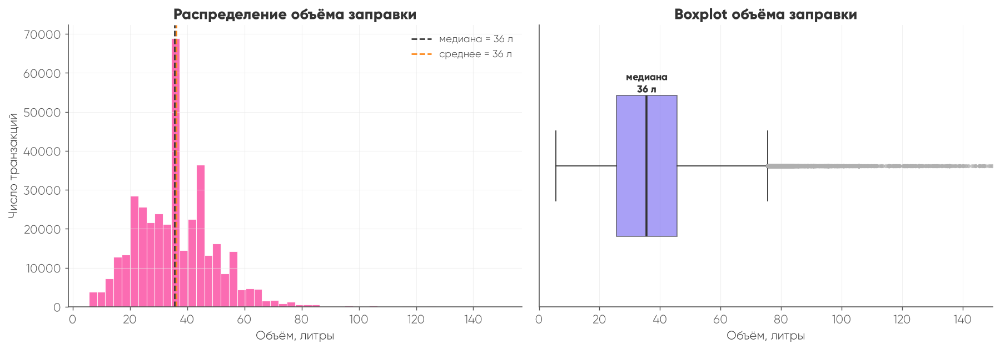


График сохранён в: /srv/shared/kate/fuel_volume_distribution.png


In [21]:
# ============================================================
# 3.1. Считаем статистики по очищенным данным
# ============================================================
vol = fuel_clean['order_fuel_volume'].dropna()

print('ОБЪЁМ ЗАПРАВКИ ПОСЛЕ ОЧИСТКИ (0–150 л)')
print('=' * 50)
print(f'  всего транзакций : {len(vol):,}')
print(f'  минимум          : {vol.min():.1f} л')
print(f'  медиана          : {vol.median():.1f} л')
print(f'  среднее          : {vol.mean():.1f} л')
print(f'  максимум         : {vol.max():.1f} л')
print()
print('  доли по диапазонам:')
print(f'    до 20 л        : {(vol < 20).mean() * 100:5.1f}%')
print(f'    20–40 л        : {vol.between(20, 40).mean() * 100:5.1f}%')
print(f'    40–60 л        : {vol.between(40, 60).mean() * 100:5.1f}%')
print(f'    60–80 л        : {vol.between(60, 80).mean() * 100:5.1f}%')
print(f'    больше 80 л    : {(vol > 80).mean() * 100:5.1f}%')

# ============================================================
# 3.2. Два графика рядом: распределение и boxplot
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# --- Левая панель: гистограмма
ax = axes[0]
ax.hist(vol, bins=50, color=PINK, alpha=0.85, edgecolor=WHITE, linewidth=0.6)
ax.axvline(vol.median(), color=INK, linestyle='--', linewidth=1.5,
           label=f'медиана = {vol.median():.0f} л')
ax.axvline(vol.mean(), color=ORANGE, linestyle='--', linewidth=1.5,
           label=f'среднее = {vol.mean():.0f} л')
ax.set_title('Распределение объёма заправки')
ax.set_xlabel('Объём, литры')
ax.set_ylabel('Число транзакций')
ax.legend(frameon=False, fontsize=10)

# --- Правая панель: boxplot
ax = axes[1]
bp = ax.boxplot(vol, vert=False, patch_artist=True, widths=0.5,
                boxprops=dict(facecolor=PURPLE, alpha=0.6, edgecolor=INK),
                medianprops=dict(color=INK, linewidth=2),
                whiskerprops=dict(color=INK),
                capprops=dict(color=INK),
                flierprops=dict(marker='o', markersize=3,
                                markerfacecolor=GREY, markeredgecolor=GREY,
                                alpha=0.4))
ax.set_title('Boxplot объёма заправки')
ax.set_xlabel('Объём, литры')
ax.set_yticks([])
ax.set_xlim(0, 150)

# Подпишем медиану прямо на графике
ax.text(vol.median(), 1.25, f'медиана\n{vol.median():.0f} л',
        ha='center', va='bottom', fontsize=10, color=INK, fontweight='bold')

plt.tight_layout()
plt.savefig(KATE_DIR / 'fuel_volume_distribution.png',
            dpi=150, bbox_inches='tight')
plt.show()

print('\nГрафик сохранён в:', (KATE_DIR / 'fuel_volume_distribution.png').resolve())

order_datetime не дата, преобразуем...


findfont: Failed to find font weight bold for Gilroy, now using 800.


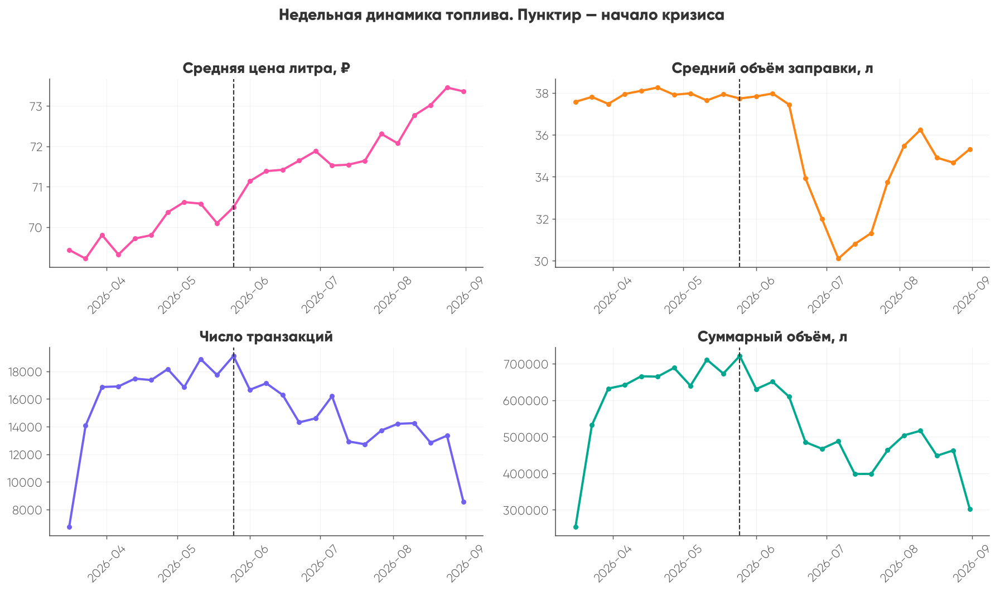

Сохранено: /srv/shared/kate/04_weekly_fuel.png


In [23]:
# ============================================================
# 4.0. Проверка и приведение типов
# ============================================================
# Если order_datetime не дата — преобразуем
if not pd.api.types.is_datetime64_any_dtype(fuel_clean['order_datetime']):
    print('order_datetime не дата, преобразуем...')
    fuel_clean['order_datetime'] = pd.to_datetime(
        fuel_clean['order_datetime'], errors='coerce'
    )

# Сколько получилось NaT после преобразования
n_nat = fuel_clean['order_datetime'].isna().sum()
if n_nat > 0:
    print(f'ВНИМАНИЕ: {n_nat} строк с некорректной датой — они будут пропущены')

# ============================================================
# 4.1. Готовим неделю
# ============================================================
fuel_clean = fuel_clean.dropna(subset=['order_datetime']).copy()
fuel_clean['week'] = fuel_clean['order_datetime'].dt.to_period('W').dt.start_time

weekly = fuel_clean.groupby('week').agg(
    цена          = ('order_fuel_price_1liter', 'mean'),
    средний_объём = ('order_fuel_volume',       'mean'),
    число_заправок= ('order_id',                'count'),
    суммарный_объём=('order_fuel_volume',       'sum'),
).reset_index()

# ============================================================
# 4.2. Четыре графика
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

панели = [
    (axes[0, 0], 'цена',           'Средняя цена литра, ₽',      PINK),
    (axes[0, 1], 'средний_объём',  'Средний объём заправки, л',  ORANGE),
    (axes[1, 0], 'число_заправок', 'Число транзакций',           PURPLE),
    (axes[1, 1], 'суммарный_объём','Суммарный объём, л',         GREEN),
]

for ax, col, title, color in панели:
    ax.plot(weekly['week'], weekly[col], marker='o', ms=4, color=color)
    ax.axvline(pd.Timestamp('2026-05-25'), color=INK,
               linestyle='--', linewidth=1.2)
    ax.set_title(title)
    ax.tick_params(axis='x', rotation=45)

fig.suptitle('Недельная динамика топлива. Пунктир — начало кризиса',
             y=1.02, fontsize=16, fontweight='bold', color=INK)

plt.tight_layout()
plt.savefig(KATE_DIR / '04_weekly_fuel.png', dpi=150, bbox_inches='tight')
plt.show()

print('Сохранено:', (KATE_DIR / '04_weekly_fuel.png').resolve())

findfont: Failed to find font weight regular for Gilroy, now using 300.


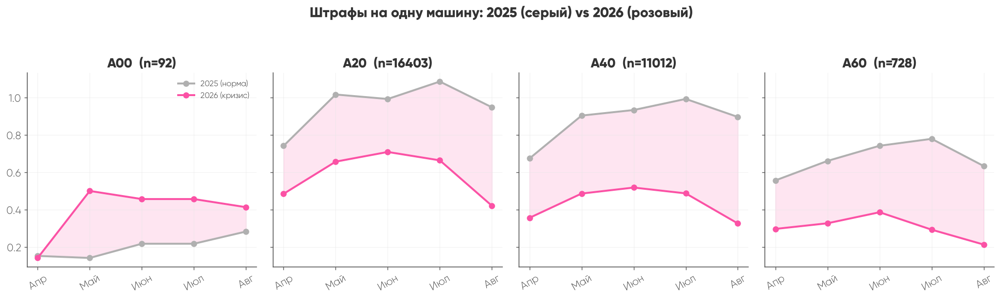


Изменение от апреля к августу:
------------------------------------------------------------
 A00  (n=  92)  2025:  +85.7%   2026: +192.3%   разница: +106.6%
 A20  (n=16403)  2025:  +27.9%   2026:  -13.2%   разница:  -41.1%
 A40  (n=11012)  2025:  +33.0%   2026:   -8.4%   разница:  -41.4%
 A60  (n= 728)  2025:  +13.8%   2026:  -28.2%   разница:  -42.1%


In [25]:
# ============================================================
# 5.0. Приведение типов
# ============================================================
if not pd.api.types.is_datetime64_any_dtype(fines['bill_offence_date']):
    fines['bill_offence_date'] = pd.to_datetime(
        fines['bill_offence_date'], errors='coerce'
    )

fines = fines.dropna(subset=['bill_offence_date']).copy()

# ============================================================
# 5.1. Штрафы по месяцам 2026 на каждую машину
# ============================================================
fines['year']  = fines['bill_offence_date'].dt.year
fines['month'] = fines['bill_offence_date'].dt.month

m26 = (fines[fines['year'] == 2026]
       .groupby(['auto_document_id', 'month'])
       .size()
       .unstack(fill_value=0))
m26.columns = [f'm{int(c)}_2026' for c in m26.columns]
m26 = m26.reset_index()

# ============================================================
# 5.2. Колонки 2025 и 2026
# ============================================================
cols25 = ['april_2025_fines', 'may_2025_fines', 'jun_2025_fines',
          'jul_2025_fines',   'aug_2025_fines']
cols26 = ['m4_2026', 'm5_2026', 'm6_2026', 'm7_2026', 'm8_2026']

df = clients[['auto_document_id', 'age_type_code'] + cols25].merge(
    m26, on='auto_document_id', how='left'
).fillna(0)

# ============================================================
# 5.3. Рисуем 4 графика — по возрасту
# ============================================================
months = ['Апр', 'Май', 'Июн', 'Июл', 'Авг']

fig, axes = plt.subplots(1, 4, figsize=(16, 4.5), sharey=True)

for ax, age in zip(axes, ['A00', 'A20', 'A40', 'A60']):
    sub = df[df['age_type_code'] == age]

    if len(sub) < 30:
        ax.set_title(f'{age}  (n={len(sub)})')
        ax.text(0.5, 0.5, 'мало данных',
                ha='center', va='center', transform=ax.transAxes, color=GREY)
        continue

    m25 = sub[cols25].mean().values
    m26 = sub[cols26].mean().values

    ax.plot(months, m25, marker='o', color=GREY, label='2025 (норма)')
    ax.plot(months, m26, marker='o', color=PINK, label='2026 (кризис)')
    ax.fill_between(months, m25, m26, alpha=0.15, color=PINK)
    ax.set_title(f'{age}  (n={len(sub)})')
    ax.tick_params(axis='x', rotation=30)

    if age == 'A00':
        ax.legend(frameon=False, fontsize=9)

fig.suptitle('Штрафы на одну машину: 2025 (серый) vs 2026 (розовый)',
             y=1.05, fontsize=16, fontweight='bold', color=INK)

plt.tight_layout()
plt.savefig(KATE_DIR / '05_fines_by_age.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 5.4. Текстом — кто упал сильнее
# ============================================================
print('\nИзменение от апреля к августу:')
print('-' * 60)
for age in ['A00', 'A20', 'A40', 'A60']:
    sub = df[df['age_type_code'] == age]
    if len(sub) < 30:
        print(f'{age:>4}  (n={len(sub):>4})  — мало данных')
        continue

    a25 = sub['april_2025_fines'].mean()
    g25 = sub['aug_2025_fines'].mean()
    a26 = sub['m4_2026'].mean()
    g26 = sub['m8_2026'].mean()

    ch25 = (g25 - a25) / a25 * 100 if a25 > 0 else 0
    ch26 = (g26 - a26) / a26 * 100 if a26 > 0 else 0
    diff = ch26 - ch25

    print(f'{age:>4}  (n={len(sub):>4})  '
          f'2025: {ch25:+6.1f}%   '
          f'2026: {ch26:+6.1f}%   '
          f'разница: {diff:+6.1f}%')

✅ person_id уже есть в fines: client_id
➡️  PERSON_ID (clients) = client_id
➡️  PERSON_ID (fines)   = client_id
⚠️  Без age_type_code: 2 человек — выпадут из графиков.


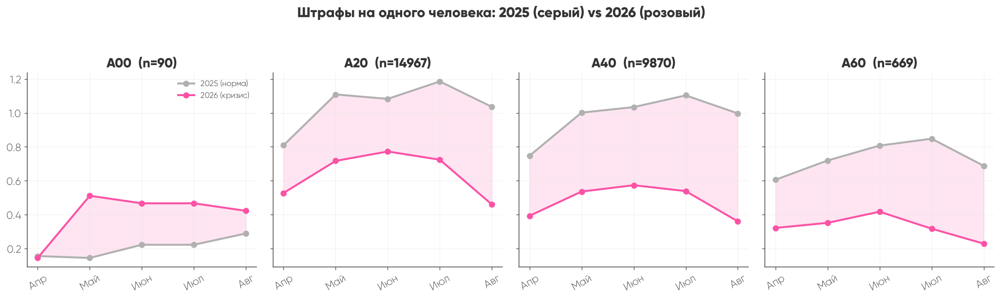


Изменение от апреля к августу (на человека):
------------------------------------------------------------
 A00  (n=  90)  2025:  +85.7%   2026: +192.3%   разница: +106.6%
 A20  (n=14967)  2025:  +27.9%   2026:  -12.9%   разница:  -40.8%
 A40  (n=9870)  2025:  +33.4%   2026:   -8.4%   разница:  -41.8%
 A60  (n= 669)  2025:  +13.6%   2026:  -28.8%   разница:  -42.4%


In [31]:
# ============================================================
# 5.0. Приведение типов
# ============================================================
if not pd.api.types.is_datetime64_any_dtype(fines['bill_offence_date']):
    fines['bill_offence_date'] = pd.to_datetime(
        fines['bill_offence_date'], errors='coerce'
    )

fines = fines.dropna(subset=['bill_offence_date']).copy()

# ============================================================
# 5.0.1. Ищем колонку-идентификатор человека
# ============================================================
CANDIDATES = [
    'person_id', 'client_id', 'driver_id', 'user_id', 'human_id',
    'dl_number', 'dl_id', 'license_number', 'licence_number',
    'driver_license', 'driver_licence',
]

def find_person_col(df, candidates):
    cols_lower = {c.lower(): c for c in df.columns}
    for cand in candidates:
        if cand.lower() in cols_lower:
            return cols_lower[cand.lower()]
    for c in df.columns:
        cl = c.lower()
        if any(k in cl for k in ['person', 'client', 'driver', 'dl_', 'license', 'licence']):
            return c
    return None

# 1) ищем в clients
PERSON_ID = find_person_col(clients, CANDIDATES)

# 2) есть ли эта колонка уже в fines?
PERSON_ID_IN_FINES = None
if PERSON_ID and PERSON_ID in fines.columns:
    PERSON_ID_IN_FINES = PERSON_ID
    print(f'✅ person_id уже есть в fines: {PERSON_ID}')
else:
    alt = find_person_col(fines, CANDIDATES)
    if alt:
        PERSON_ID_IN_FINES = alt
        print(f'✅ person_id найден в fines: {alt}')
        if PERSON_ID is None:
            PERSON_ID = alt

if PERSON_ID is None:
    print('⚠️  Ни в clients, ни в fines не найдена колонка человека — считаем НА МАШИНУ.')
    print('    clients:', clients.columns.tolist())
    print('    fines:  ', fines.columns.tolist())
    PERSON_ID = 'auto_document_id'
    PERSON_ID_IN_FINES = 'auto_document_id'
else:
    print(f'➡️  PERSON_ID (clients) = {PERSON_ID}')
    print(f'➡️  PERSON_ID (fines)   = {PERSON_ID_IN_FINES}')

# ============================================================
# 5.0.2. Карта "машина -> человек" и "человек -> возраст"
# ============================================================
car_to_person = (
    clients[['auto_document_id', PERSON_ID, 'age_type_code']]
    .drop_duplicates('auto_document_id')
)

def _top_age(s):
    s = s.dropna()
    if s.empty:
        return None
    return s.value_counts().idxmax()

person_age = (
    car_to_person
    .groupby(PERSON_ID)['age_type_code']
    .agg(_top_age)
    .rename('age_type_code')
    .reset_index()
)

n_no_age = person_age['age_type_code'].isna().sum()
if n_no_age:
    print(f'⚠️  Без age_type_code: {n_no_age} человек — выпадут из графиков.')

# ============================================================
# 5.1. Штрафы 2026 по месяцам НА ЧЕЛОВЕКА
# ============================================================
fines['year']  = fines['bill_offence_date'].dt.year
fines['month'] = fines['bill_offence_date'].dt.month

# --- приводим fines к виду, где есть колонка _person ---
if PERSON_ID_IN_FINES == PERSON_ID and PERSON_ID in fines.columns:
    # колонка уже правильная
    fines_p = fines.copy()
    fines_p['_person'] = fines_p[PERSON_ID]
else:
    # нужно смапить машину -> человека через merge
    if 'auto_document_id' not in fines.columns:
        link_candidates = [c for c in fines.columns
                           if 'auto' in c.lower() or 'document' in c.lower()]
        if not link_candidates:
            raise KeyError(
                f'Не нахожу колонку для merge. fines.columns = {fines.columns.tolist()}'
            )
        link = link_candidates[0]
        print(f'🔗 Связка через {link}')
    else:
        link = 'auto_document_id'

    map_df = (
        car_to_person[['auto_document_id', PERSON_ID]]
        .rename(columns={PERSON_ID: '_person'})
    )

    fines_p = fines.merge(map_df, on='auto_document_id', how='left')

m26 = (
    fines_p[fines_p['year'] == 2026]
    .groupby(['_person', 'month'])
    .size()
    .unstack(fill_value=0)
)
m26.columns = [f'm{int(c)}_2026' for c in m26.columns]
m26 = m26.reset_index().rename(columns={'_person': PERSON_ID})

# ============================================================
# 5.2. Собираем таблицу "по одному человеку"
# ============================================================
cols25 = ['april_2025_fines', 'may_2025_fines', 'jun_2025_fines',
          'jul_2025_fines',   'aug_2025_fines']
cols26 = ['m4_2026', 'm5_2026', 'm6_2026', 'm7_2026', 'm8_2026']

person_2025 = (
    clients[[PERSON_ID] + cols25]
    .groupby(PERSON_ID, as_index=False)[cols25]
    .sum()
)

df = (
    person_2025
    .merge(person_age, on=PERSON_ID, how='left')
    .merge(m26, on=PERSON_ID, how='left')
    .fillna(0)
)

df = df.dropna(subset=['age_type_code']).copy()

# ============================================================
# 5.3. Рисуем 4 графика — по возрасту (на человека)
# ============================================================
months = ['Апр', 'Май', 'Июн', 'Июл', 'Авг']

fig, axes = plt.subplots(1, 4, figsize=(16, 4.5), sharey=True)

for ax, age in zip(axes, ['A00', 'A20', 'A40', 'A60']):
    sub = df[df['age_type_code'] == age]

    if len(sub) < 30:
        ax.set_title(f'{age}  (n={len(sub)})')
        ax.text(0.5, 0.5, 'мало данных',
                ha='center', va='center', transform=ax.transAxes, color=GREY)
        continue

    m25 = sub[cols25].mean().values
    m26 = sub[cols26].mean().values

    ax.plot(months, m25, marker='o', color=GREY, label='2025 (норма)')
    ax.plot(months, m26, marker='o', color=PINK, label='2026 (кризис)')
    ax.fill_between(months, m25, m26, alpha=0.15, color=PINK)
    ax.set_title(f'{age}  (n={len(sub)})')
    ax.tick_params(axis='x', rotation=30)

    if age == 'A00':
        ax.legend(frameon=False, fontsize=9)

fig.suptitle('Штрафы на одного человека: 2025 (серый) vs 2026 (розовый)',
             y=1.05, fontsize=16, fontweight='bold', color=INK)

plt.tight_layout()
plt.savefig(KATE_DIR / '05_fines_by_age.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 5.4. Текстом — кто упал сильнее (на человека)
# ============================================================
print('\nИзменение от апреля к августу (на человека):')
print('-' * 60)
for age in ['A00', 'A20', 'A40', 'A60']:
    sub = df[df['age_type_code'] == age]
    if len(sub) < 30:
        print(f'{age:>4}  (n={len(sub):>4})  — мало данных')
        continue

    a25 = sub['april_2025_fines'].mean()
    g25 = sub['aug_2025_fines'].mean()
    a26 = sub['m4_2026'].mean()
    g26 = sub['m8_2026'].mean()

    ch25 = (g25 - a25) / a25 * 100 if a25 > 0 else 0
    ch26 = (g26 - a26) / a26 * 100 if a26 > 0 else 0
    diff = ch26 - ch25

    print(f'{age:>4}  (n={len(sub):>4})  '
          f'2025: {ch25:+6.1f}%   '
          f'2026: {ch26:+6.1f}%   '
          f'разница: {diff:+6.1f}%')

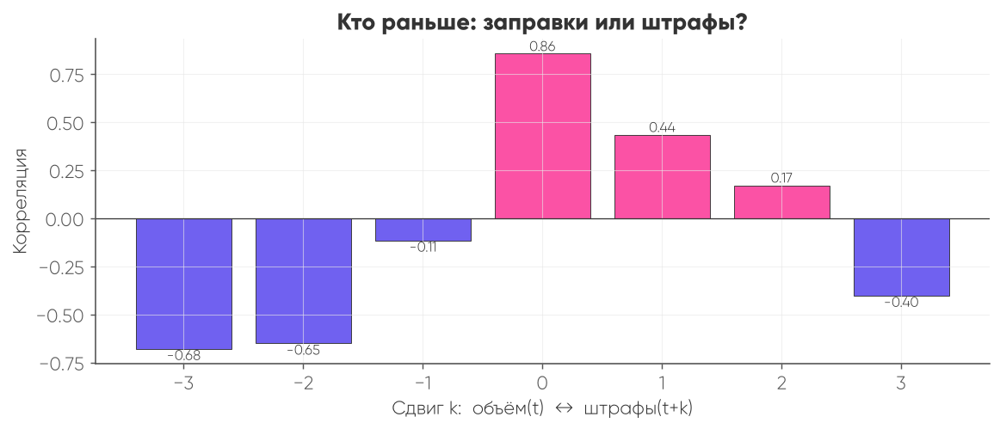

Максимум корреляции при сдвиге k = 0
→ Меняются одновременно


In [26]:
# ============================================================
# 6.1. Агрегация по месяцам
# ============================================================
fuel_clean['month'] = fuel_clean['order_datetime'].dt.to_period('M')
fines['month']      = fines['bill_offence_date'].dt.to_period('M')

vol     = fuel_clean.groupby('month')['order_fuel_volume'].sum()
n_fines = fines.groupby('month').size()

idx = vol.index.union(n_fines.index)
vol     = vol.reindex(idx, fill_value=0)
n_fines = n_fines.reindex(idx, fill_value=0)

# Нормируем, чтобы сравнивать корректно
vol_n = (vol - vol.mean()) / vol.std()
fin_n = (n_fines - n_fines.mean()) / n_fines.std()

# ============================================================
# 6.2. Корреляции для сдвигов от −3 до +3
# ============================================================
lags = list(range(-3, 4))
cors = [vol_n.corr(fin_n.shift(-k)) for k in lags]

fig, ax = plt.subplots(figsize=(9, 4))
colors = [PINK if c > 0 else PURPLE for c in cors]
ax.bar(lags, cors, color=colors, edgecolor=INK, linewidth=0.5)
ax.axhline(0, color=INK, linewidth=0.7)
ax.set_xlabel('Сдвиг k:  объём(t)  ↔  штрафы(t+k)')
ax.set_ylabel('Корреляция')
ax.set_title('Кто раньше: заправки или штрафы?')

for k, c in zip(lags, cors):
    ax.text(k, c, f'{c:.2f}', ha='center',
            va='bottom' if c > 0 else 'top', fontsize=9, color=INK)

plt.tight_layout()
plt.savefig(KATE_DIR / '06_lag_correlation.png', dpi=150, bbox_inches='tight')
plt.show()

best = lags[int(np.argmax(np.abs(cors)))]
print('Максимум корреляции при сдвиге k =', best)
if best > 0:
    print('→ Заправки меняются РАНЬШЕ штрафов')
elif best < 0:
    print('→ Штрафы меняются РАНЬШЕ заправок')
else:
    print('→ Меняются одновременно')

findfont: Failed to find font weight regular for Gilroy, now using 300.


                  клиентов  среднее_Δ_объёма  среднее_Δ_штрафов
group                                                          
не сократили          5951            188.82               1.22
новые                 1768            294.57               1.41
сильно сократили      4407           -293.81               0.59
слегка сократили      3377           -104.46               0.85


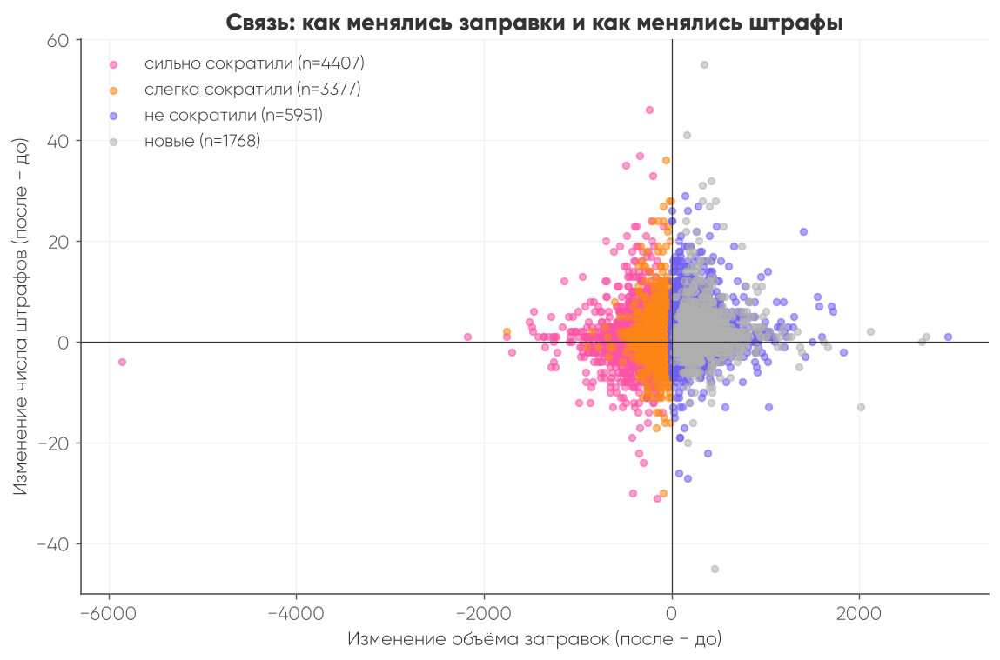

In [27]:
# ============================================================
# 7.1. До / после кризиса
# ============================================================
fuel_clean['crisis'] = fuel_clean['order_datetime']     >= '2026-06-01'
fines['crisis']      = fines['bill_offence_date']       >= '2026-06-01'

vol_by_client = (fuel_clean.groupby(['client_id', 'crisis'])['order_fuel_volume']
                 .sum().unstack(fill_value=0))
vol_by_client.columns = ['vol_before', 'vol_after']

fines_by_client = (fines.groupby(['client_id', 'crisis'])
                   .size().unstack(fill_value=0))
fines_by_client.columns = ['fines_before', 'fines_after']

data = vol_by_client.join(fines_by_client, how='inner').fillna(0)
data['delta_vol']   = data['vol_after']   - data['vol_before']
data['delta_fines'] = data['fines_after'] - data['fines_before']

# ============================================================
# 7.2. Кто в какую группу попадает
# ============================================================
def group(row):
    if row['vol_before'] == 0:
        return 'новые'
    if row['delta_vol'] < -0.5 * row['vol_before']:
        return 'сильно сократили'
    if row['delta_vol'] < 0:
        return 'слегка сократили'
    return 'не сократили'

data['group'] = data.apply(group, axis=1)

summary = data.groupby('group').agg(
    клиентов          = ('delta_fines', 'count'),
    среднее_Δ_объёма  = ('delta_vol',   'mean'),
    среднее_Δ_штрафов = ('delta_fines', 'mean'),
).round(2)

print(summary)

# ============================================================
# 7.3. Scatter: как изменились заправки vs как изменились штрафы
# ============================================================
fig, ax = plt.subplots(figsize=(9, 6))

group_colors = {
    'сильно сократили': PINK,
    'слегка сократили': ORANGE,
    'не сократили':     PURPLE,
    'новые':            GREY,
}

for g, color in group_colors.items():
    sub = data[data['group'] == g]
    ax.scatter(sub['delta_vol'], sub['delta_fines'],
               s=18, alpha=0.55, color=color, label=f'{g} (n={len(sub)})')

ax.axhline(0, color=INK, linewidth=0.7)
ax.axvline(0, color=INK, linewidth=0.7)
ax.set_xlabel('Изменение объёма заправок (после − до)')
ax.set_ylabel('Изменение числа штрафов (после − до)')
ax.set_title('Связь: как менялись заправки и как менялись штрафы')
ax.legend(frameon=False)
plt.tight_layout()
plt.savefig(KATE_DIR / '07_segments_vs_fines.png', dpi=150, bbox_inches='tight')
plt.show()

                         клиентов  сред_Δ_объёма_л  сред_Δ_штрафов_шт  \
group                                                                   
Заправляются как раньше      5951           188.82               1.22   
Появились после кризиса      1768           294.57               1.41   
Слегка урезали               3377          -104.46               0.85   
Урезали заправки вдвое       4407          -293.81               0.59   

                         сред_Δ_ставки  медиана_Δ_ставки  
group                                                     
Заправляются как раньше           0.68              0.70  
Появились после кризиса           0.63              0.76  
Слегка урезали                    0.80              0.78  
Урезали заправки вдвое            0.99              0.89  


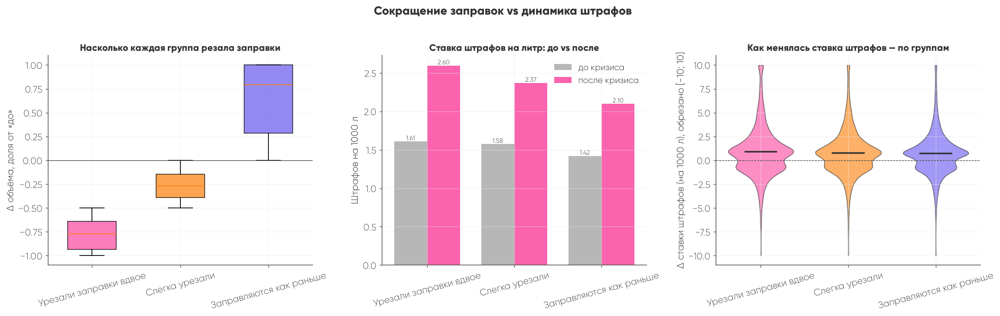


Проверка порога кризиса — меняется ли вывод:
------------------------------------------------------------

cutoff = 2026-04-01
            median   mean  count
grp                             
вдвое        2.950  3.601     34
как раньше   1.718  3.037  15441
слегка       1.917  2.853     28

cutoff = 2026-05-01
            median   mean  count
grp                             
вдвое        1.147  2.576    801
как раньше   1.294  2.031  13576
слегка       1.559  2.489   1126

cutoff = 2026-06-01
            median   mean  count
grp                             
вдвое        0.887  0.987   4407
как раньше   0.709  0.667   7719
слегка       0.780  0.795   3377

cutoff = 2026-07-01
            median   mean  count
grp                             
вдвое       -0.655 -0.617   8784
как раньше  -0.839 -1.079   3706
слегка      -0.650 -0.552   3013


In [36]:
# ============================================================
# 7.1. До / после кризиса
# ============================================================
fuel_clean['crisis'] = fuel_clean['order_datetime'] >= '2026-06-01'
fines['crisis']      = fines['bill_offence_date']   >= '2026-06-01'

vol_by_client = (fuel_clean.groupby(['client_id', 'crisis'])['order_fuel_volume']
                 .sum().unstack(fill_value=0))
vol_by_client.columns = ['vol_before', 'vol_after']

fines_by_client = (fines.groupby(['client_id', 'crisis'])
                   .size().unstack(fill_value=0))
fines_by_client.columns = ['fines_before', 'fines_after']

data = vol_by_client.join(fines_by_client, how='inner').fillna(0)
data['delta_vol']   = data['vol_after']   - data['vol_before']
data['delta_fines'] = data['fines_after'] - data['fines_before']

# ============================================================
# 7.2. Кто в какую группу попадает
# ============================================================
def group(row):
    if row['vol_before'] == 0:
        return 'Появились после кризиса'
    if row['delta_vol'] < -0.5 * row['vol_before']:
        return 'Урезали заправки вдвое'
    if row['delta_vol'] < 0:
        return 'Слегка урезали'
    return 'Заправляются как раньше'

data['group'] = data.apply(group, axis=1)

# ============================================================
# 7.2.1. Нормированные метрики
# ============================================================
EPS = 1.0
data['rate_before'] = data['fines_before'] / (data['vol_before'] / 1000 + EPS)
data['rate_after']  = data['fines_after']  / (data['vol_after']  / 1000 + EPS)
data['delta_rate']  = data['rate_after'] - data['rate_before']

data['vol_pct'] = data.apply(
    lambda r: (r['delta_vol'] / r['vol_before']) if r['vol_before'] > 0 else 0,
    axis=1
)

summary = data.groupby('group').agg(
    клиентов           = ('delta_fines', 'count'),
    сред_Δ_объёма_л    = ('delta_vol',   'mean'),
    сред_Δ_штрафов_шт  = ('delta_fines', 'mean'),
    сред_Δ_ставки      = ('delta_rate',  'mean'),
    медиана_Δ_ставки   = ('delta_rate',  'median'),
).round(2)

print(summary)

# ============================================================
# 7.3. Три графика — каждый про свою мысль
# ============================================================
group_colors = {
    'Урезали заправки вдвое':  PINK,
    'Слегка урезали':          ORANGE,
    'Заправляются как раньше': PURPLE,
    'Появились после кризиса': GREY,
}
groups_order = list(group_colors.keys())
groups_present = [g for g in groups_order if g in data['group'].unique()]

# «новички» исключаются из графиков, где нужен baseline «до»
groups_with_base = [g for g in groups_present if g != 'Появились после кризиса']

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

# --- 7.3.1. box: насколько реально резали заправки -------------------
ax = axes[0]
plot_data = [data.loc[data['group'] == g, 'vol_pct'].clip(-1, 1).values
             for g in groups_with_base]
try:
    bp = ax.boxplot(plot_data, tick_labels=groups_with_base,
                    patch_artist=True, showfliers=False, widths=0.55)
except TypeError:
    bp = ax.boxplot(plot_data, labels=groups_with_base,
                    patch_artist=True, showfliers=False, widths=0.55)
for patch, g in zip(bp['boxes'], groups_with_base):
    patch.set_facecolor(group_colors[g])
    patch.set_alpha(0.75)
ax.axhline(0, color=INK, linewidth=0.7)
ax.set_ylabel('Δ объёма, доля от «до»')
ax.set_title('Насколько каждая группа резала заправки', fontsize=12)
ax.tick_params(axis='x', rotation=15)

# --- 7.3.2. grouped bar: ставка на 1000 л, до vs после --------------
ax = axes[1]
x = np.arange(len(groups_with_base))
w = 0.38
before = data.groupby('group')['rate_before'].mean().reindex(groups_with_base)
after  = data.groupby('group')['rate_after'].mean().reindex(groups_with_base)

b1 = ax.bar(x - w/2, before.values, w, label='до кризиса',   color=GREY, alpha=0.9)
b2 = ax.bar(x + w/2, after.values,  w, label='после кризиса', color=PINK, alpha=0.9)

for bars in (b1, b2):
    for b in bars:
        h = b.get_height()
        ax.text(b.get_x() + b.get_width()/2, h, f'{h:.2f}',
                ha='center', va='bottom', fontsize=8)

ax.set_xticks(x)
ax.set_xticklabels(groups_with_base, rotation=15)
ax.set_ylabel('Штрафов на 1000 л')
ax.set_title('Ставка штрафов на литр: до vs после', fontsize=12)
ax.legend(frameon=False)

# --- 7.3.3. violin: распределение Δ ставки штрафов по группам -------
ax = axes[2]
violin_data = [data.loc[data['group'] == g, 'delta_rate'].clip(-10, 10).values
               for g in groups_with_base]

parts = ax.violinplot(violin_data, showmedians=True, showextrema=False,
                      widths=0.75)
for pc, g in zip(parts['bodies'], groups_with_base):
    pc.set_facecolor(group_colors[g])
    pc.set_alpha(0.65)
    pc.set_edgecolor(INK)
parts['cmedians'].set_color(INK)
parts['cmedians'].set_linewidth(2)

ax.axhline(0, color=INK, linewidth=0.7, linestyle='--')
ax.set_xticks(np.arange(1, len(groups_with_base) + 1))
ax.set_xticklabels(groups_with_base, rotation=15)
ax.set_ylabel('Δ ставки штрафов (на 1000 л), обрезано [-10; 10]')
ax.set_title('Как менялась ставка штрафов — по группам', fontsize=12)

fig.suptitle('Сокращение заправок vs динамика штрафов',
             y=1.02, fontsize=15, fontweight='bold', color=INK)

plt.tight_layout()
plt.savefig(KATE_DIR / '07_segments_vs_fines.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 7.4. Проверка устойчивости: разные пороги кризиса
# ============================================================
print('\nПроверка порога кризиса — меняется ли вывод:')
print('-' * 60)
for cutoff in ['2026-04-01', '2026-05-01', '2026-06-01', '2026-07-01']:
    fc = fuel_clean.copy()
    fn = fines.copy()
    fc['crisis'] = fc['order_datetime'] >= cutoff
    fn['crisis'] = fn['bill_offence_date'] >= cutoff

    v = (fc.groupby(['client_id', 'crisis'])['order_fuel_volume']
         .sum().unstack(fill_value=0))
    v.columns = ['b', 'a']
    f = (fn.groupby(['client_id', 'crisis']).size().unstack(fill_value=0))
    f.columns = ['fb', 'fa']

    d = v.join(f, how='inner').fillna(0)
    d['rb'] = d['fb'] / (d['b'] / 1000 + EPS)
    d['ra'] = d['fa'] / (d['a'] / 1000 + EPS)
    d['dr'] = d['ra'] - d['rb']
    d['grp'] = np.where(d['a'] < 0.5 * d['b'], 'вдвое',
                np.where(d['a'] < d['b'], 'слегка', 'как раньше'))

    agg = d.groupby('grp')['dr'].agg(['median', 'mean', 'count']).round(3)
    print(f'\ncutoff = {cutoff}')
    print(agg)

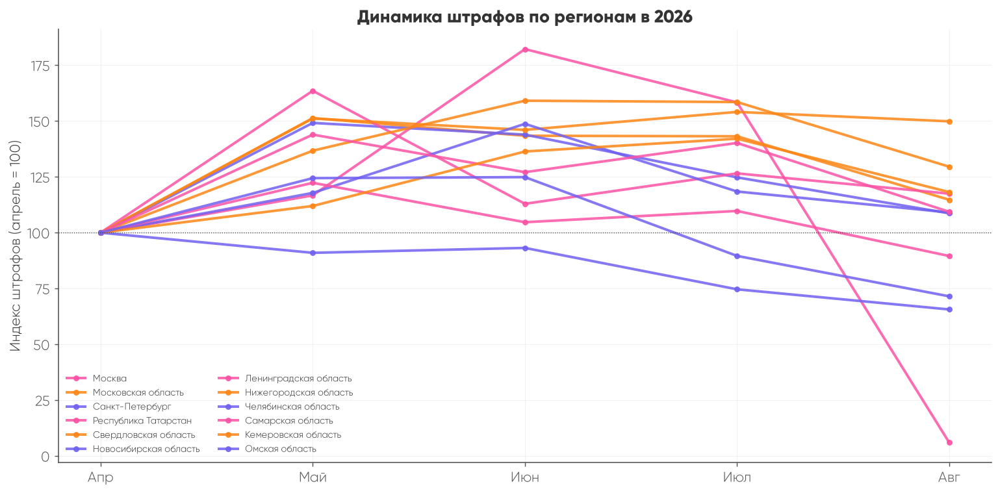

In [38]:
# ============================================================
# 8.1. Топ-12 регионов по числу штрафов
# ============================================================
top_regions = fines['region_name'].value_counts().head(12).index

reg_month = (fines[fines['year'] == 2026]
             .groupby(['region_name', 'month'])
             .size()
             .unstack(fill_value=0))

reg_month = reg_month.loc[top_regions]

# оставляем только нужные месяцы (апрель–август)
MONTHS = [4, 5, 6, 7, 8]
reg_month = reg_month.reindex(columns=MONTHS, fill_value=0)

# индекс к апрелю; защищаемся от апреля = 0
base = reg_month[4].replace(0, np.nan)
index = reg_month.div(base, axis=0) * 100

# регионы без апрельской базы выбрасываем — их индекс бессмыслен
index = index.dropna(how='all')

# ============================================================
# 8.2. График
# ============================================================
fig, ax = plt.subplots(figsize=(12, 6))

palette = [PINK, ORANGE, PURPLE]
for i, region in enumerate(index.index):
    color = palette[i % len(palette)]
    ax.plot(MONTHS, index.loc[region].values,
            marker='o', ms=4, color=color, label=region, alpha=0.85)

ax.axhline(100, color=INK, linestyle=':', linewidth=0.7)
ax.set_xticks(MONTHS)
ax.set_xticklabels(['Апр', 'Май', 'Июн', 'Июл', 'Авг'])
ax.set_ylabel('Индекс штрафов (апрель = 100)')
ax.set_title('Динамика штрафов по регионам в 2026')
ax.legend(frameon=False, fontsize=8, ncol=2)
plt.tight_layout()
plt.savefig(KATE_DIR / '08_regions.png', dpi=150, bbox_inches='tight')
plt.show()

findfont: Failed to find font weight bold for Gilroy, now using 800.


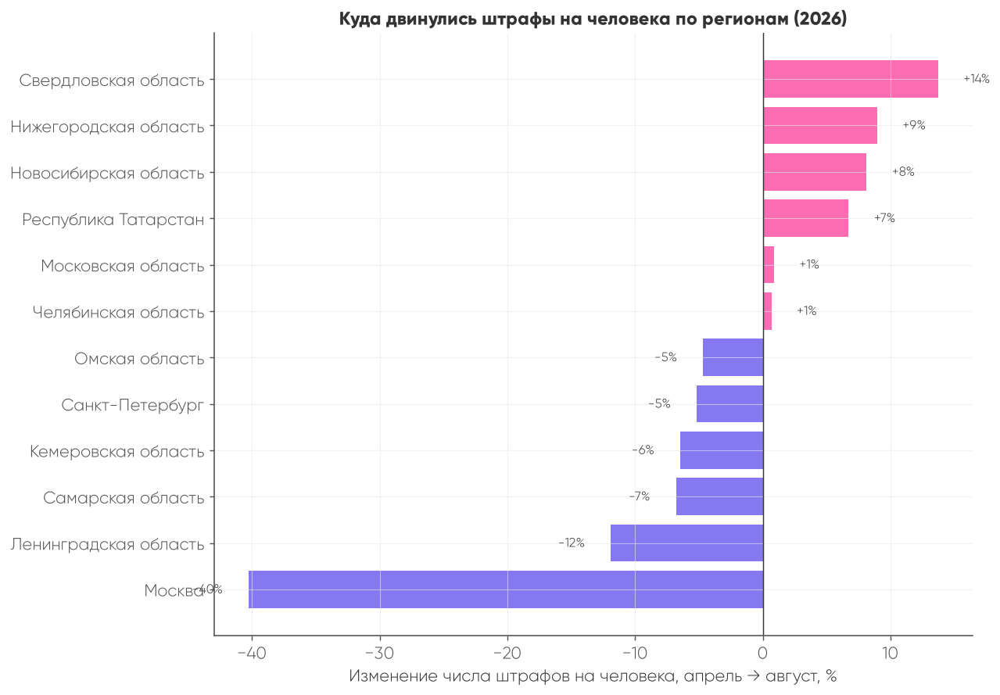

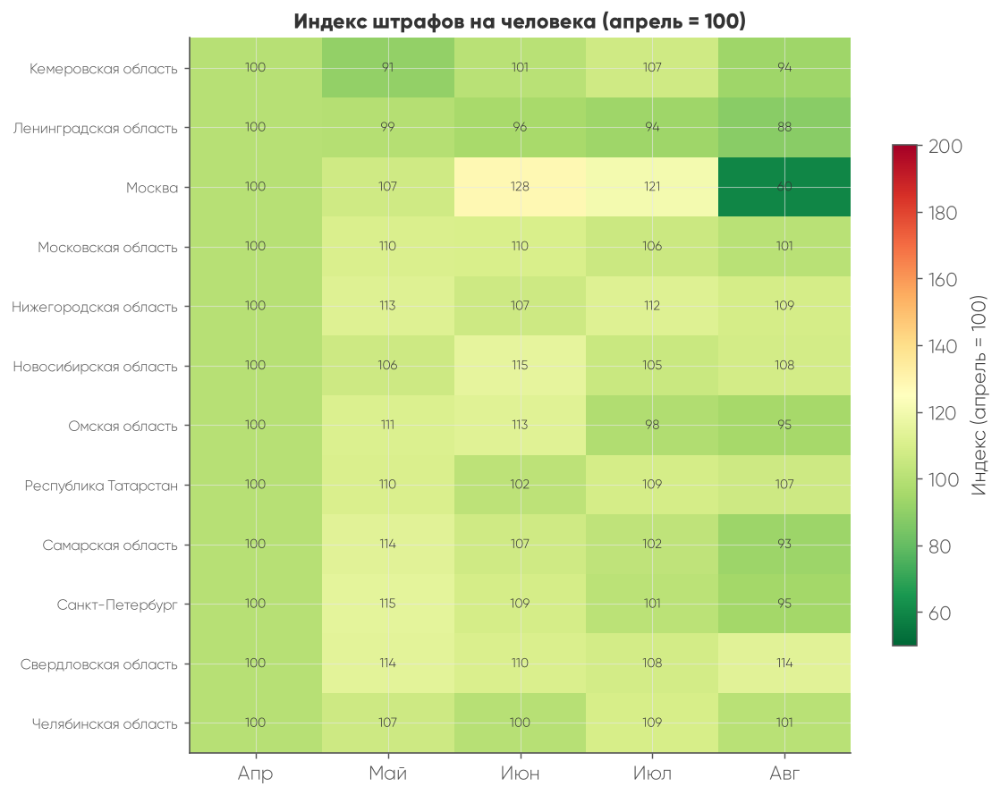

In [39]:
# ============================================================
# 8.1. Штрафы на человека по регионам и месяцам
# ============================================================
# client_id есть в fines (использовался в блоке 7)
# если у тебя другой столбец — замени ниже
PERSON = 'client_id'

top_regions = fines['region_name'].value_counts().head(12).index

reg_month = (
    fines[(fines['year'] == 2026) & (fines['region_name'].isin(top_regions))]
    .groupby(['region_name', 'month'])
    .agg(
        fines  = (PERSON, 'size'),       # всего штрафов
        people = (PERSON, 'nunique'),    # сколько людей оштрафовано
    )
    .reset_index()
)

# штрафов на одного оштрафованного человека
reg_month['per_person'] = reg_month['fines'] / reg_month['people']

# пивот: регион × месяц
pivot = (reg_month
         .pivot(index='region_name', columns='month', values='per_person'))

MONTHS = [4, 5, 6, 7, 8]
pivot = pivot.reindex(columns=MONTHS)

# ============================================================
# 8.2. Горизонтальный bar: изменение апрель → август в %
# ============================================================
base = pivot[4].replace(0, np.nan)
change = (pivot[8] / base - 1) * 100
change = change.dropna().sort_values()

fig, ax = plt.subplots(figsize=(10, 7))

colors = [PINK if v > 0 else PURPLE for v in change.values]
bars = ax.barh(change.index, change.values, color=colors, alpha=0.85)

ax.axvline(0, color=INK, linewidth=0.8)
ax.set_xlabel('Изменение числа штрафов на человека, апрель → август, %')
ax.set_title('Куда двинулись штрафы на человека по регионам (2026)',
             fontsize=13, fontweight='bold', color=INK)

# подписи значений у баров
for b, v in zip(bars, change.values):
    ax.text(v + (2 if v >= 0 else -2), b.get_y() + b.get_height()/2,
            f'{v:+.0f}%', va='center',
            ha='left' if v >= 0 else 'right', fontsize=9)

plt.tight_layout()
plt.savefig(KATE_DIR / '08_regions.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 8.3. (опционально) Тепловая карта: регион × месяц, индекс к апрелю
# ============================================================
idx = pivot.div(base, axis=0) * 100

fig, ax = plt.subplots(figsize=(9, 7))
im = ax.imshow(idx.values, aspect='auto', cmap='RdYlGn_r',
               vmin=50, vmax=200)

ax.set_xticks(np.arange(len(MONTHS)))
ax.set_xticklabels(['Апр', 'Май', 'Июн', 'Июл', 'Авг'])
ax.set_yticks(np.arange(len(idx.index)))
ax.set_yticklabels(idx.index, fontsize=9)

# числа в клетках
for i in range(idx.shape[0]):
    for j in range(idx.shape[1]):
        v = idx.values[i, j]
        if not np.isnan(v):
            ax.text(j, i, f'{v:.0f}', ha='center', va='center',
                    fontsize=8, color=INK)

ax.set_title('Индекс штрафов на человека (апрель = 100)',
             fontsize=13, fontweight='bold', color=INK)
fig.colorbar(im, ax=ax, shrink=0.7, label='Индекс (апрель = 100)')
plt.tight_layout()
plt.savefig(KATE_DIR / '08_regions_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

Штрафов без региона: 0
Регионов в данных: 16

Регионов в анализе: 16
База: среднее за апрель–май 2026
После: среднее за июнь–август 2026

                    per_person_before  per_person_after  change_pct  \
region_name                                                           
Ленинградская обл.               2.28              2.10       -7.78   
Краснодарский край               2.19              2.03       -7.16   
Самарская обл.                   1.99              1.89       -4.84   
Санкт-Петербург                  2.25              2.17       -3.90   
Башкортостан                     2.10              2.02       -3.78   
Тюменская обл.                   2.05              2.03       -0.91   
Московская обл.                  2.26              2.25       -0.28   
Татарстан                        2.00              2.03        1.53   
Свердловская обл.                1.83              1.86        1.79   
Омская обл.                      2.02              2.08        2.86   
Москва    

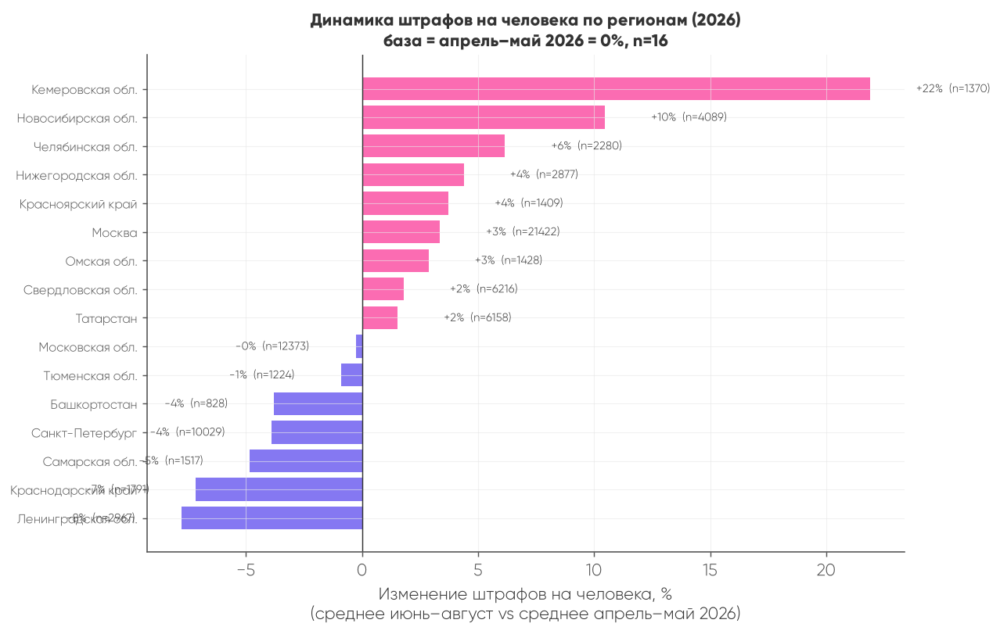

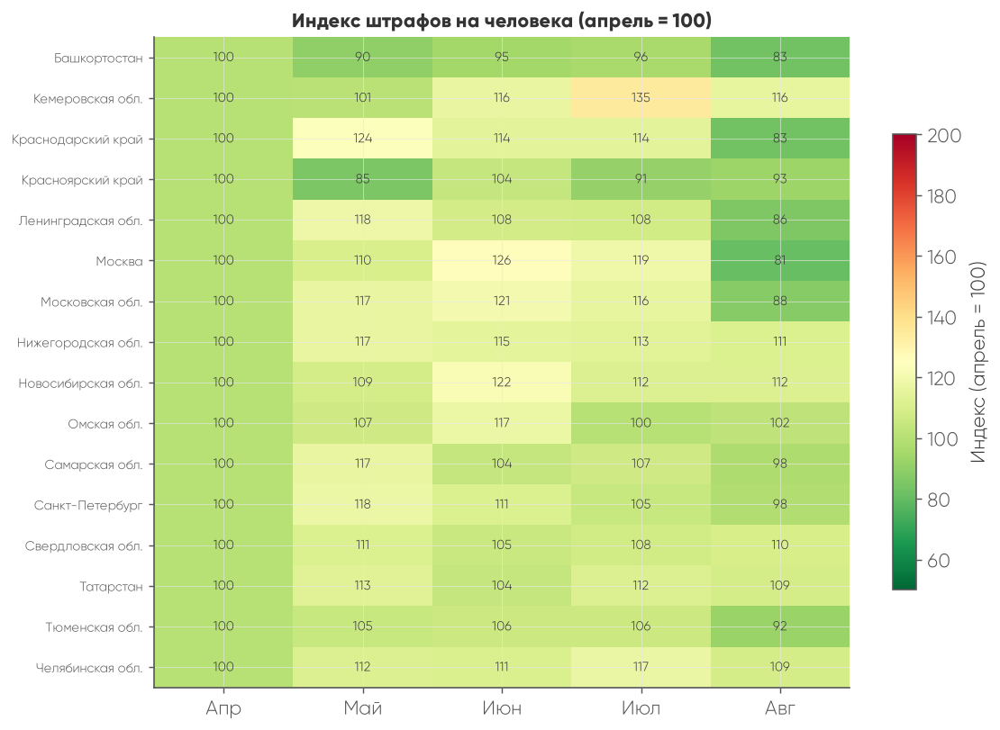

In [41]:
# ============================================================
# 8.0. Словарь кодов КЛАДР -> названия регионов
# ============================================================
KLADR_NAMES = {
    '02': 'Башкортостан',
    '16': 'Татарстан',
    '23': 'Краснодарский край',
    '24': 'Красноярский край',
    '42': 'Кемеровская обл.',
    '47': 'Ленинградская обл.',
    '50': 'Московская обл.',
    '52': 'Нижегородская обл.',
    '54': 'Новосибирская обл.',
    '55': 'Омская обл.',
    '63': 'Самарская обл.',
    '66': 'Свердловская обл.',
    '72': 'Тюменская обл.',
    '74': 'Челябинская обл.',
    '77': 'Москва',
    '78': 'Санкт-Петербург',
}

# нормализуем код: '2' -> '02', 2 -> '02'
def norm_kladr(x):
    if pd.isna(x):
        return None
    s = str(int(x)) if isinstance(x, (int, float)) else str(x)
    return s.zfill(2)

# ============================================================
# 8.1. Привязываем регион к штрафам
#    (регион лежит в clients — джойним по client_id)
# ============================================================
clients_reg = (
    clients[['client_id', 'kladr_code']]
    .drop_duplicates('client_id')
    .assign(region=lambda d: d['kladr_code'].apply(norm_kladr))
    [['client_id', 'region']]
)

fines_r = fines.merge(clients_reg, on='client_id', how='left')
fines_r = fines_r.dropna(subset=['region'])
fines_r['region_name'] = fines_r['region'].map(KLADR_NAMES).fillna(fines_r['region'])

print('Штрафов без региона:', fines_r['region'].isna().sum())
print('Регионов в данных:', fines_r['region_name'].nunique())

# ============================================================
# 8.2. Штрафы на человека по регионам и месяцам
# ============================================================
MONTHS = [4, 5, 6, 7, 8]

reg_month = (
    fines_r[fines_r['year'] == 2026]
    .groupby(['region_name', 'month'])
    .agg(
        fines  = ('client_id', 'size'),
        people = ('client_id', 'nunique'),
    )
    .reset_index()
)
reg_month['per_person'] = reg_month['fines'] / reg_month['people']

pivot = (reg_month
         .pivot(index='region_name', columns='month', values='per_person')
         .reindex(columns=MONTHS))

# ============================================================
# 8.3. Среднее апрель-май = 100%, среднее июнь-август = «стало»
# ============================================================
BEFORE = [4, 5]
AFTER  = [6, 7, 8]

before_mean = pivot[BEFORE].mean(axis=1)
after_mean  = pivot[AFTER].mean(axis=1)
change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100

region_size = (
    fines_r[fines_r['year'] == 2026]
    .groupby('region_name').size()
    .reindex(pivot.index)
)

result = pd.DataFrame({
    'per_person_before': before_mean,
    'per_person_after':  after_mean,
    'change_pct':        change,
    'fines_total':       region_size,
}).dropna(subset=['change_pct'])

result = result[result['fines_total'] >= 10]
result = result.sort_values('change_pct')

print(f'\nРегионов в анализе: {len(result)}')
print(f'База: среднее за апрель–май 2026')
print(f'После: среднее за июнь–август 2026\n')
print(result[['per_person_before', 'per_person_after',
              'change_pct', 'fines_total']].round(2))

# ============================================================
# 8.4. Горизонтальный bar — все регионы
# ============================================================
n = len(result)
fig, ax = plt.subplots(figsize=(10, max(6, n * 0.4)))

colors = [PINK if v > 0 else PURPLE for v in result['change_pct'].values]
bars = ax.barh(result.index, result['change_pct'].values,
               color=colors, alpha=0.85)

ax.axvline(0, color=INK, linewidth=0.8)
ax.set_xlabel('Изменение штрафов на человека, %\n'
              '(среднее июнь–август vs среднее апрель–май 2026)')
ax.set_title(f'Динамика штрафов на человека по регионам (2026)\n'
             f'база = апрель–май 2026 = 0%, n={n}',
             fontsize=12, fontweight='bold', color=INK)

for b, v, total in zip(bars, result['change_pct'].values,
                       result['fines_total'].values):
    ax.text(v + (2 if v >= 0 else -2),
            b.get_y() + b.get_height()/2,
            f'{v:+.0f}%  (n={total})',
            va='center',
            ha='left' if v >= 0 else 'right',
            fontsize=8)

ax.tick_params(axis='y', labelsize=9)
plt.tight_layout()
plt.savefig(KATE_DIR / '08_regions.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 8.5. (опционально) Тепловая карта: регион × месяц, индекс к апрелю
# ============================================================
idx = pivot.div(pivot[4].replace(0, np.nan), axis=0) * 100

fig, ax = plt.subplots(figsize=(9, max(5, n * 0.4)))
im = ax.imshow(idx.values, aspect='auto', cmap='RdYlGn_r',
               vmin=50, vmax=200)

ax.set_xticks(np.arange(len(MONTHS)))
ax.set_xticklabels(['Апр', 'Май', 'Июн', 'Июл', 'Авг'])
ax.set_yticks(np.arange(len(idx.index)))
ax.set_yticklabels(idx.index, fontsize=8)

for i in range(idx.shape[0]):
    for j in range(idx.shape[1]):
        v = idx.values[i, j]
        if not np.isnan(v):
            ax.text(j, i, f'{v:.0f}', ha='center', va='center',
                    fontsize=8, color=INK)

ax.set_title('Индекс штрафов на человека (апрель = 100)',
             fontsize=12, fontweight='bold', color=INK)
fig.colorbar(im, ax=ax, shrink=0.7, label='Индекс (апрель = 100)')
plt.tight_layout()
plt.savefig(KATE_DIR / '08_regions_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

In [42]:
print('=== fines.columns ===')
print(fines.columns.tolist())

# ищем колонку-статью по ключевым словам
cand = [c for c in fines.columns if any(k in c.lower() for k in
        ['article', 'koap', 'offence_type', 'violation', 'fine_type',
         'offense', 'statya', 'code', 'type', 'reason', 'purpose'])]
print('\nКандидаты на статью:', cand)

# для каждого кандидата — сколько уникальных значений и топ-5
for c in cand:
    print(f'\n--- {c} ---')
    print(fines[c].value_counts(dropna=False).head(10))

=== fines.columns ===
['client_id', 'bill_id', 'offence_short_statement', 'total_fine_amount', 'region_name', 'bill_offence_date', 'auto_document_id', 'year', 'month', 'crisis']

Кандидаты на статью: []


Уникальных значений: 25

Топ-20 самых частых:
offence_short_statement
Превышение скорости на 20-40 км/ч                                                    62608
Не пристегнут ремень безопасности                                                     3718
Нарушение разметки                                                                    3083
Превышение скорости на 40-60 км/ч                                                     1496
Использование телефона за рулем                                                       1265
Проезд на красный сигнал светофора                                                     851
Движение по выделенной полосе                                                          834
Пересечение стоп-линии                                                                 713
Остановка или стоянка в неположенном месте (Москва и Санкт-Петербург)                  491
Остановка или стоянка в неположенном месте                                             460
Неоплаченный проезд 

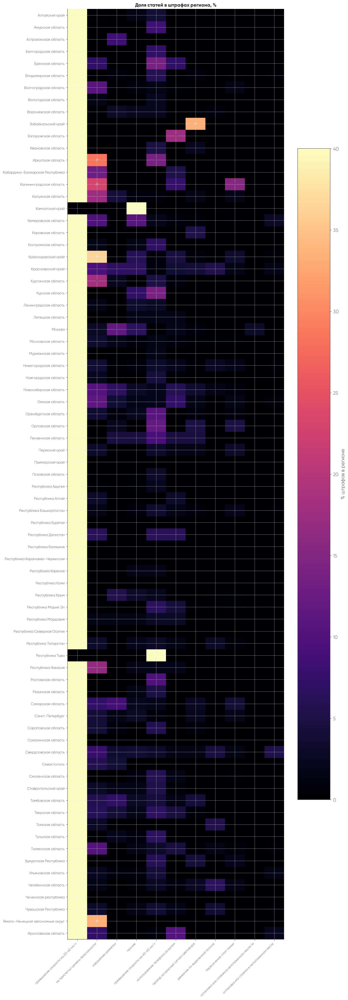


=== Топ-10 падающих статей ===
                                                before    after  change_pct  \
article_name                                                                  
остановка или стоянка в неположенном месте        95.0     80.3       -15.4   
превышение скорости на 40-60 км/ч                307.0    265.3       -13.6   
проезд на красный сигнал светофора               164.0    156.3        -4.7   
остановка или стоянка в неположенном месте (м     91.5     88.3        -3.5   
прочие                                           440.0    456.7         3.8   
превышение скорости на 20-40 км/ч              11419.5  11932.3         4.5   
не пристегнут ремень безопасности                685.0    738.7         7.8   
пересечение стоп-линии                           127.0    140.7        10.8   
нарушение разметки                               510.5    587.3        15.1   
движение по выделенной полосе                    133.5    172.0        28.8   

                   

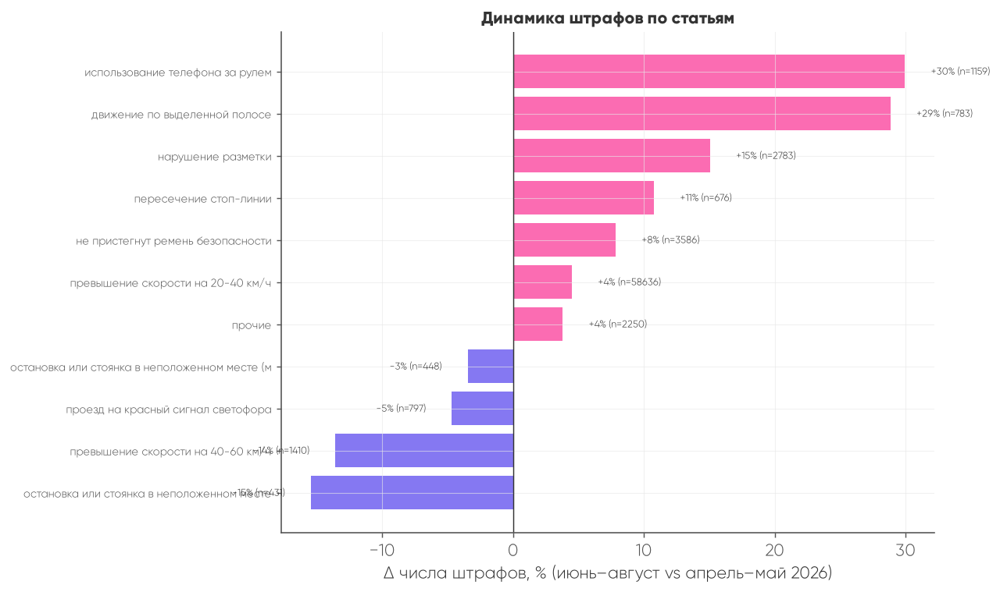


=== Изменение доли статей (процентные пункты) ===
period                                            до  после  delta_pp
article_name                                                         
превышение скорости на 20-40 км/ч              80.59  80.12     -0.48
превышение скорости на 40-60 км/ч               2.17   1.78     -0.39
остановка или стоянка в неположенном месте      0.67   0.54     -0.13
не пристегнут ремень безопасности               4.83   4.73     -0.10
проезд на красный сигнал светофора              1.16   1.05     -0.10
остановка или стоянка в неположенном месте (м   0.65   0.62     -0.03
пересечение стоп-линии                          0.90   0.92      0.03
прочие                                          3.11   3.18      0.08
движение по выделенной полосе                   0.94   1.14      0.20
использование телефона за рулем                 1.39   1.76      0.37
...
period                                           до  после  delta_pp
article_name                        

In [45]:
# ============================================================
# 8.0. ДИАГНОСТИКА: что вообще лежит в offence_short_statement
# ============================================================
print('Уникальных значений:', fines['offence_short_statement'].nunique())
print('\nТоп-20 самых частых:')
print(fines['offence_short_statement'].value_counts(dropna=False).head(20))
print('\n5 случайных примеров:')
for s in fines['offence_short_statement'].dropna().sample(5, random_state=42):
    print(' •', repr(str(s))[:160])

# ============================================================
# 8.0.1. Парсим статью — с двумя стратегиями
# ============================================================
import re

def extract_article_num(s):
    if pd.isna(s):
        return None
    m = re.search(r'\b(\d{1,2}\.\d{1,2}(?:\.\d{1,2})?)\b', str(s))
    return m.group(1) if m else None

fines['article_num'] = fines['offence_short_statement'].apply(extract_article_num)
share_num = fines['article_num'].notna().mean()
print(f'\nДоля штрафов с распознанным номером: {share_num:.1%}')

if share_num < 0.3:
    print('⚠️  Номеров мало. Использую сырой текст offence_short_statement.')
    fines['article_key'] = (fines['offence_short_statement']
                            .astype(str)
                            .str.strip()
                            .str.lower())
else:
    print('✅ Номеров достаточно. Использую номер статьи.')
    fines['article_key'] = fines['article_num']

print('\nТоп-20 article_key:')
print(fines['article_key'].value_counts().head(20))

# ============================================================
# 8.0.2. Человекочитаемое имя (для подписей на графиках)
# ============================================================
KOAP_NAMES = {
    '12.9':  '12.9 — скорость',
    '12.16': '12.16 — разметка/знаки',
    '12.15': '12.15 — расположение ТС',
    '12.12': '12.12 — красный свет',
    '12.18': '12.18 — не уступил пешеходу',
    '12.14': '12.14 — манёвр',
    '12.17': '12.17 — помеха спецтранспорту',
    '12.19': '12.19 — парковка',
    '12.5':  '12.5 — неисправность ТС',
    '12.6':  '12.6 — не пристёгнут',
    '12.8':  '12.8 — опьянение',
    '12.13': '12.13 — перекрёсток',
    '12.21': '12.21 — перевозка',
    '12.37': '12.37 — ОСАГО',
    '12.20': '12.20 — световые приборы',
}

def pretty_name(x):
    if x is None:
        return 'не распознано'
    if x in KOAP_NAMES:
        return KOAP_NAMES[x]
    s = str(x)
    # обрезаем длинные строки
    return s if len(s) <= 45 else s[:42] + '…'

# если используем сырой текст — обрезаем для подписей
if share_num < 0.3:
    fines['article_name'] = (fines['article_key']
                             .str.slice(0, 45)
                             .str.replace(r'\s+', ' ', regex=True))
else:
    fines['article_name'] = fines['article_key'].map(pretty_name)

# оставляем только топ-10 статей, остальные — «прочие»
top10 = fines['article_name'].value_counts().head(10).index
fines['article_name'] = np.where(
    fines['article_name'].isin(top10),
    fines['article_name'],
    'прочие'
)

# ============================================================
# 8.1. Структура статей по регионам (2026)
# ============================================================
MONTHS = [4, 5, 6, 7, 8]

f26 = fines[(fines['year'] == 2026) & (fines['article_name'] != 'не распознано')].copy()

print(f'\nf26 — строк:', len(f26))
print('Уникальных регионов:', f26['region_name'].nunique())
print('Уникальных статей (после топ-10):', f26['article_name'].nunique())

art_reg = (
    f26
    .groupby(['region_name', 'article_name'])
    .size()
    .rename('cnt')
    .reset_index()
)
art_reg['share'] = art_reg.groupby('region_name')['cnt'].transform(
    lambda s: s / s.sum()
)

top_by_region = (
    art_reg.sort_values(['region_name', 'share'], ascending=[True, False])
    .groupby('region_name').head(3)
)
print('\n=== Топ-3 статьи в каждом регионе ===')
print(top_by_region.to_string(index=False))

# ============================================================
# 8.2. Тепловая карта: регион × статья (доля, %)
# ============================================================
pivot_art = (
    art_reg
    .pivot(index='region_name', columns='article_name', values='share')
    .fillna(0)
)

# порядок статей по частоте
order = f26['article_name'].value_counts().index.tolist()
pivot_art = pivot_art.reindex(columns=[c for c in order if c in pivot_art.columns],
                              fill_value=0)

print('\npivot_art.shape:', pivot_art.shape)

if pivot_art.shape[0] >= 2 and pivot_art.shape[1] >= 2:
    fig, ax = plt.subplots(figsize=(12, max(5, len(pivot_art) * 0.45)))
    im = ax.imshow(pivot_art.values * 100, aspect='auto',
                   cmap='magma', vmin=0, vmax=40)

    ax.set_xticks(np.arange(pivot_art.shape[1]))
    ax.set_xticklabels(pivot_art.columns, rotation=45, ha='right', fontsize=8)
    ax.set_yticks(np.arange(pivot_art.shape[0]))
    ax.set_yticklabels(pivot_art.index, fontsize=9)

    for i in range(pivot_art.shape[0]):
        for j in range(pivot_art.shape[1]):
            v = pivot_art.values[i, j] * 100
            if v >= 1:
                ax.text(j, i, f'{v:.0f}', ha='center', va='center',
                        fontsize=7, color='white' if v > 20 else INK)

    ax.set_title('Доля статей в штрафах региона, %',
                 fontsize=12, fontweight='bold', color=INK)
    fig.colorbar(im, ax=ax, shrink=0.7, label='% штрафов в регионе')
    plt.tight_layout()
    plt.savefig(KATE_DIR / '08_articles_heatmap.png', dpi=150, bbox_inches='tight')
    plt.show()
elif pivot_art.shape[0] >= 1 and pivot_art.shape[1] == 1:
    art_name = pivot_art.columns[0]
    s = pivot_art[art_name].sort_values()
    fig, ax = plt.subplots(figsize=(10, max(4, len(s) * 0.35)))
    ax.barh(s.index, s.values * 100, color=PINK, alpha=0.85)
    ax.set_xlabel(f'Доля «{art_name}» в штрафах региона, %')
    ax.set_title(f'Одна статья: «{art_name}»', fontsize=12,
                 fontweight='bold', color=INK)
    ax.tick_params(axis='y', labelsize=9)
    plt.tight_layout()
    plt.savefig(KATE_DIR / '08_articles_heatmap.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print('⚠️  pivot_art пустой — рисовать нечего.')

# ============================================================
# 8.3. Динамика статей: апрель-май vs июнь-август
# ============================================================
BEFORE = [4, 5]
AFTER  = [6, 7, 8]

art_month = (
    f26
    .groupby(['article_name', 'month'])
    .size()
    .unstack(fill_value=0)
    .reindex(columns=MONTHS, fill_value=0)
)

before_mean = art_month[BEFORE].mean(axis=1)
after_mean  = art_month[AFTER].mean(axis=1)
change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100
total       = art_month.sum(axis=1)

art_dyn = pd.DataFrame({
    'before': before_mean,
    'after':  after_mean,
    'change_pct': change,
    'total': total,
}).dropna()
art_dyn = art_dyn[art_dyn['total'] >= 100].sort_values('change_pct')

print('\n=== Топ-10 падающих статей ===')
print(art_dyn.head(10).round(1))
print('\n=== Топ-10 растущих статей ===')
print(art_dyn.tail(10).round(1))

if len(art_dyn) > 0:
    fig, ax = plt.subplots(figsize=(10, max(6, len(art_dyn) * 0.35)))
    colors = [PURPLE if v < 0 else PINK for v in art_dyn['change_pct']]
    ax.barh(art_dyn.index, art_dyn['change_pct'], color=colors, alpha=0.85)
    ax.axvline(0, color=INK, linewidth=0.8)
    ax.set_xlabel('Δ числа штрафов, % (июнь–август vs апрель–май 2026)')
    ax.set_title('Динамика штрафов по статьям',
                 fontsize=12, fontweight='bold', color=INK)
    for i, (v, t) in enumerate(zip(art_dyn['change_pct'], art_dyn['total'])):
        ax.text(v + (2 if v >= 0 else -2), i, f'{v:+.0f}% (n={int(t)})',
                va='center', ha='left' if v >= 0 else 'right', fontsize=7)
    ax.tick_params(axis='y', labelsize=8)
    plt.tight_layout()
    plt.savefig(KATE_DIR / '08_articles_dynamics.png', dpi=150, bbox_inches='tight')
    plt.show()
else:
    print('⚠️  Нет статей с total >= 100 — бар не строим.')

# ============================================================
# 8.4. Изменение доли статей (процентные пункты)
# ============================================================
f26['period'] = np.where(f26['month'].isin(BEFORE), 'до', 'после')

share_by_period = (
    f26
    .groupby(['article_name', 'period'])
    .size()
    .unstack(fill_value=0)
)

# гарантируем обе колонки
share_by_period = share_by_period.reindex(columns=['до', 'после'], fill_value=0)
share_by_period = share_by_period.div(
    share_by_period.sum(axis=0).replace(0, np.nan), axis=1
) * 100
share_by_period['delta_pp'] = share_by_period['после'] - share_by_period['до']
share_by_period = share_by_period.sort_values('delta_pp')

print('\n=== Изменение доли статей (процентные пункты) ===')
print(share_by_period.round(2).head(10))
print('...')
print(share_by_period.round(2).tail(10))

In [46]:
# ============================================================
# 8.3. Динамика статей по каждому региону: апрель-май vs июнь-август
# ============================================================
import re
import os

BEFORE = [4, 5]
AFTER  = [6, 7, 8]

# Получаем список уникальных регионов
regions = f26['region_name'].unique()

print(f"Найдено регионов: {len(regions)}. Начинаем построение графиков...")

for region in regions:
    # 1. Фильтруем данные по текущему региону
    df_reg = f26[f26['region_name'] == region]
    
    # 2. Считаем динамику для этого региона
    art_month = (
        df_reg
        .groupby(['article_name', 'month'])
        .size()
        .unstack(fill_value=0)
        .reindex(columns=MONTHS, fill_value=0)
    )
    
    before_mean = art_month[BEFORE].mean(axis=1)
    after_mean  = art_month[AFTER].mean(axis=1)
    change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100
    total       = art_month.sum(axis=1)
    
    art_dyn = pd.DataFrame({
        'before': before_mean,
        'after':  after_mean,
        'change_pct': change,
        'total': total,
    }).dropna()
    
    # Фильтрация: убираем статьи с общим числом штрафов < 100
    # Если в вашем регионе мало данных, можно снизить порог, например, до 10
    art_dyn = art_dyn[art_dyn['total'] >= 100].sort_values('change_pct')
    
    if len(art_dyn) > 0:
        # 3. Строим график
        fig, ax = plt.subplots(figsize=(10, max(6, len(art_dyn) * 0.35)))
        colors = [PURPLE if v < 0 else PINK for v in art_dyn['change_pct']]
        ax.barh(art_dyn.index, art_dyn['change_pct'], color=colors, alpha=0.85)
        ax.axvline(0, color=INK, linewidth=0.8)
        ax.set_xlabel('Δ числа штрафов, % (июнь–август vs апрель–май 2026)')
        
        # Добавляем название региона в заголовок
        ax.set_title(f'Динамика штрафов по статьям — {region}',
                     fontsize=12, fontweight='bold', color=INK)
        
        for i, (v, t) in enumerate(zip(art_dyn['change_pct'], art_dyn['total'])):
            ax.text(v + (2 if v >= 0 else -2), i, f'{v:+.0f}% (n={int(t)})',
                    va='center', ha='left' if v >= 0 else 'right', fontsize=7)
        
        ax.tick_params(axis='y', labelsize=8)
        plt.tight_layout()
        
        # 4. Сохраняем файл с безопасным именем (убираем пробелы и спецсимволы)
        safe_region_name = re.sub(r'[^\w\-_]', '_', str(region))
        filename = KATE_DIR / f'08_articles_dynamics_{safe_region_name}.png'
        
        plt.savefig(filename, dpi=150, bbox_inches='tight')
        plt.close(fig) # Закрываем фигуру, чтобы не забивать память
        print(f'✅ Сохранен график для региона: {region}')
    else:
        print(f'⚠️  Регион {region}: нет статей с total >= 100 — график не построен.')

print("Готово! Все графики сохранены.")

Найдено регионов: 77. Начинаем построение графиков...
✅ Сохранен график для региона: Свердловская область
✅ Сохранен график для региона: Москва
✅ Сохранен график для региона: Ленинградская область
✅ Сохранен график для региона: Московская область
✅ Сохранен график для региона: Новосибирская область
✅ Сохранен график для региона: Санкт-Петербург
✅ Сохранен график для региона: Республика Татарстан
✅ Сохранен график для региона: Нижегородская область
✅ Сохранен график для региона: Рязанская область
✅ Сохранен график для региона: Псковская область
✅ Сохранен график для региона: Смоленская область
✅ Сохранен график для региона: Тюменская область
✅ Сохранен график для региона: Самарская область
✅ Сохранен график для региона: Омская область
⚠️  Регион Костромская область: нет статей с total >= 100 — график не построен.
✅ Сохранен график для региона: Кемеровская область
✅ Сохранен график для региона: Ростовская область
✅ Сохранен график для региона: Челябинская область
✅ Сохранен график для ре

Отображаем графики для 3 регионов...


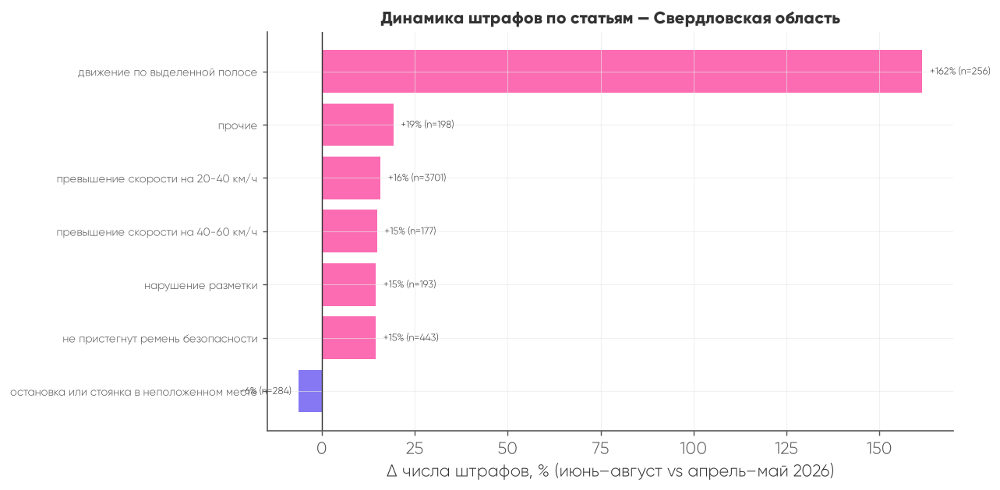

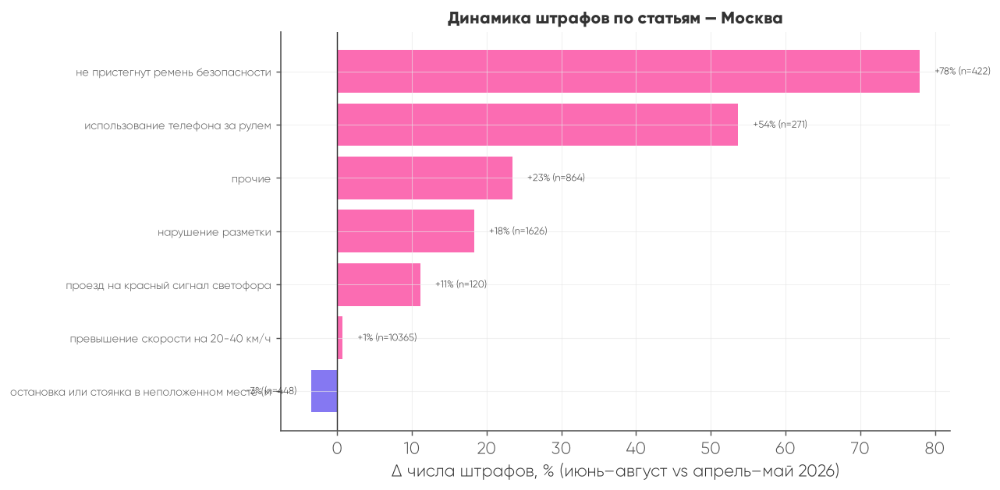

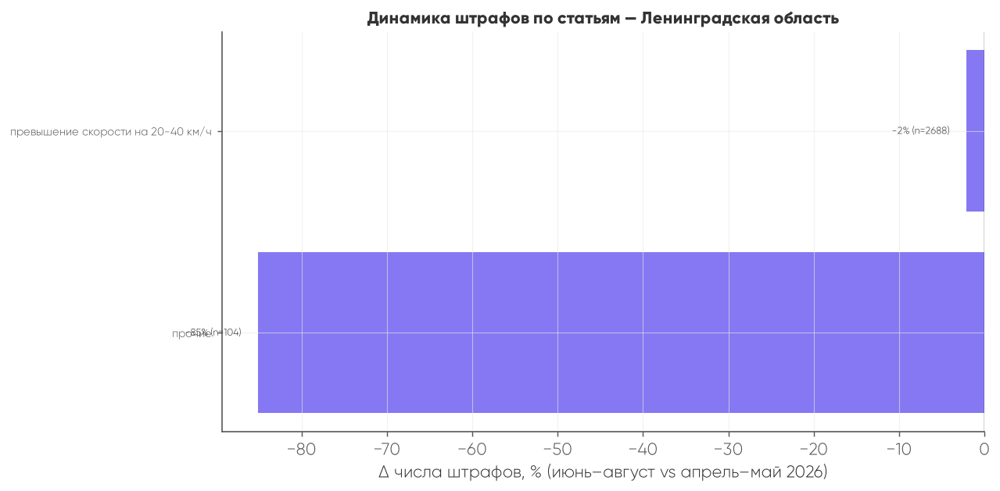

Готово!


In [47]:
# ============================================================
# 8.3. Динамика статей по выбранным регионам (вывод в окно)
# ============================================================
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

BEFORE = [4, 5]
AFTER  = [6, 7, 8]

# ------------------------------------------------------------
# НАСТРОЙКА: Выберите регионы, которые нужно отобразить
# ------------------------------------------------------------
# ВАРИАНТ 1: Вручную перечислите нужные регионы (замените на свои)
# regions_to_plot = ['Москва', 'Санкт-Петербург', 'Московская область']

# ВАРИАНТ 2: Если у вас есть колонка с галочками (например, 'selected' или 'is_checked')
# regions_to_plot = f26[f26['selected'] == True]['region_name'].unique()

# ВАРИАНТ 3 (Временный): Возьмем первые 3 региона для примера, 
# чтобы код точно запустился. УДАЛИТЕ ЭТУ СТРОКУ И РАСКОММЕНТИРУЙТЕ ВАРИАНТ 1 ИЛИ 2.
regions_to_plot = f26['region_name'].unique()[:3] 
# ------------------------------------------------------------

print(f"Отображаем графики для {len(regions_to_plot)} регионов...")

for region in regions_to_plot:
    # 1. Фильтруем данные по текущему региону
    df_reg = f26[f26['region_name'] == region]
    
    if df_reg.empty:
        print(f'⚠️ Регион {region} не найден в данных.')
        continue

    # 2. Считаем динамику
    art_month = (
        df_reg
        .groupby(['article_name', 'month'])
        .size()
        .unstack(fill_value=0)
        .reindex(columns=MONTHS, fill_value=0)
    )
    
    before_mean = art_month[BEFORE].mean(axis=1)
    after_mean  = art_month[AFTER].mean(axis=1)
    change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100
    total       = art_month.sum(axis=1)
    
    art_dyn = pd.DataFrame({
        'before': before_mean,
        'after':  after_mean,
        'change_pct': change,
        'total': total,
    }).dropna()
    
    # Фильтрация: убираем статьи с общим числом штрафов < 100
    art_dyn = art_dyn[art_dyn['total'] >= 100].sort_values('change_pct')
    
    if len(art_dyn) > 0:
        # 3. Строим график
        fig, ax = plt.subplots(figsize=(10, max(5, len(art_dyn) * 0.35)))
        colors = [PURPLE if v < 0 else PINK for v in art_dyn['change_pct']]
        ax.barh(art_dyn.index, art_dyn['change_pct'], color=colors, alpha=0.85)
        ax.axvline(0, color=INK, linewidth=0.8)
        ax.set_xlabel('Δ числа штрафов, % (июнь–август vs апрель–май 2026)')
        
        # Название региона в заголовке
        ax.set_title(f'Динамика штрафов по статьям — {region}',
                     fontsize=12, fontweight='bold', color=INK)
        
        for i, (v, t) in enumerate(zip(art_dyn['change_pct'], art_dyn['total'])):
            ax.text(v + (2 if v >= 0 else -2), i, f'{v:+.0f}% (n={int(t)})',
                    va='center', ha='left' if v >= 0 else 'right', fontsize=7)
        
        ax.tick_params(axis='y', labelsize=8)
        plt.tight_layout()
        
        # 4. Отображаем в окне (вместо сохранения)
        plt.show()
    else:
        print(f'⚠️  Регион {region}: нет статей с total >= 100 — график не построен.')

print("Готово!")

Уникальных значений: 25

Топ-20 самых частых:
offence_short_statement
Превышение скорости на 20-40 км/ч                                                    62608
Не пристегнут ремень безопасности                                                     3718
Нарушение разметки                                                                    3083
Превышение скорости на 40-60 км/ч                                                     1496
Использование телефона за рулем                                                       1265
Проезд на красный сигнал светофора                                                     851
Движение по выделенной полосе                                                          834
Пересечение стоп-линии                                                                 713
Остановка или стоянка в неположенном месте (Москва и Санкт-Петербург)                  491
Остановка или стоянка в неположенном месте                                             460
Неоплаченный проезд 

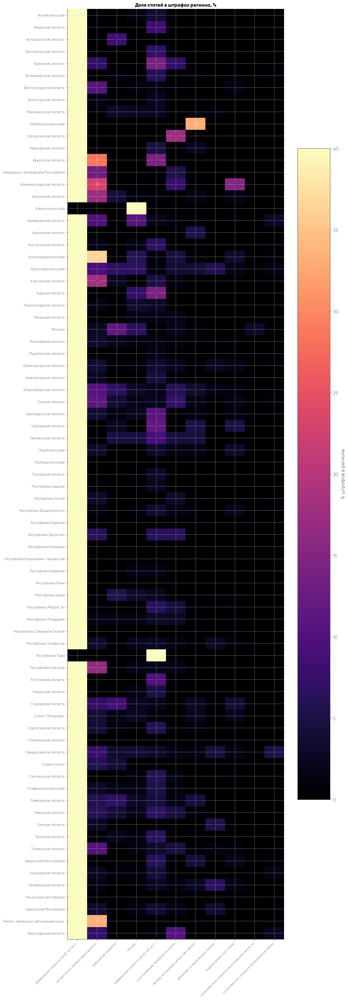

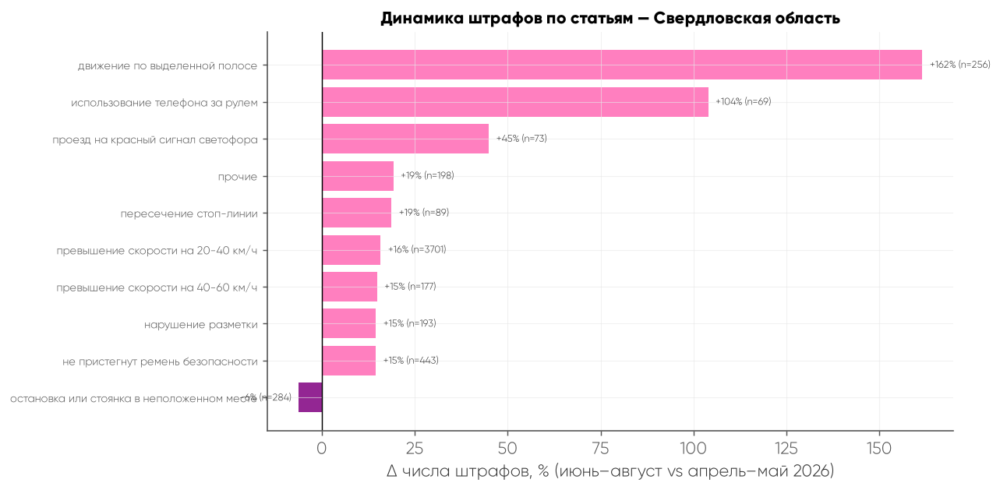

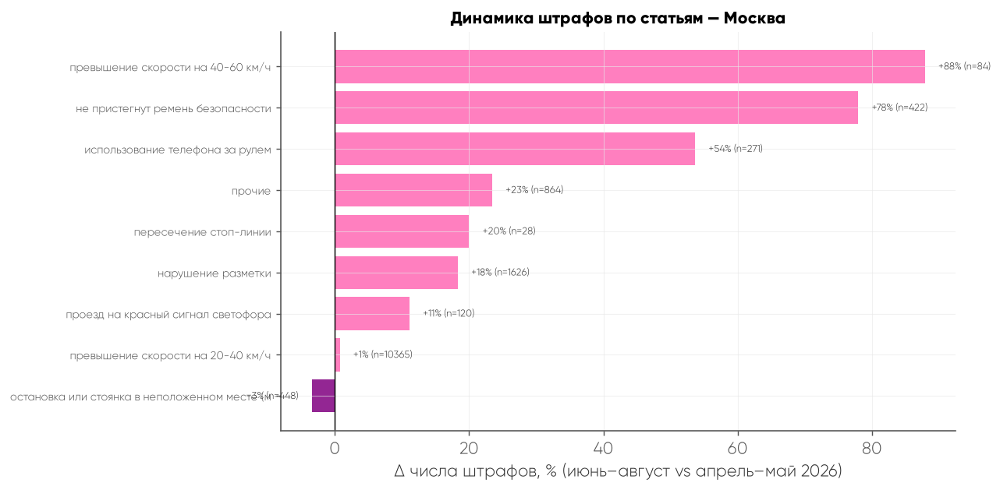

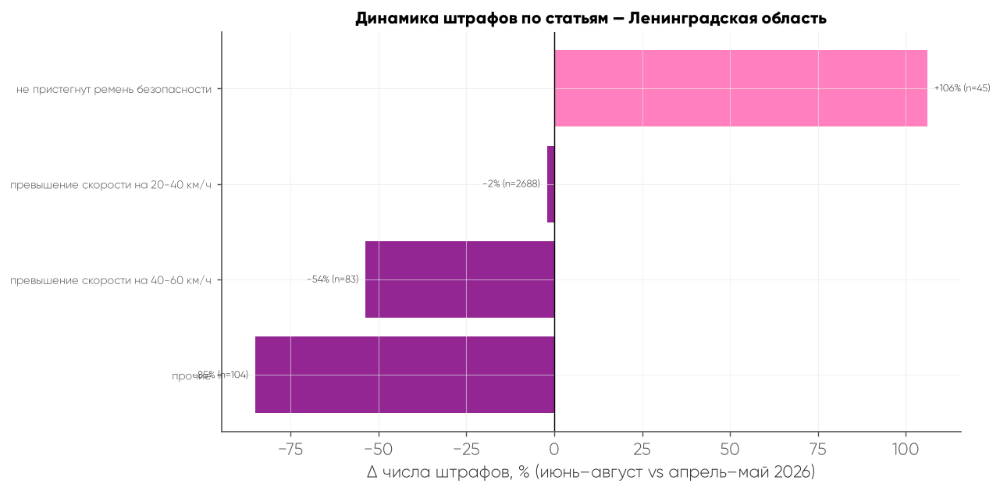

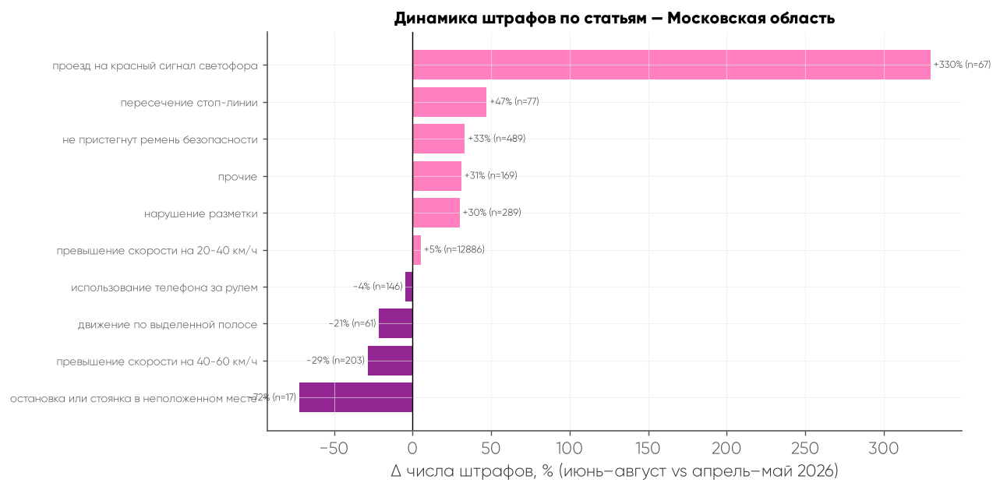

...

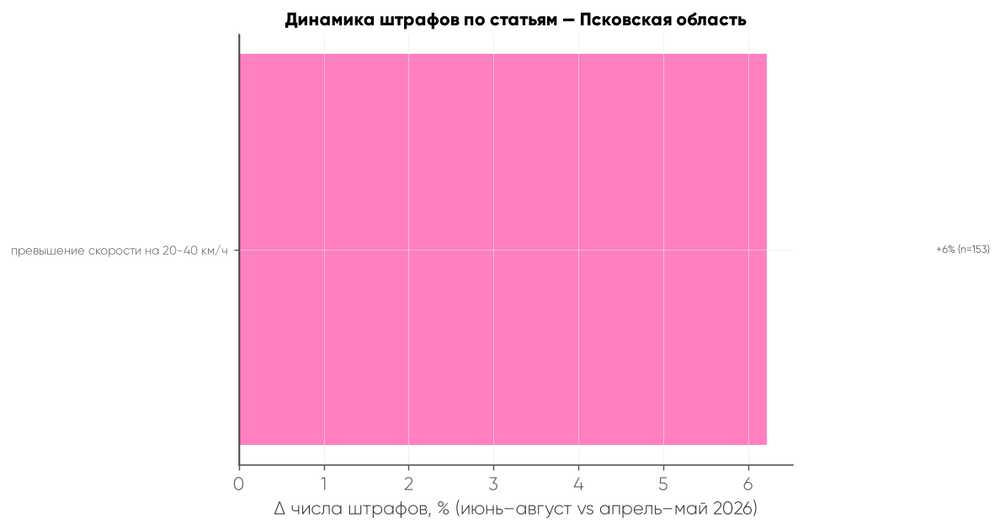

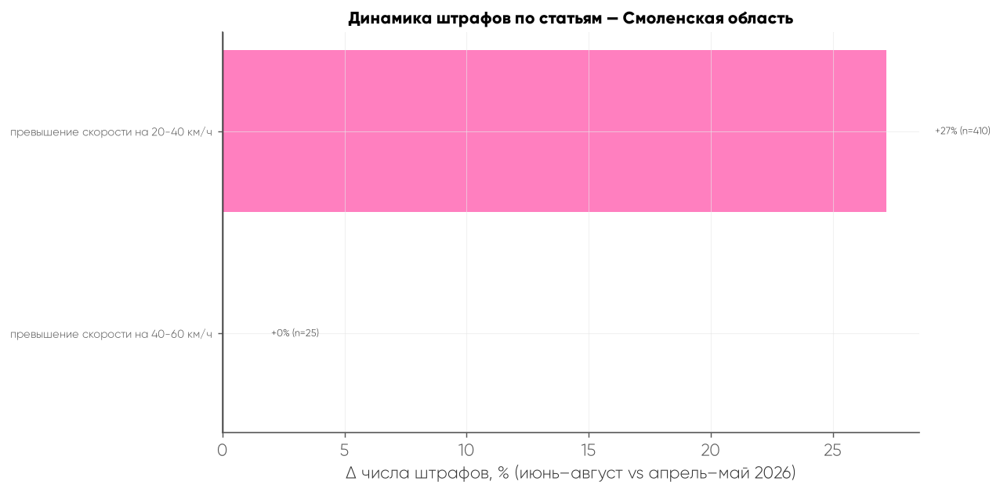

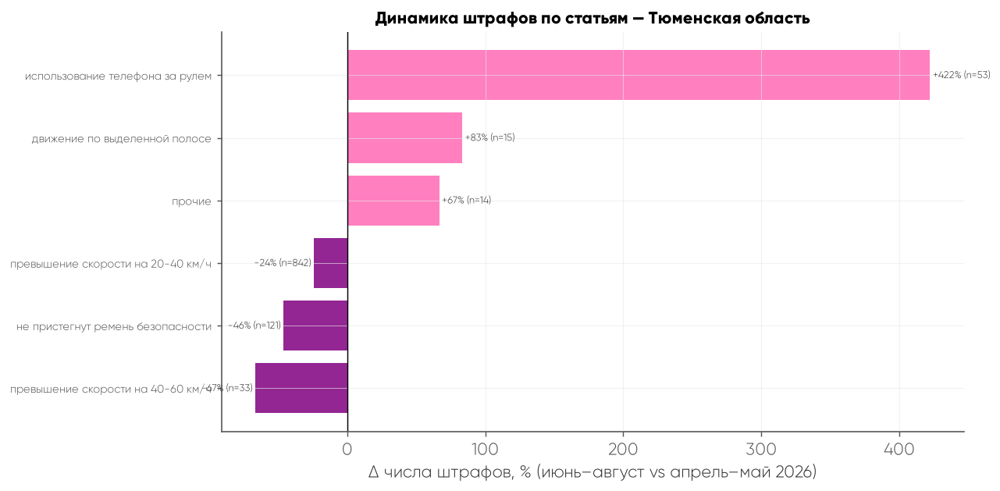

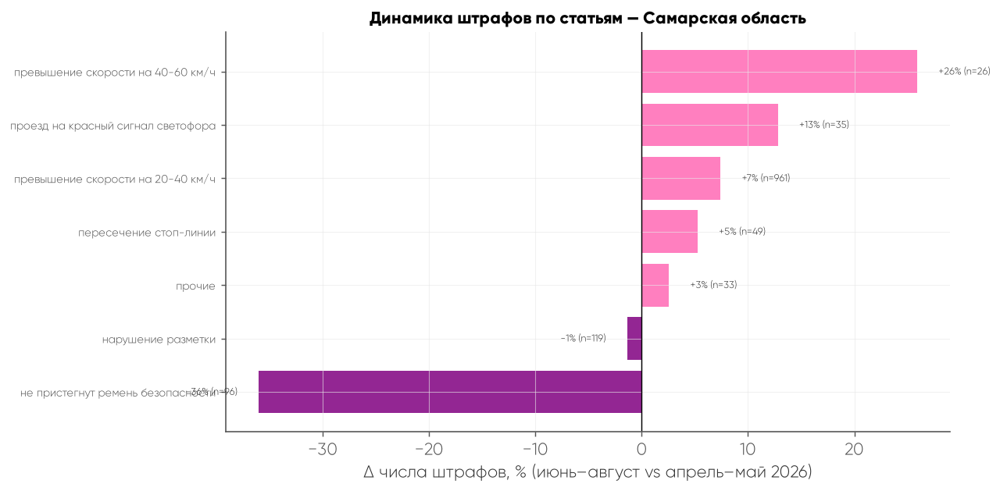

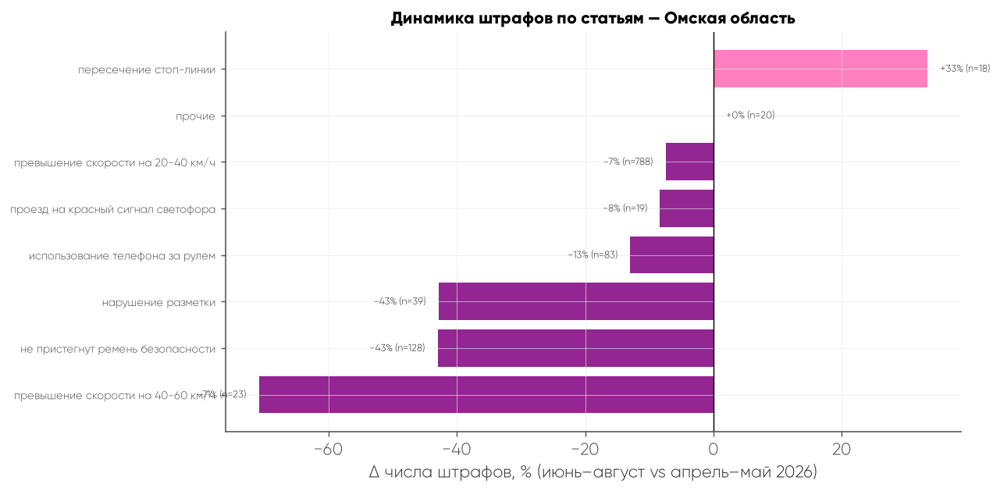

/tmp/ipykernel_74084/2199450312.py:249: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


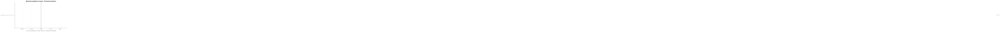

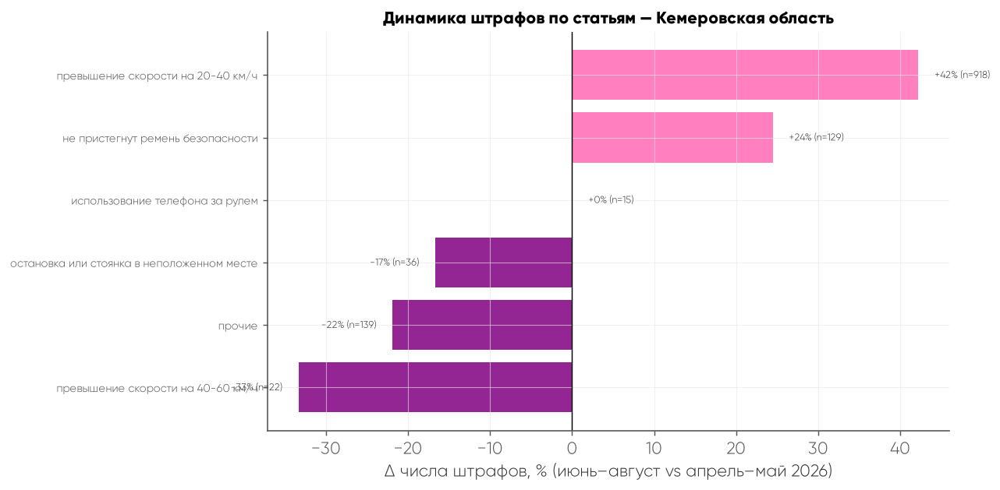

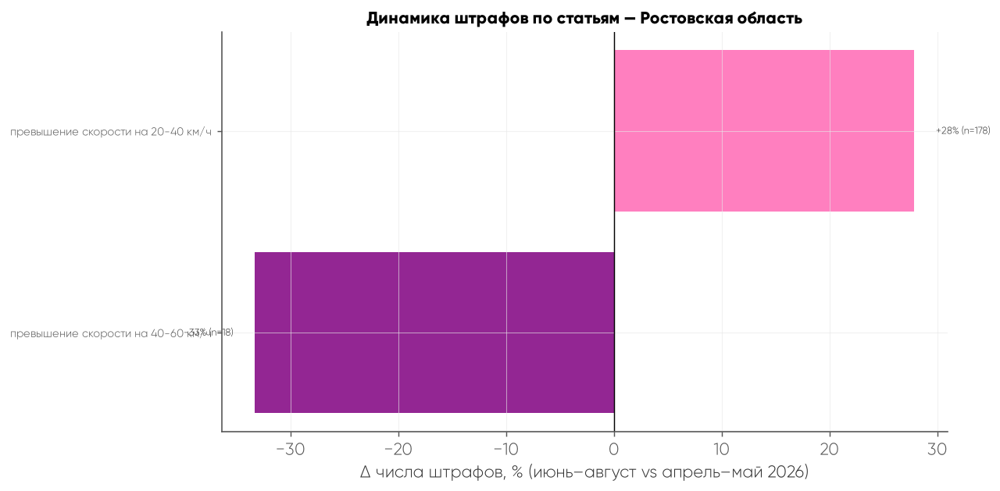

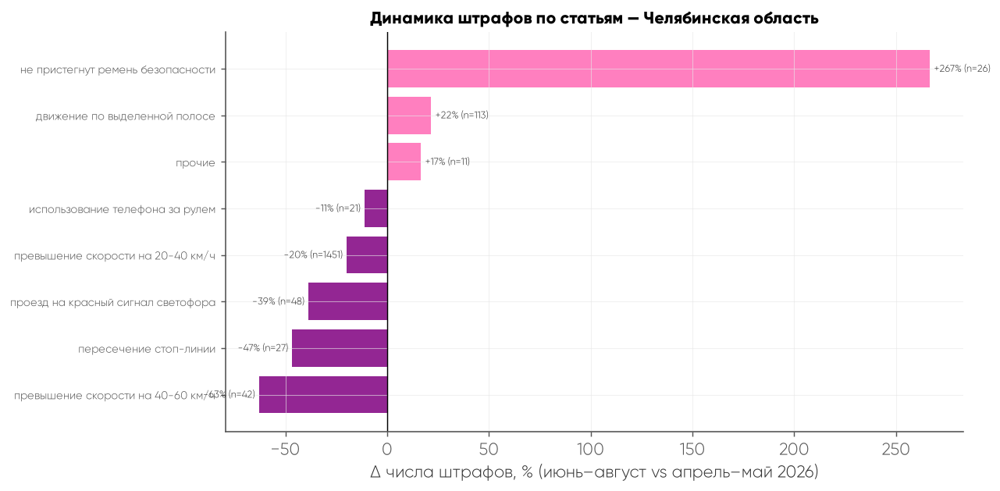

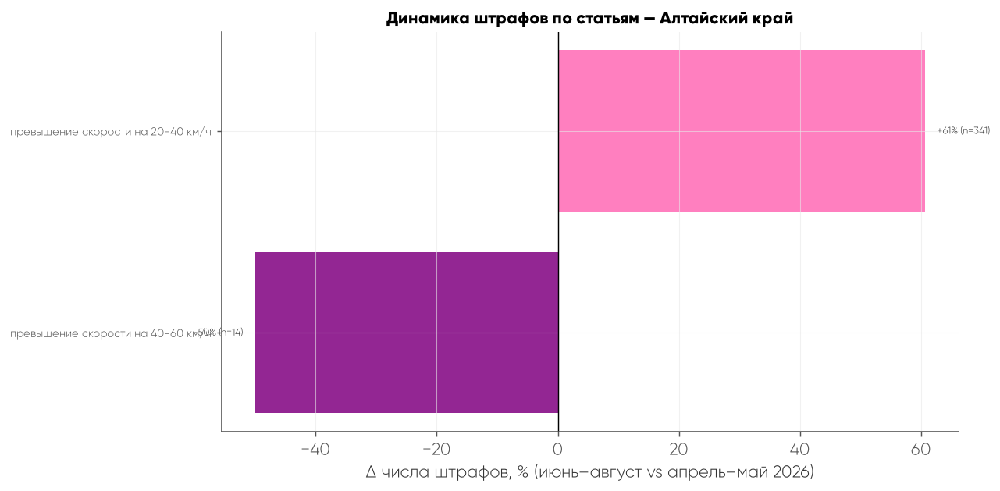

⚠️ Регион Калининградская область: нет статей с total >= 10 — график не построен.


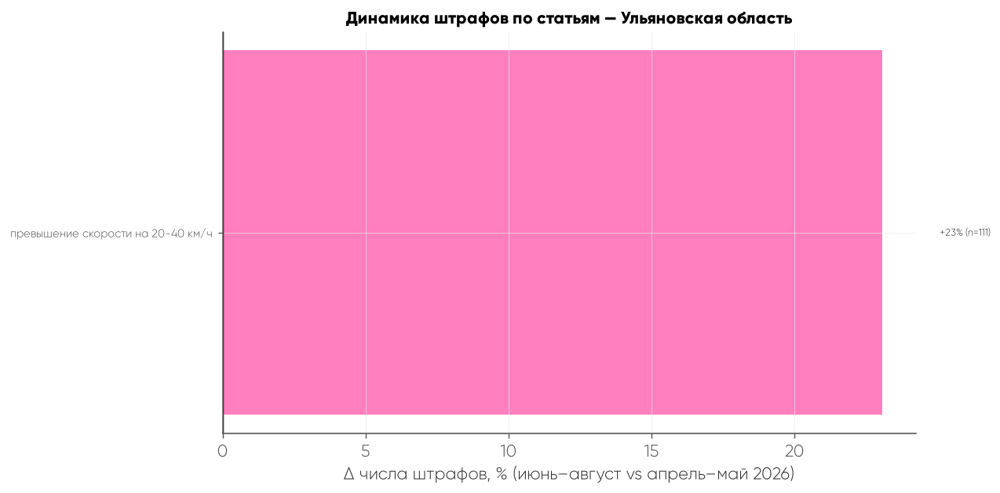

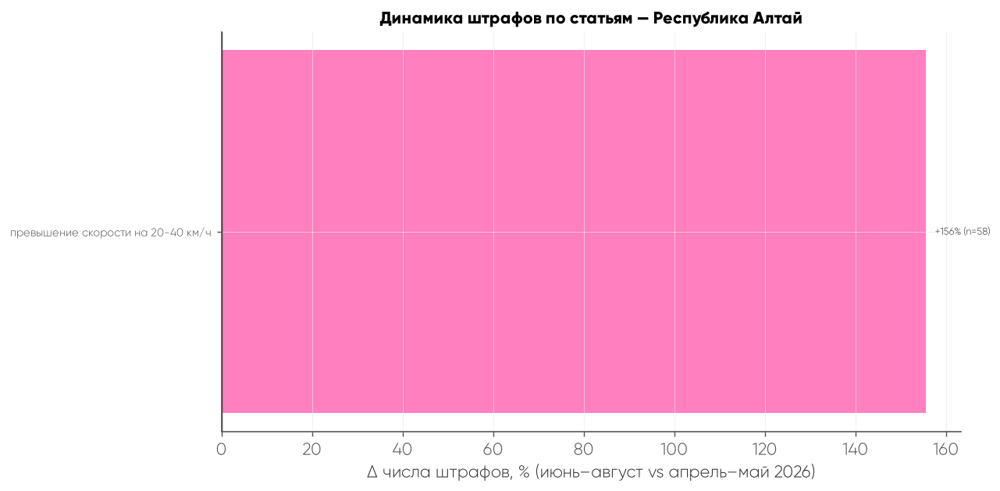

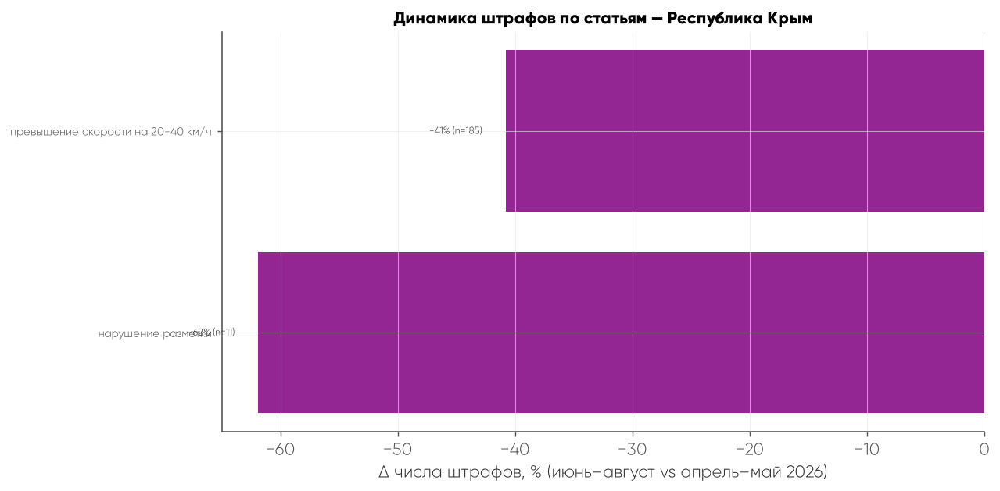

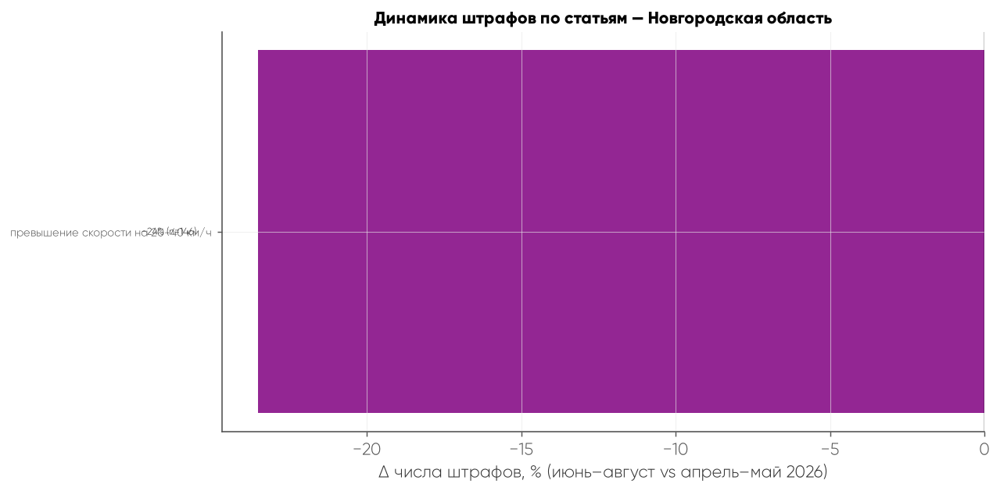

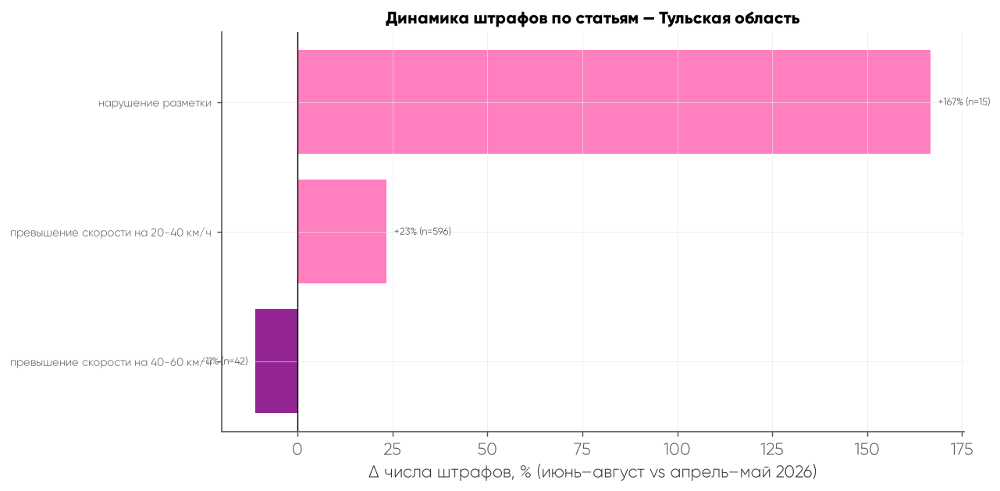

...

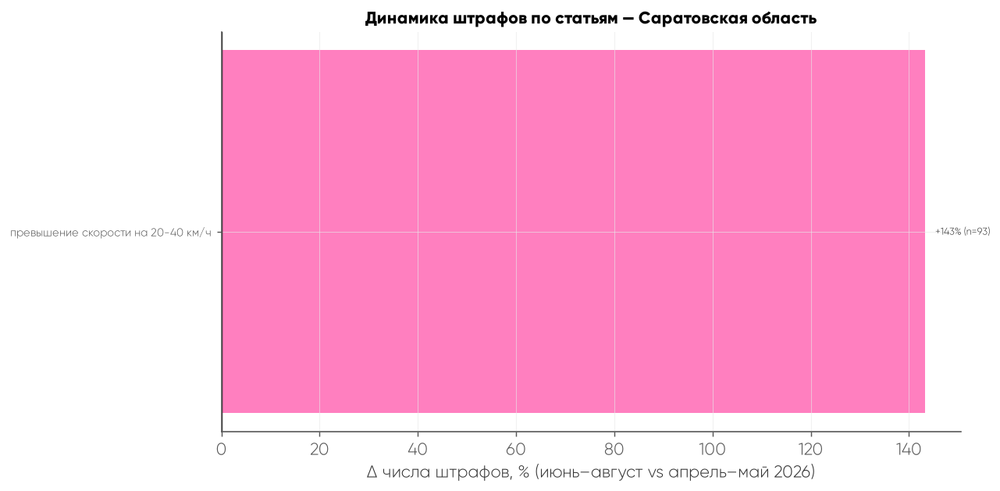

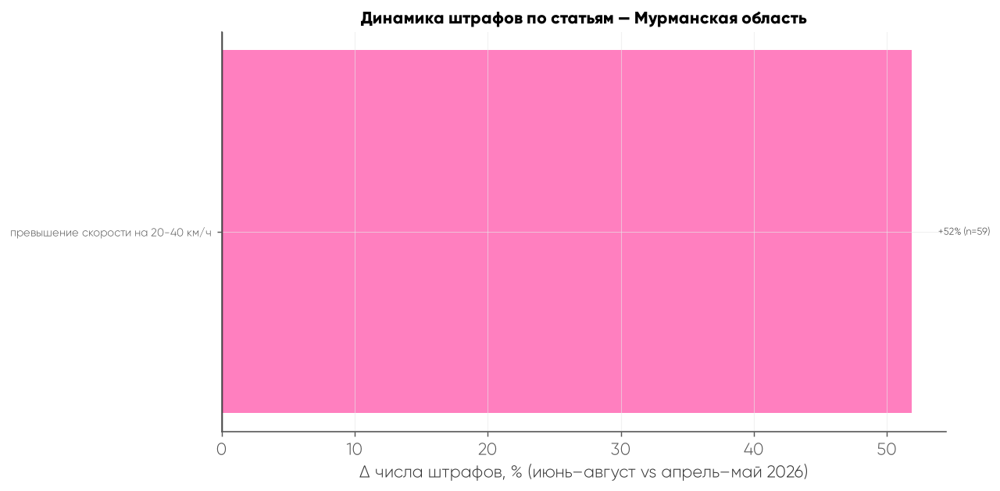

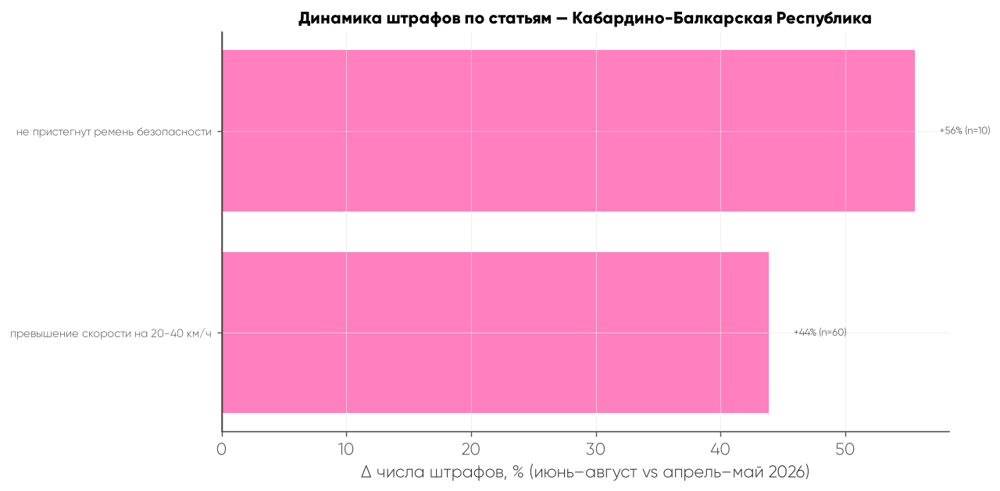

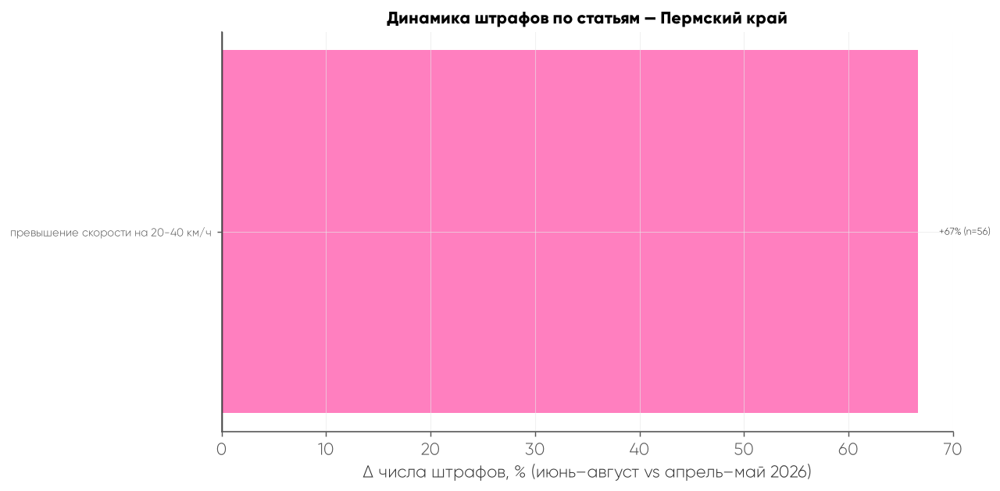

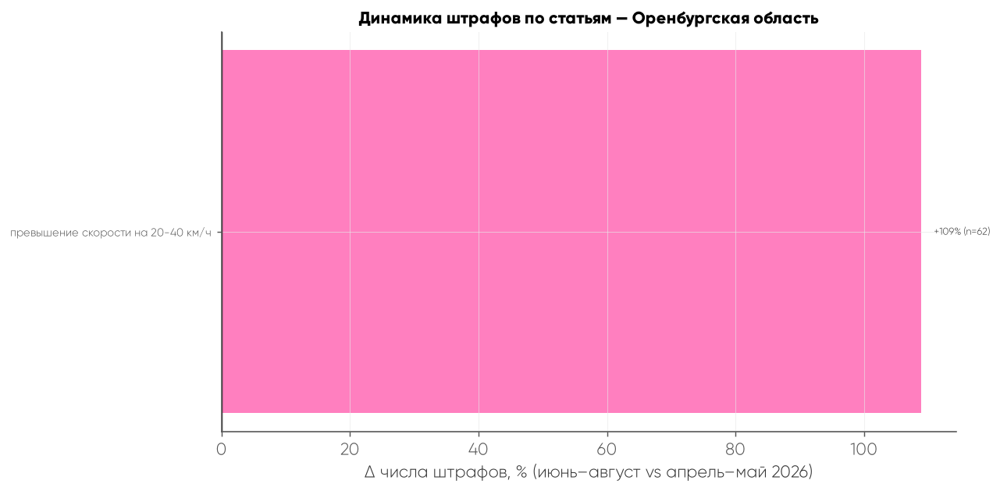

⚠️ Регион Ямало-Ненецкий автономный округ: нет статей с total >= 10 — график не построен.


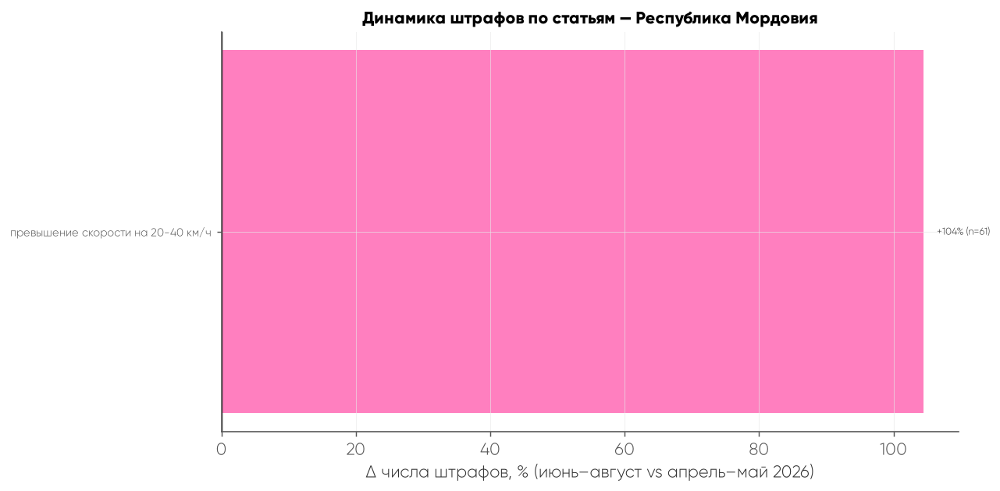

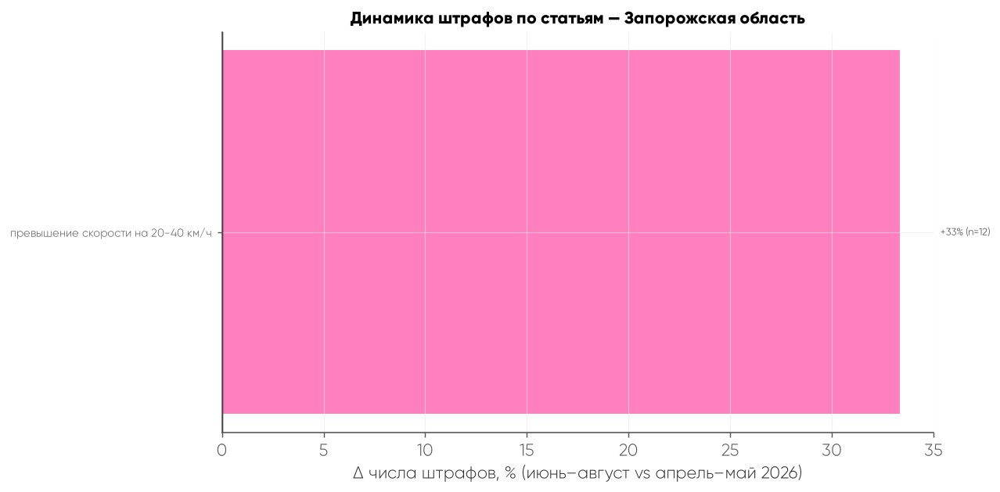

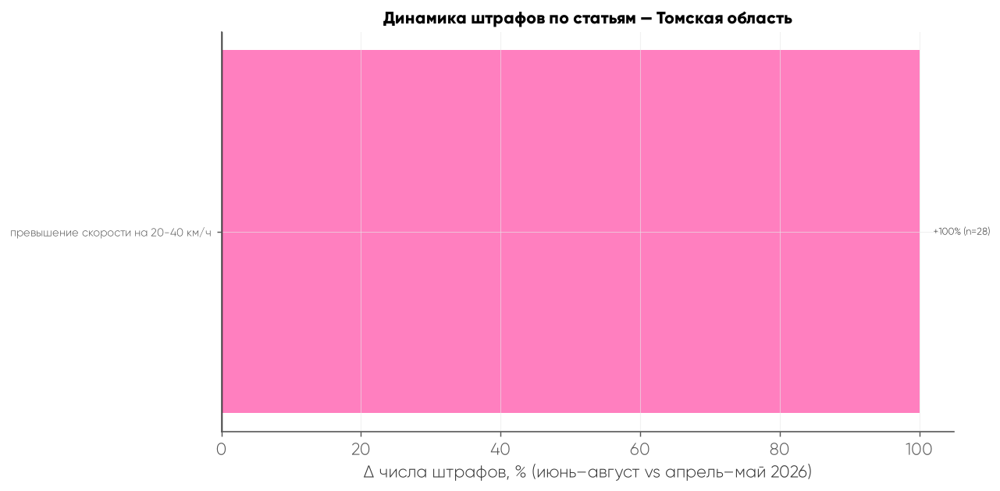

⚠️ Регион Приморский край: нет статей с total >= 10 — график не построен.


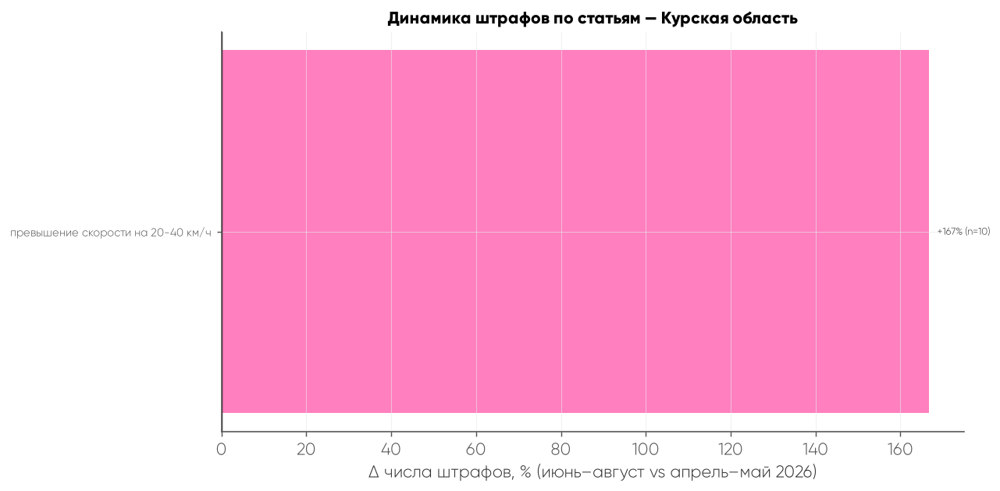

/tmp/ipykernel_74084/2199450312.py:249: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


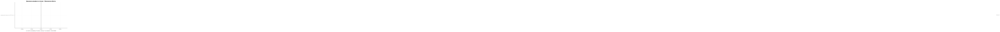

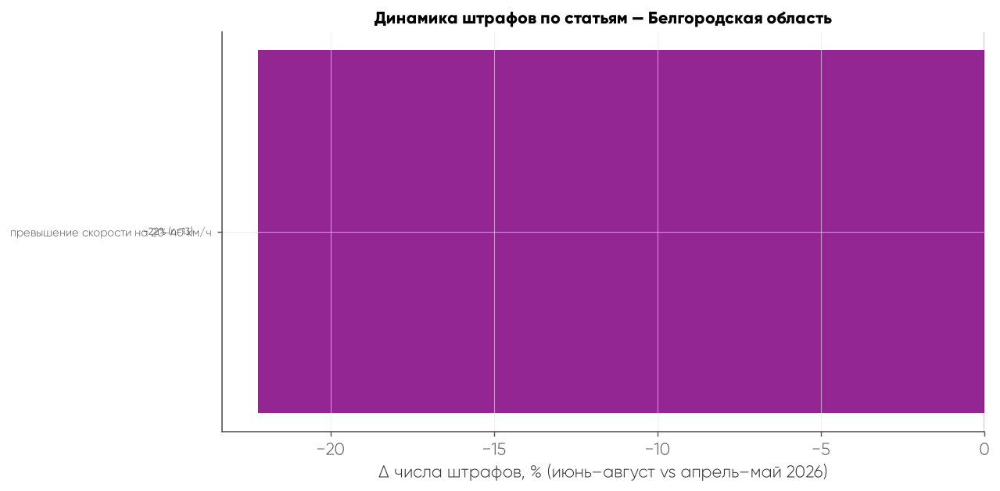

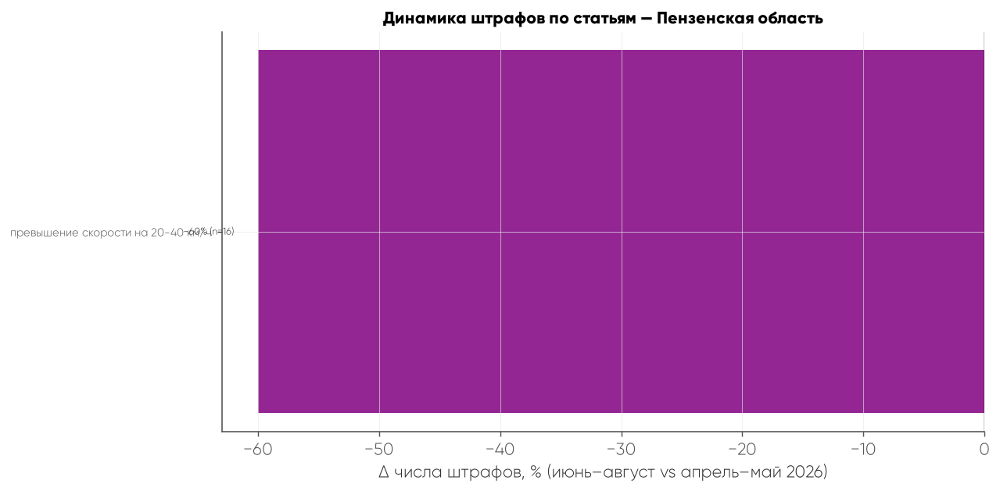

⚠️ Регион Забайкальский край: нет статей с total >= 10 — график не построен.
⚠️ Регион Республика Тыва: нет статей с total >= 10 — график не построен.


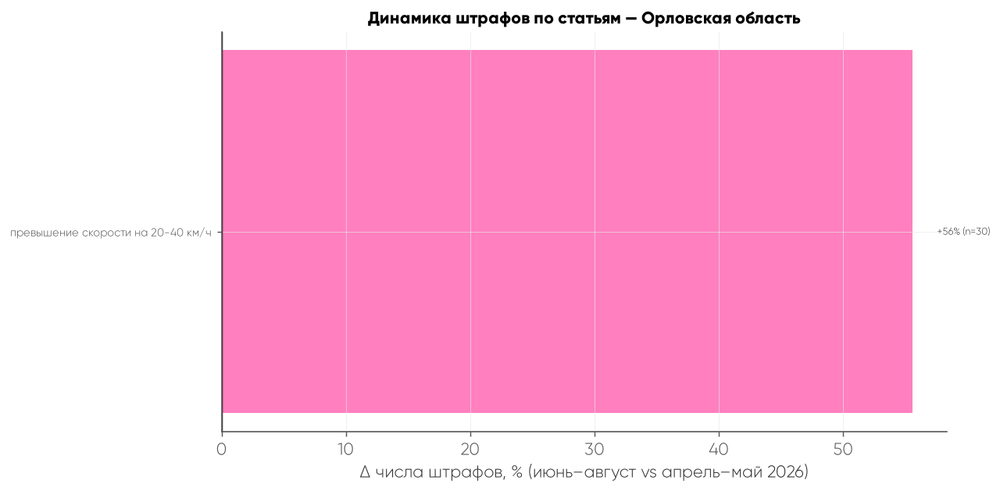

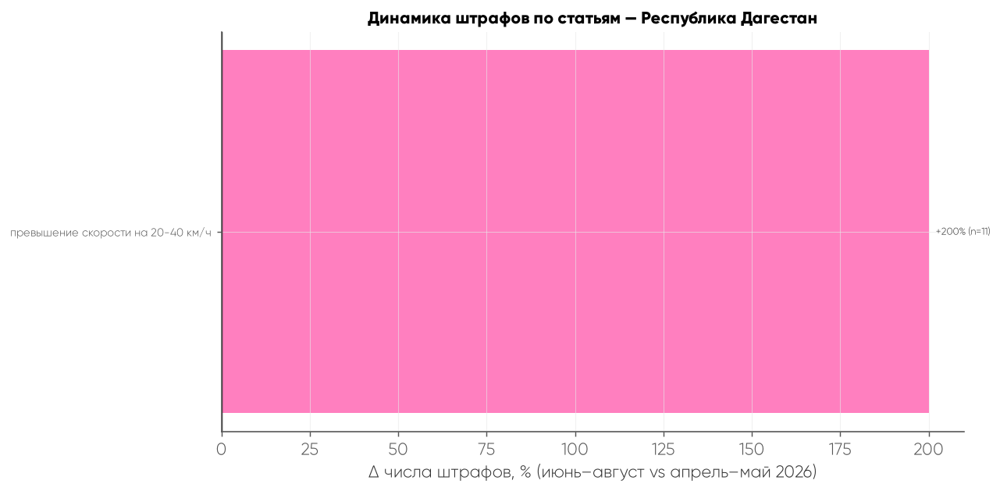

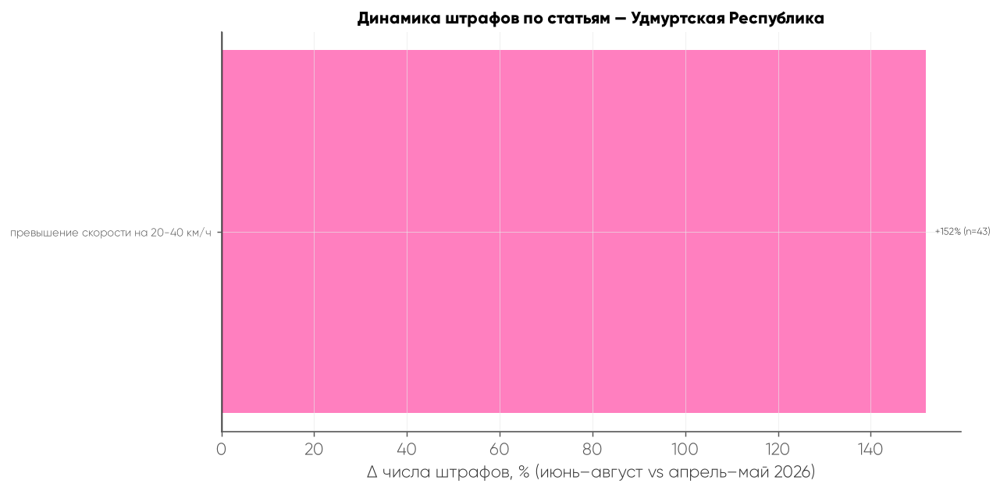

⚠️ Регион Республика Карачаево-Черкессия: нет статей с total >= 10 — график не построен.


/tmp/ipykernel_74084/2199450312.py:249: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


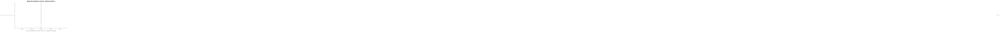

⚠️ Регион Республика Бурятия: нет статей с total >= 10 — график не построен.


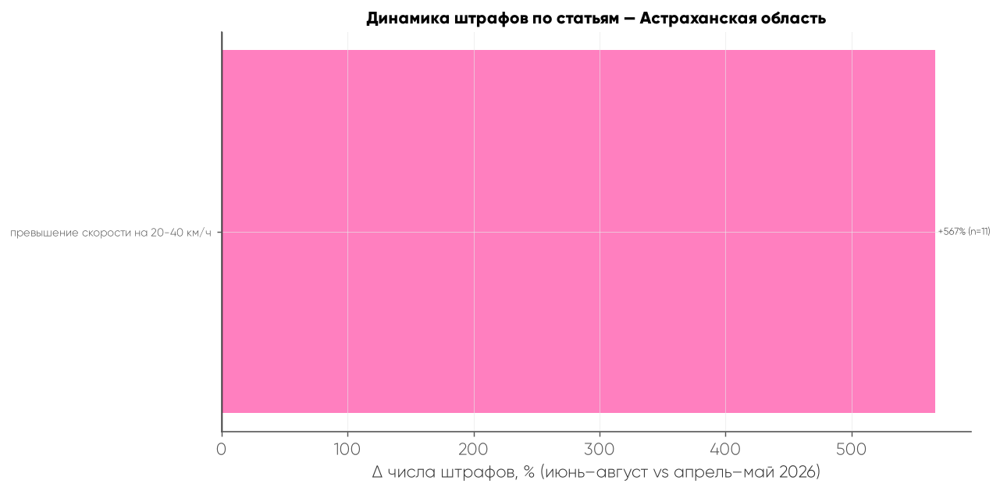

⚠️ Регион Иркутская область: нет статей с total >= 10 — график не построен.
⚠️ Регион Республика Коми: нет статей с total >= 10 — график не построен.
⚠️ Регион Республика Калмыкия: нет статей с total >= 10 — график не построен.


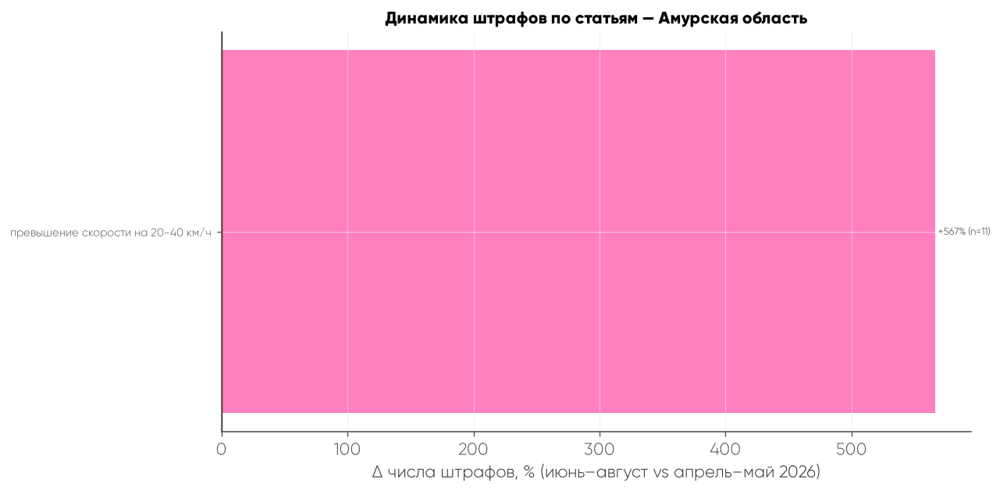

⚠️ Регион Республика Северная Осетия: нет статей с total >= 10 — график не построен.
⚠️ Регион Чеченская республика: нет статей с total >= 10 — график не построен.
⚠️ Регион Камчатский край: нет статей с total >= 10 — график не построен.
⚠️ Регион Сахалинская область: нет статей с total >= 10 — график не построен.

=== Изменение доли статей (процентные пункты) ===
period                                            до  после  delta_pp
article_name                                                         
превышение скорости на 20-40 км/ч              80.59  80.12     -0.48
превышение скорости на 40-60 км/ч               2.17   1.78     -0.39
остановка или стоянка в неположенном месте      0.67   0.54     -0.13
не пристегнут ремень безопасности               4.83   4.73     -0.10
проезд на красный сигнал светофора              1.16   1.05     -0.10
остановка или стоянка в неположенном месте (м   0.65   0.62     -0.03
пересечение стоп-линии                          0.90   0.92      0.03
про

In [48]:
# ============================================================
# ПОЛНЫЙ КОД: анализ штрафов по статьям и регионам
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path

# ---------- НАСТРОЙКИ ----------
KATE_DIR = Path('.')          # папка для сохранения, если понадобится
INK = 'black'
PINK = '#ff69b4'
PURPLE = '#800080'
MIN_TOTAL = 10                # минимальное число штрафов по статье, чтобы рисовать
MONTHS = [4, 5, 6, 7, 8]
BEFORE = [4, 5]
AFTER  = [6, 7, 8]

# ---------- 1. ЗАГРУЗКА ДАННЫХ ----------
# ВАЖНО: в table1.xlsx нет колонки offence_short_statement,
# поэтому для реальной работы нужен ваш исходный файл со штрафами.
# Пример:
# fines = pd.read_excel('fines.xlsx')
# Если данные уже в переменной fines, пропустите эту строку.

# Если у вас table1.xlsx и нужно взять регион из kladr_code:
# fines = pd.read_excel('table1.xlsx')
# fines['region_name'] = fines['kladr_code'].astype(str).str.zfill(2).str[:2]
# Но offence_short_statement там нет — статьи не построятся.

# ---------- 2. ЕСЛИ НУЖНО, ДОБАВЛЯЕМ year/month ----------
# Предположим, что fines уже содержит year, month, region_name, offence_short_statement.
# Если нет — создайте их из своих данных.

# ---------- 3. ДИАГНОСТИКА ----------
print('Уникальных значений:', fines['offence_short_statement'].nunique())
print('\nТоп-20 самых частых:')
print(fines['offence_short_statement'].value_counts(dropna=False).head(20))
print('\n5 случайных примеров:')
for s in fines['offence_short_statement'].dropna().sample(5, random_state=42):
    print(' •', repr(str(s))[:160])

# ---------- 4. ПАРСИНГ СТАТЬИ ----------
def extract_article_num(s):
    if pd.isna(s):
        return None
    m = re.search(r'\b(\d{1,2}\.\d{1,2}(?:\.\d{1,2})?)\b', str(s))
    return m.group(1) if m else None

fines['article_num'] = fines['offence_short_statement'].apply(extract_article_num)
share_num = fines['article_num'].notna().mean()
print(f'\nДоля штрафов с распознанным номером: {share_num:.1%}')

if share_num < 0.3:
    print('⚠️  Номеров мало. Использую сырой текст offence_short_statement.')
    fines['article_key'] = (fines['offence_short_statement']
                            .astype(str)
                            .str.strip()
                            .str.lower())
else:
    print('✅ Номеров достаточно. Использую номер статьи.')
    fines['article_key'] = fines['article_num']

print('\nТоп-20 article_key:')
print(fines['article_key'].value_counts().head(20))

# ---------- 5. ЧЕЛОВЕКОЧИТАЕМЫЕ ИМЕНА ----------
KOAP_NAMES = {
    '12.9':  '12.9 — скорость',
    '12.16': '12.16 — разметка/знаки',
    '12.15': '12.15 — расположение ТС',
    '12.12': '12.12 — красный свет',
    '12.18': '12.18 — не уступил пешеходу',
    '12.14': '12.14 — манёвр',
    '12.17': '12.17 — помеха спецтранспорту',
    '12.19': '12.19 — парковка',
    '12.5':  '12.5 — неисправность ТС',
    '12.6':  '12.6 — не пристёгнут',
    '12.8':  '12.8 — опьянение',
    '12.13': '12.13 — перекрёсток',
    '12.21': '12.21 — перевозка',
    '12.37': '12.37 — ОСАГО',
    '12.20': '12.20 — световые приборы',
}

def pretty_name(x):
    if x is None:
        return 'не распознано'
    if x in KOAP_NAMES:
        return KOAP_NAMES[x]
    s = str(x)
    return s if len(s) <= 45 else s[:42] + '…'

if share_num < 0.3:
    fines['article_name'] = (fines['article_key']
                             .str.slice(0, 45)
                             .str.replace(r'\s+', ' ', regex=True))
else:
    fines['article_name'] = fines['article_key'].map(pretty_name)

# оставляем только топ-10 статей, остальные — «прочие»
top10 = fines['article_name'].value_counts().head(10).index
fines['article_name'] = np.where(
    fines['article_name'].isin(top10),
    fines['article_name'],
    'прочие'
)

# ---------- 6. ФИЛЬТР 2026 ГОДА ----------
if 'year' in fines.columns:
    f26 = fines[(fines['year'] == 2026) & (fines['article_name'] != 'не распознано')].copy()
else:
    f26 = fines[fines['article_name'] != 'не распознано'].copy()

print(f'\nf26 — строк:', len(f26))

# ---------- 7. ВЫБОР РЕГИОНОВ ----------
if 'region_name' in f26.columns:
    all_existing_regions = f26['region_name'].dropna().unique()
else:
    f26['region_code'] = f26['kladr_code'].astype(str).str.zfill(2).str[:2]
    all_existing_regions = f26['region_code'].dropna().unique()

print('Все существующие регионы в данных:', all_existing_regions)

# Сюда впишите регионы, которые отмечены галочкой
regions_with_checkmark = [
    # 'Москва',
    # 'Санкт-Петербург',
    # 'Московская область',
    # ...
]

# Если список пуст — построим по всем существующим регионам
if not regions_with_checkmark:
    regions_to_plot = list(all_existing_regions)
else:
    regions_to_plot = [r for r in regions_with_checkmark if r in all_existing_regions]

print('Будут построены графики для:', regions_to_plot)

# ---------- 8. ОБЩАЯ СТРУКТУРА ПО РЕГИОНАМ (HEATMAP) ----------
reg_col = 'region_name' if 'region_name' in f26.columns else 'region_code'
art_reg = (
    f26
    .groupby([reg_col, 'article_name'])
    .size()
    .rename('cnt')
    .reset_index()
)
art_reg = art_reg.rename(columns={reg_col: 'region'})
art_reg['share'] = art_reg.groupby('region')['cnt'].transform(lambda s: s / s.sum())

top_by_region = (
    art_reg.sort_values(['region', 'share'], ascending=[True, False])
    .groupby('region').head(3)
)
print('\n=== Топ-3 статьи в каждом регионе ===')
print(top_by_region.to_string(index=False))

pivot_art = (
    art_reg
    .pivot(index='region', columns='article_name', values='share')
    .fillna(0)
)
order = f26['article_name'].value_counts().index.tolist()
pivot_art = pivot_art.reindex(columns=[c for c in order if c in pivot_art.columns], fill_value=0)

if pivot_art.shape[0] >= 2 and pivot_art.shape[1] >= 2:
    fig, ax = plt.subplots(figsize=(12, max(5, len(pivot_art) * 0.45)))
    im = ax.imshow(pivot_art.values * 100, aspect='auto', cmap='magma', vmin=0, vmax=40)
    ax.set_xticks(np.arange(pivot_art.shape[1]))
    ax.set_xticklabels(pivot_art.columns, rotation=45, ha='right', fontsize=8)
    ax.set_yticks(np.arange(pivot_art.shape[0]))
    ax.set_yticklabels(pivot_art.index, fontsize=9)
    for i in range(pivot_art.shape[0]):
        for j in range(pivot_art.shape[1]):
            v = pivot_art.values[i, j] * 100
            if v >= 1:
                ax.text(j, i, f'{v:.0f}', ha='center', va='center',
                        fontsize=7, color='white' if v > 20 else INK)
    ax.set_title('Доля статей в штрафах региона, %', fontsize=12, fontweight='bold', color=INK)
    fig.colorbar(im, ax=ax, shrink=0.7, label='% штрафов в регионе')
    plt.tight_layout()
    plt.show()
elif pivot_art.shape[0] >= 1 and pivot_art.shape[1] == 1:
    art_name = pivot_art.columns[0]
    s = pivot_art[art_name].sort_values()
    fig, ax = plt.subplots(figsize=(10, max(4, len(s) * 0.35)))
    ax.barh(s.index, s.values * 100, color=PINK, alpha=0.85)
    ax.set_xlabel(f'Доля «{art_name}» в штрафах региона, %')
    ax.set_title(f'Одна статья: «{art_name}»', fontsize=12, fontweight='bold', color=INK)
    ax.tick_params(axis='y', labelsize=9)
    plt.tight_layout()
    plt.show()
else:
    print('⚠️  pivot_art пустой — рисовать нечего.')

# ---------- 9. ДИНАМИКА ПО КАЖДОМУ РЕГИОНУ (в окне) ----------
for region in regions_to_plot:
    if 'region_name' in f26.columns:
        df_reg = f26[f26['region_name'] == region]
    else:
        df_reg = f26[f26['region_code'] == region]
    
    if df_reg.empty:
        print(f'⚠️ Регион {region} пуст — пропускаем.')
        continue

    art_month = (
        df_reg
        .groupby(['article_name', 'month'])
        .size()
        .unstack(fill_value=0)
        .reindex(columns=MONTHS, fill_value=0)
    )

    before_mean = art_month[BEFORE].mean(axis=1)
    after_mean  = art_month[AFTER].mean(axis=1)
    change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100
    total       = art_month.sum(axis=1)

    art_dyn = pd.DataFrame({
        'before': before_mean,
        'after':  after_mean,
        'change_pct': change,
        'total': total,
    }).dropna()

    # Фильтр: оставляем статьи с total >= MIN_TOTAL
    art_dyn = art_dyn[art_dyn['total'] >= MIN_TOTAL].sort_values('change_pct')

    if len(art_dyn) == 0:
        print(f'⚠️ Регион {region}: нет статей с total >= {MIN_TOTAL} — график не построен.')
        continue

    fig, ax = plt.subplots(figsize=(10, max(5, len(art_dyn) * 0.35)))
    colors = [PURPLE if v < 0 else PINK for v in art_dyn['change_pct']]
    ax.barh(art_dyn.index, art_dyn['change_pct'], color=colors, alpha=0.85)
    ax.axvline(0, color=INK, linewidth=0.8)
    ax.set_xlabel('Δ числа штрафов, % (июнь–август vs апрель–май 2026)')
    ax.set_title(f'Динамика штрафов по статьям — {region}',
                 fontsize=12, fontweight='bold', color=INK)
    for i, (v, t) in enumerate(zip(art_dyn['change_pct'], art_dyn['total'])):
        ax.text(v + (2 if v >= 0 else -2), i, f'{v:+.0f}% (n={int(t)})',
                va='center', ha='left' if v >= 0 else 'right', fontsize=7)
    ax.tick_params(axis='y', labelsize=8)
    plt.tight_layout()
    plt.show()   # <-- показываем в окне, не сохраняем

# ---------- 10. ИЗМЕНЕНИЕ ДОЛИ СТАТЕЙ (ПРОЦЕНТНЫЕ ПУНКТЫ) ----------
f26['period'] = np.where(f26['month'].isin(BEFORE), 'до', 'после')

share_by_period = (
    f26
    .groupby(['article_name', 'period'])
    .size()
    .unstack(fill_value=0)
)
share_by_period = share_by_period.reindex(columns=['до', 'после'], fill_value=0)
share_by_period = share_by_period.div(share_by_period.sum(axis=0).replace(0, np.nan), axis=1) * 100
share_by_period['delta_pp'] = share_by_period['после'] - share_by_period['до']
share_by_period = share_by_period.sort_values('delta_pp')

print('\n=== Изменение доли статей (процентные пункты) ===')
print(share_by_period.round(2).head(10))
print('...')
print(share_by_period.round(2).tail(10))

Всего регионов в данных: 77
Список: ['Алтайский край', 'Амурская область', 'Астраханская область', 'Белгородская область', 'Брянская область', 'Владимирская область', 'Волгоградская область', 'Вологодская область', 'Воронежская область', 'Забайкальский край', 'Запорожская область', 'Ивановская область', 'Иркутская область', 'Кабардино-Балкарская Республика', 'Калининградская область', 'Калужская область', 'Камчатский край', 'Кемеровская область', 'Кировская область', 'Костромская область', 'Краснодарский край', 'Красноярский край', 'Курганская область', 'Курская область', 'Ленинградская область', 'Липецкая область', 'Москва', 'Московская область', 'Мурманская область', 'Нижегородская область', 'Новгородская область', 'Новосибирская область', 'Омская область', 'Оренбургская область', 'Орловская область', 'Пензенская область', 'Пермский край', 'Приморский край', 'Псковская область', 'Республика Адыгея', 'Республика Алтай', 'Республика Башкортостан', 'Республика Бурятия', 'Республика Даге

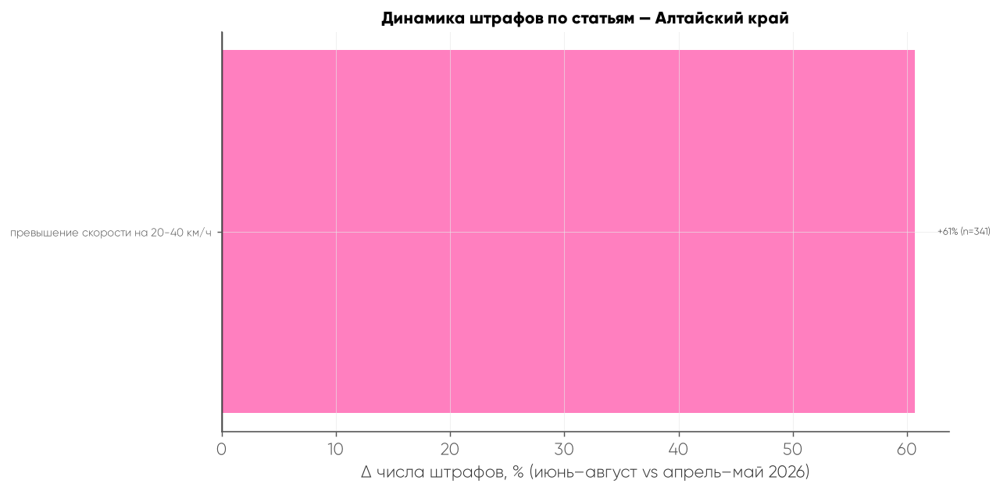

⚠️ Амурская область: нет статей с total >= 100 — пропуск.
⚠️ Астраханская область: нет статей с total >= 100 — пропуск.
⚠️ Белгородская область: нет статей с total >= 100 — пропуск.
⚠️ Брянская область: нет статей с total >= 100 — пропуск.


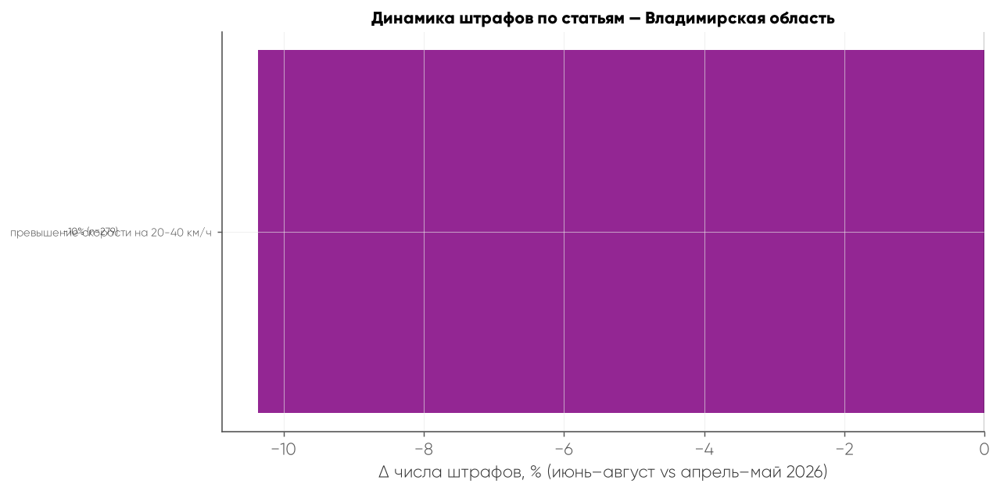

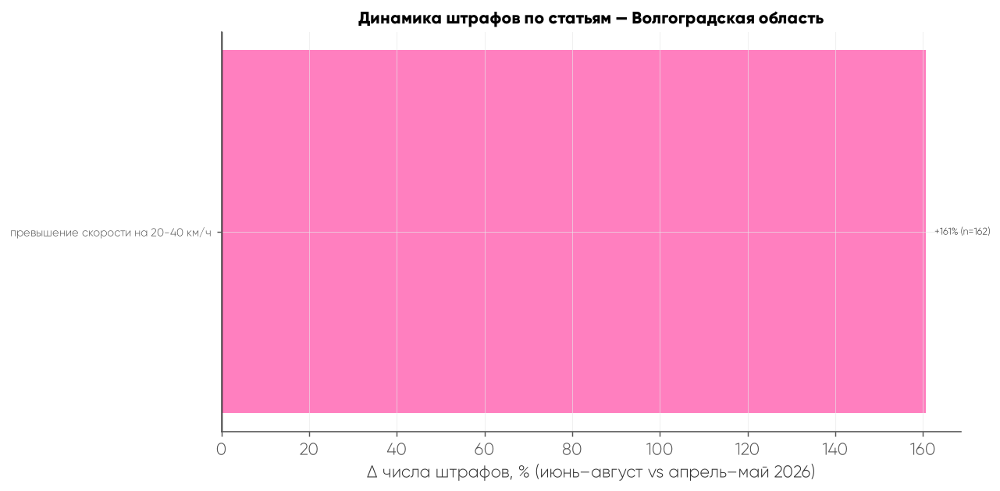

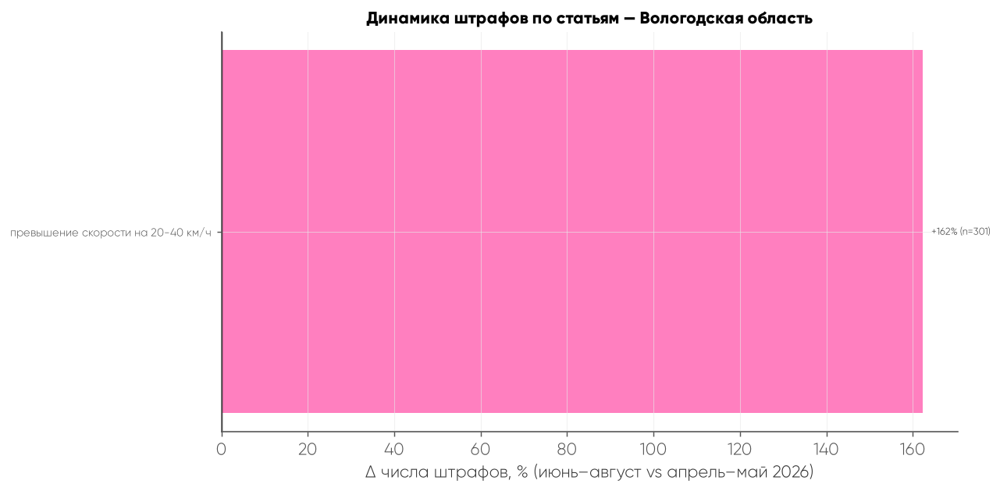

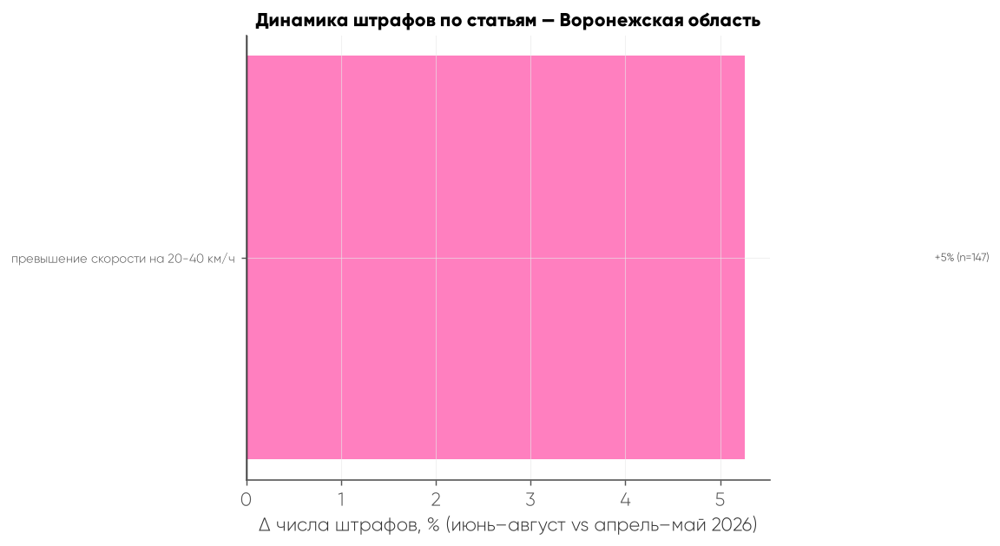

⚠️ Забайкальский край: нет статей с total >= 100 — пропуск.
⚠️ Запорожская область: нет статей с total >= 100 — пропуск.
⚠️ Ивановская область: нет статей с total >= 100 — пропуск.
⚠️ Иркутская область: нет статей с total >= 100 — пропуск.
⚠️ Кабардино-Балкарская Республика: нет статей с total >= 100 — пропуск.
⚠️ Калининградская область: нет статей с total >= 100 — пропуск.
⚠️ Калужская область: нет статей с total >= 100 — пропуск.
⚠️ Камчатский край: нет статей с total >= 100 — пропуск.


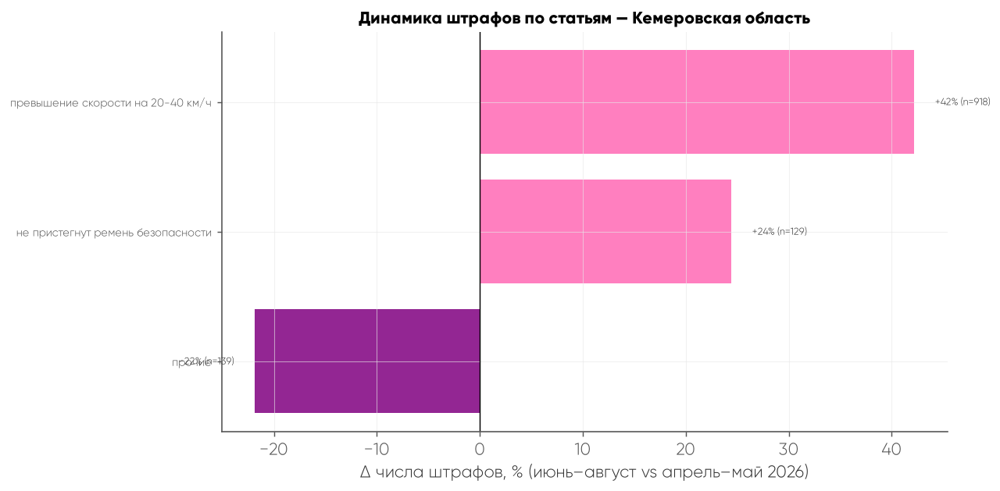

⚠️ Кировская область: нет статей с total >= 100 — пропуск.
⚠️ Костромская область: нет статей с total >= 100 — пропуск.


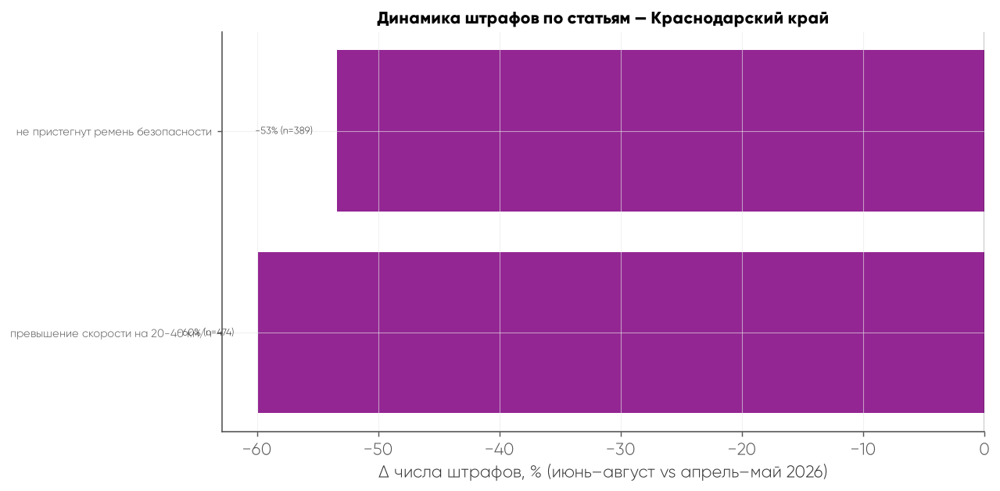

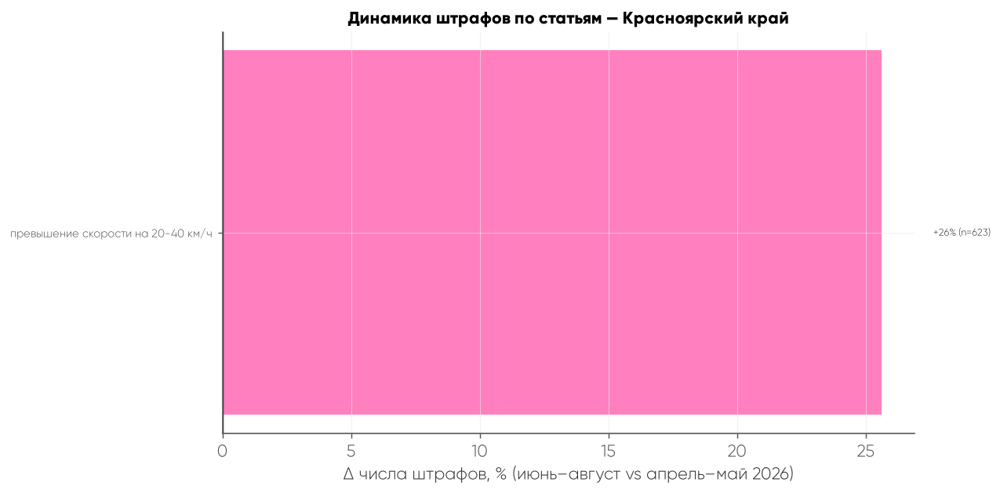

⚠️ Курганская область: нет статей с total >= 100 — пропуск.
⚠️ Курская область: нет статей с total >= 100 — пропуск.


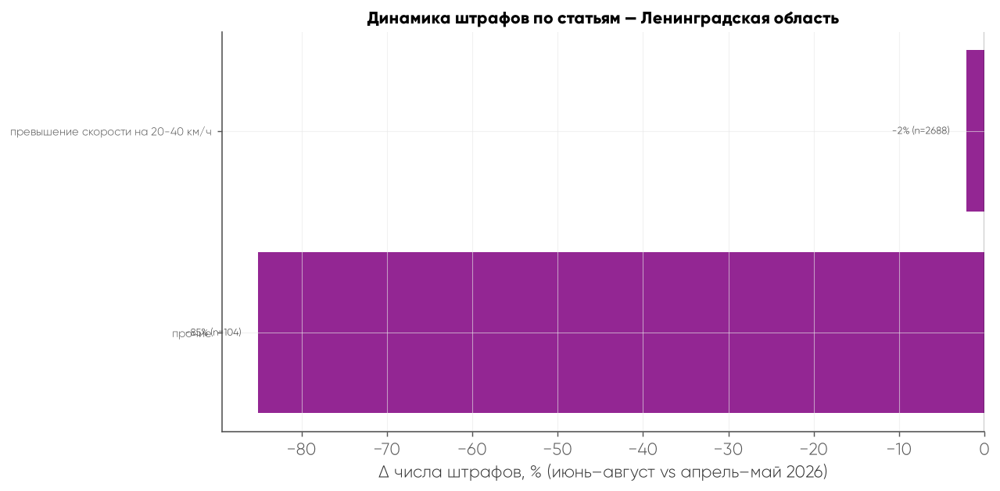

⚠️ Липецкая область: нет статей с total >= 100 — пропуск.


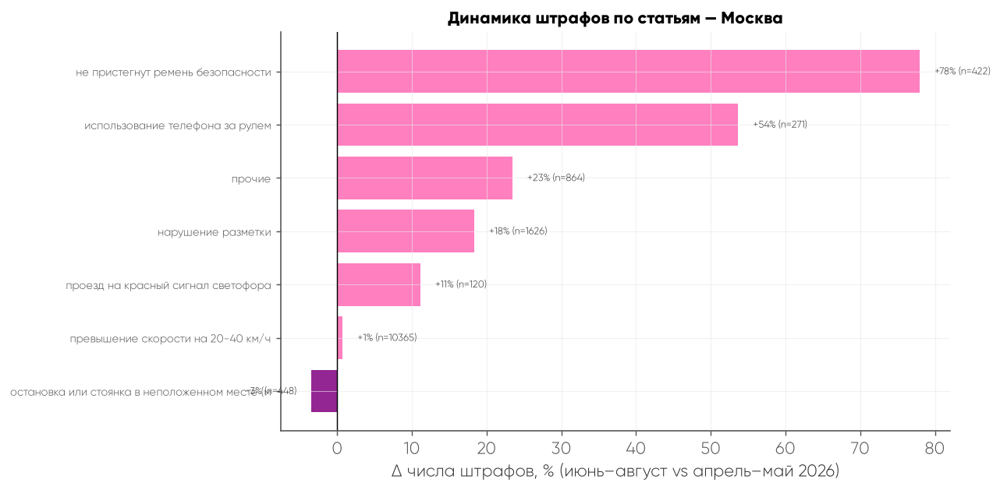

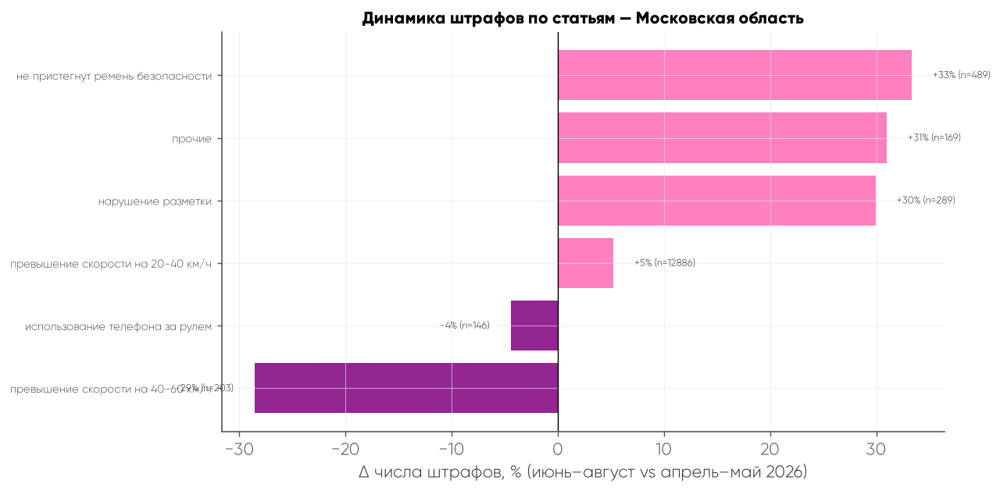

⚠️ Мурманская область: нет статей с total >= 100 — пропуск.


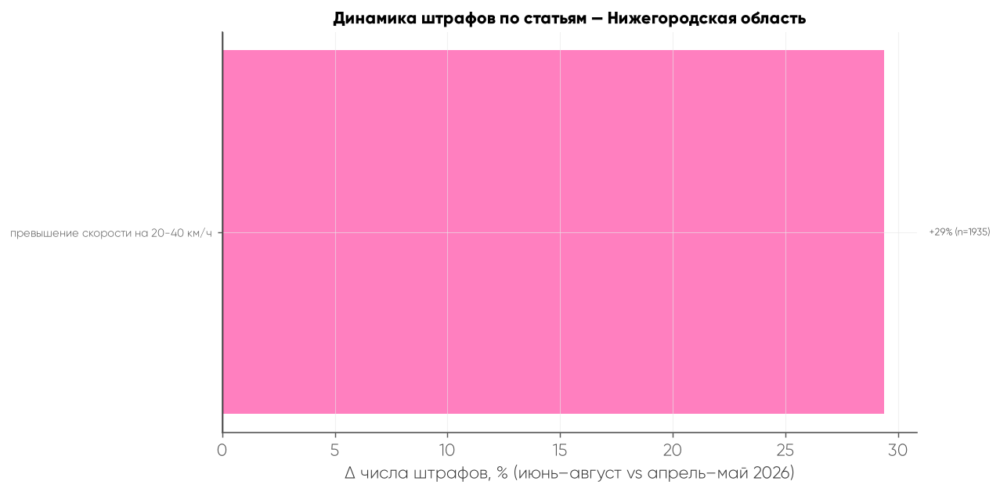

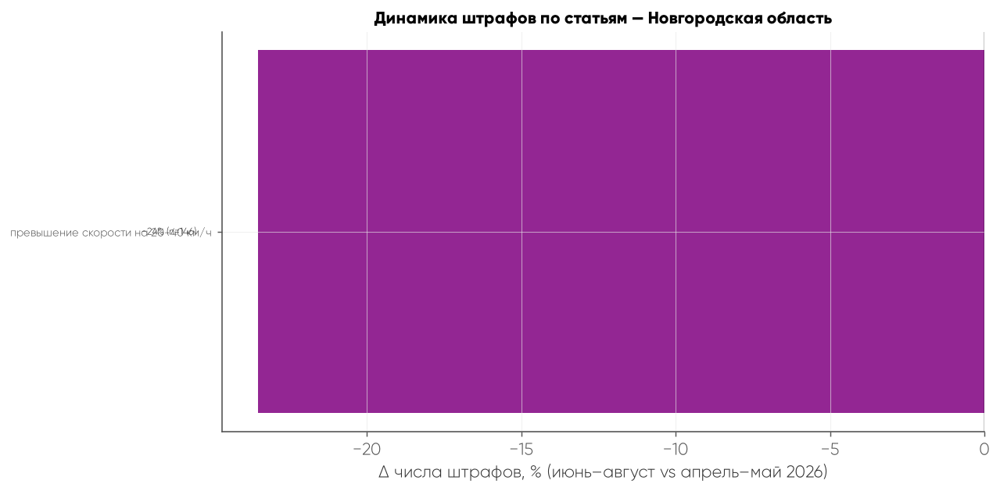

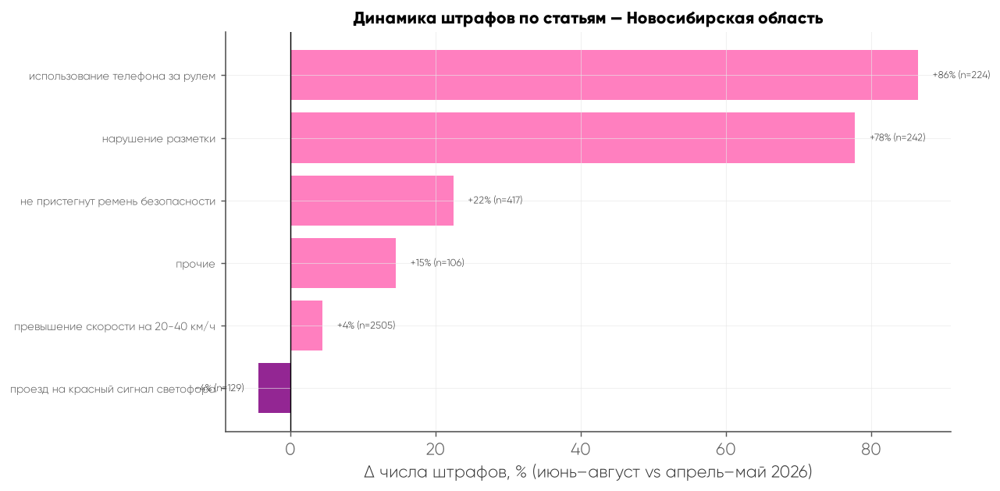

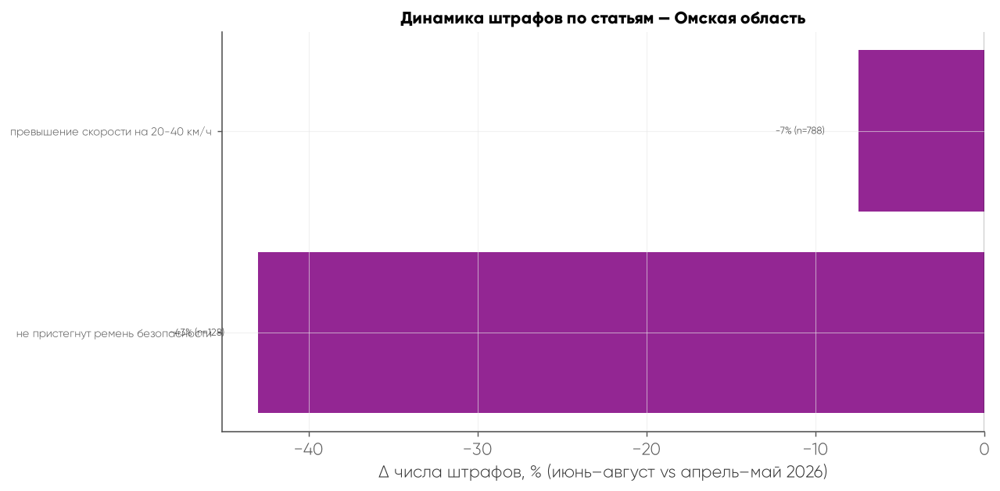

⚠️ Оренбургская область: нет статей с total >= 100 — пропуск.
⚠️ Орловская область: нет статей с total >= 100 — пропуск.
⚠️ Пензенская область: нет статей с total >= 100 — пропуск.
⚠️ Пермский край: нет статей с total >= 100 — пропуск.
⚠️ Приморский край: нет статей с total >= 100 — пропуск.


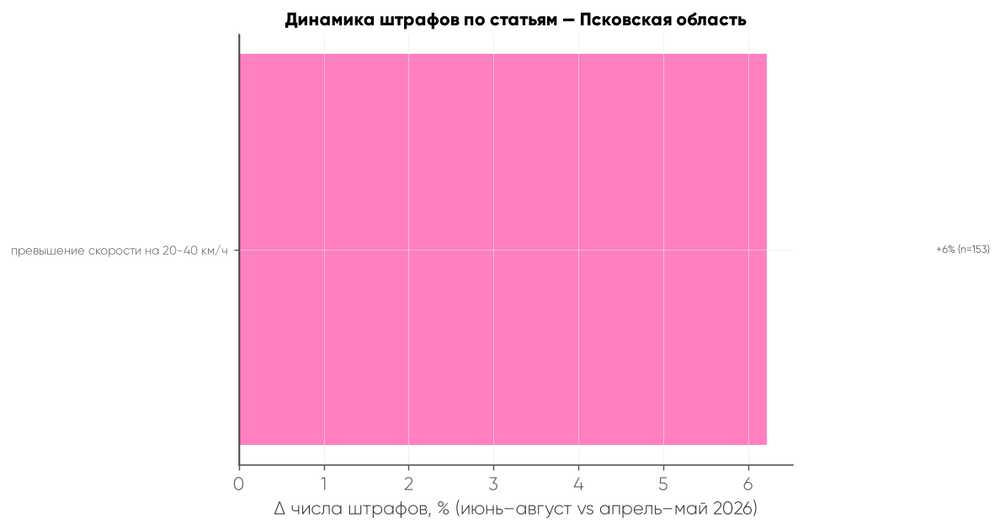

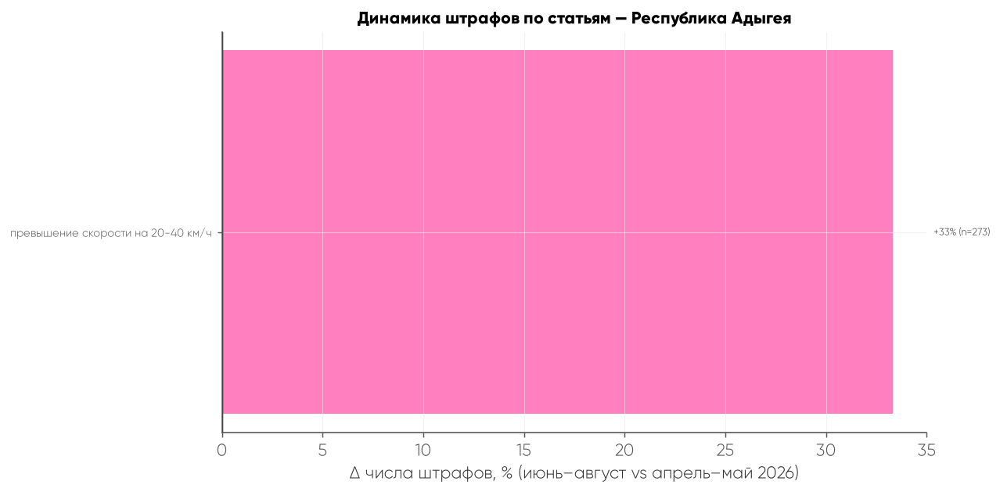

⚠️ Республика Алтай: нет статей с total >= 100 — пропуск.


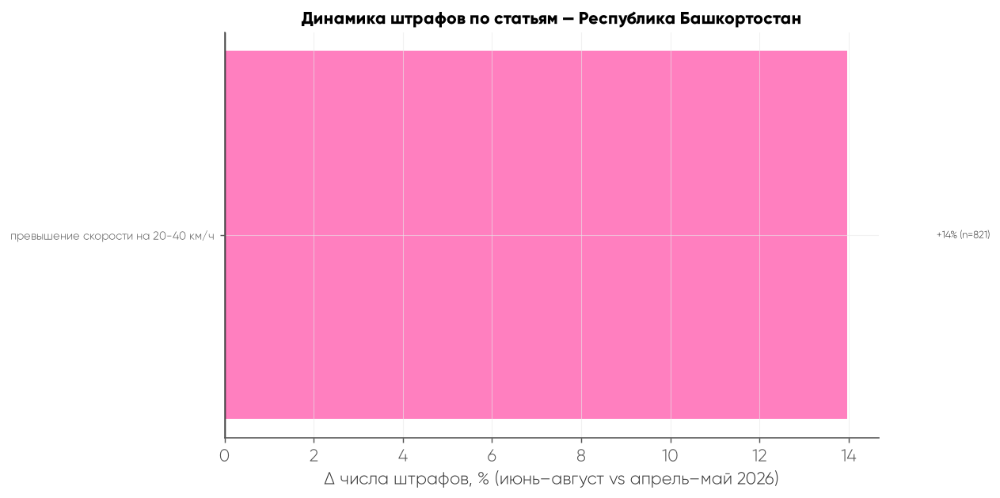

⚠️ Республика Бурятия: нет статей с total >= 100 — пропуск.
⚠️ Республика Дагестан: нет статей с total >= 100 — пропуск.
⚠️ Республика Калмыкия: нет статей с total >= 100 — пропуск.
⚠️ Республика Карачаево-Черкессия: нет статей с total >= 100 — пропуск.


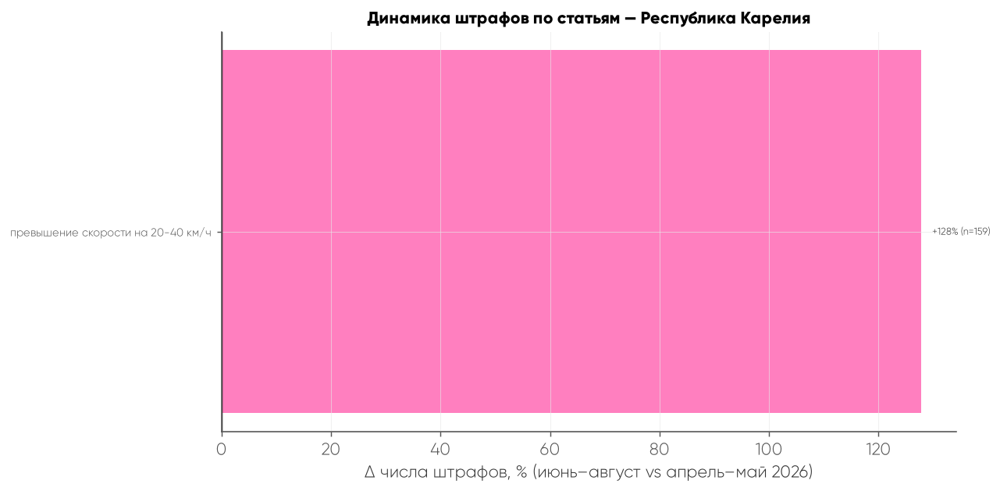

⚠️ Республика Коми: нет статей с total >= 100 — пропуск.


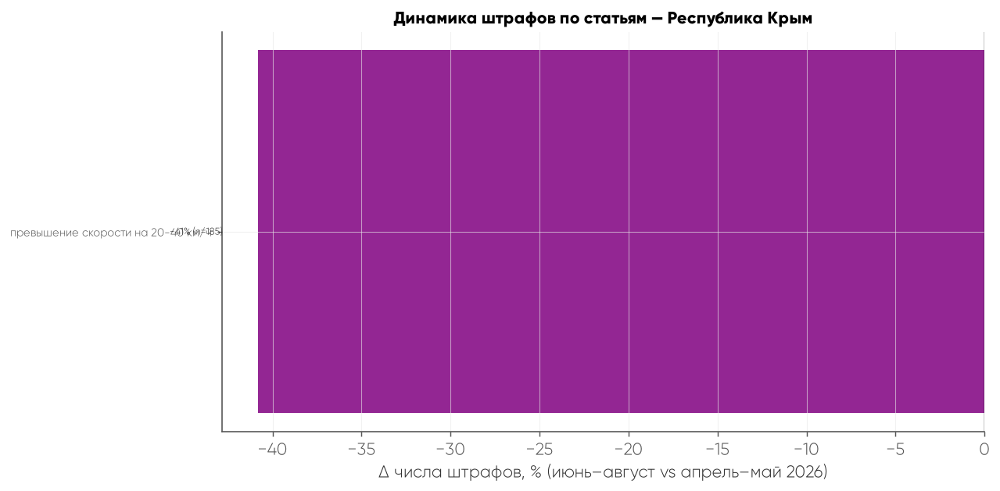

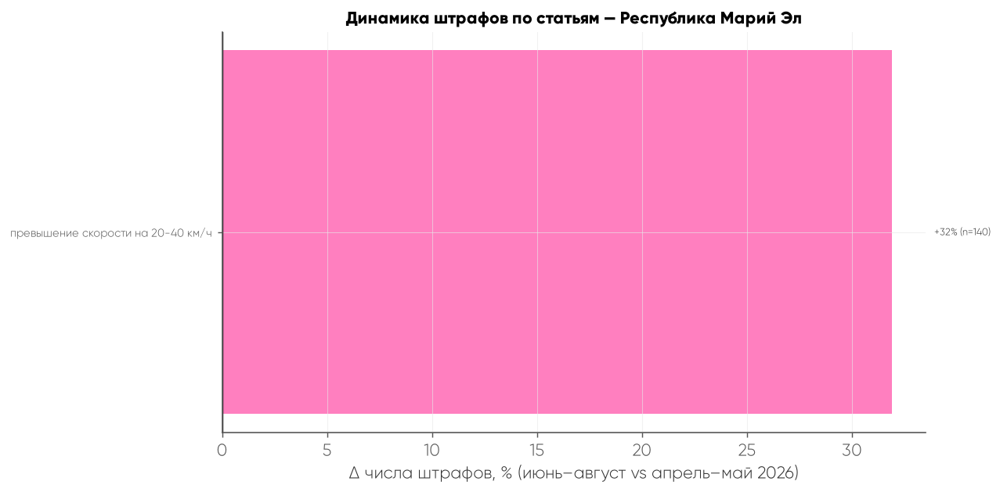

⚠️ Республика Мордовия: нет статей с total >= 100 — пропуск.
⚠️ Республика Северная Осетия: нет статей с total >= 100 — пропуск.


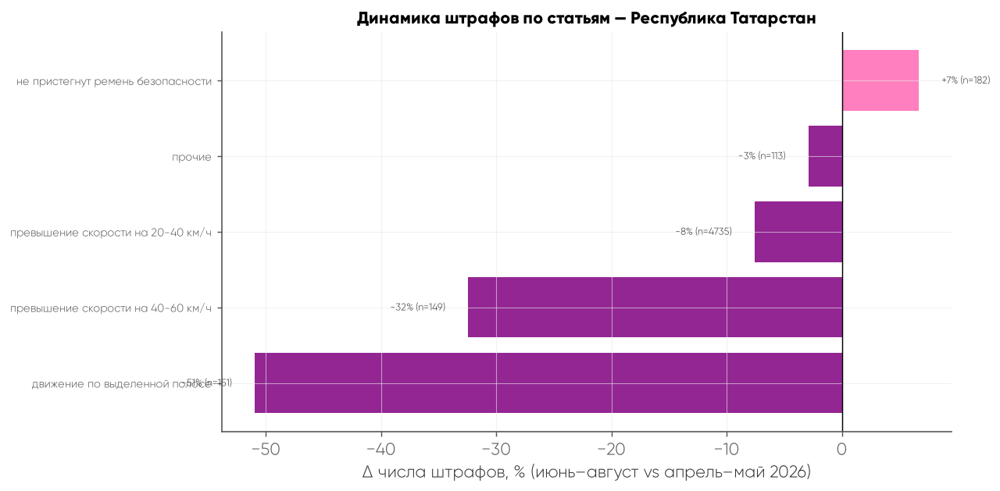

⚠️ Республика Тыва: нет статей с total >= 100 — пропуск.
⚠️ Республика Хакасия: нет статей с total >= 100 — пропуск.


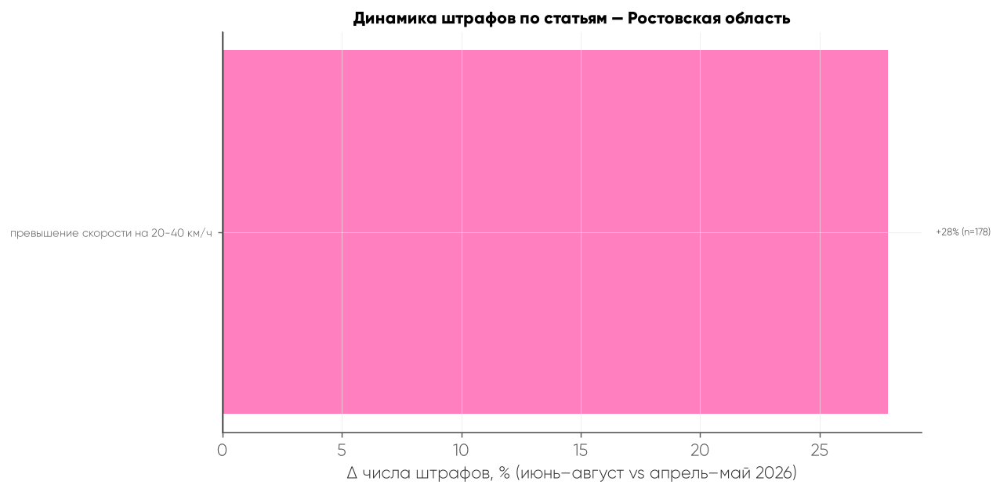

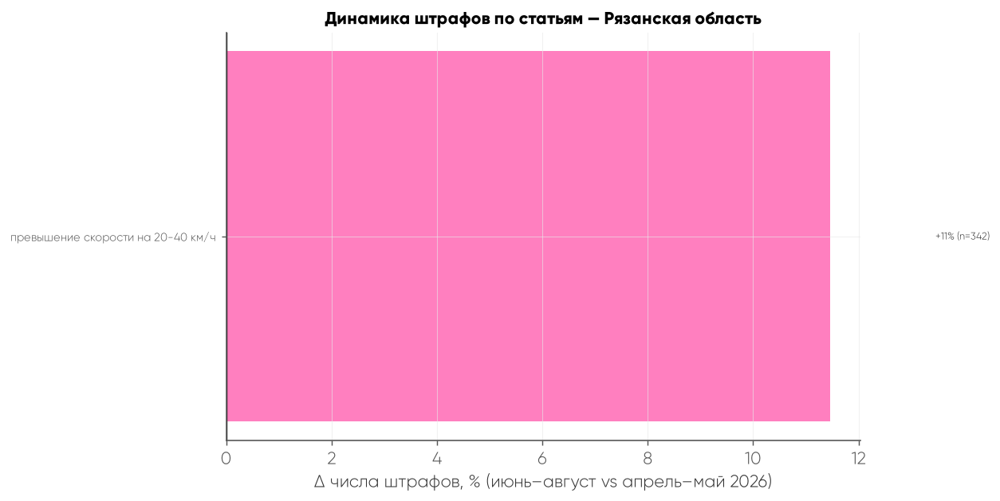

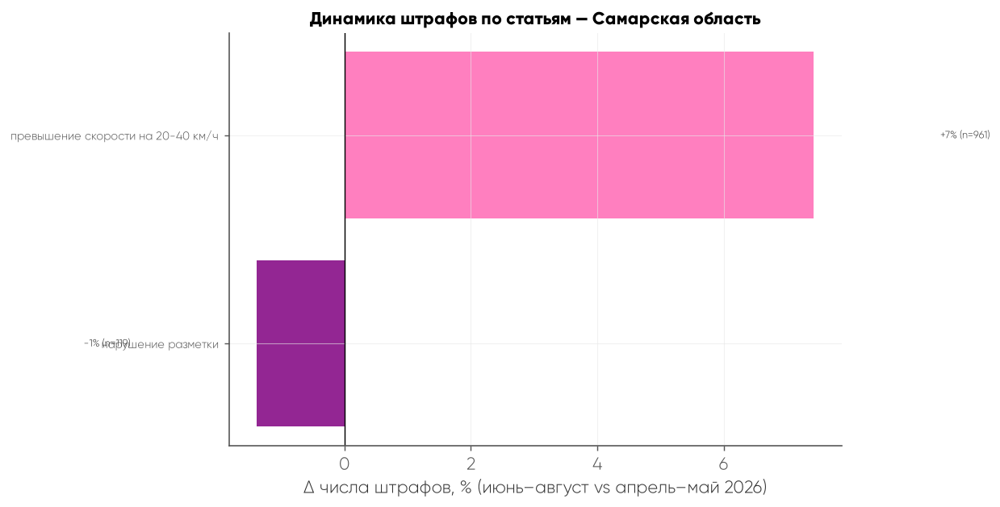

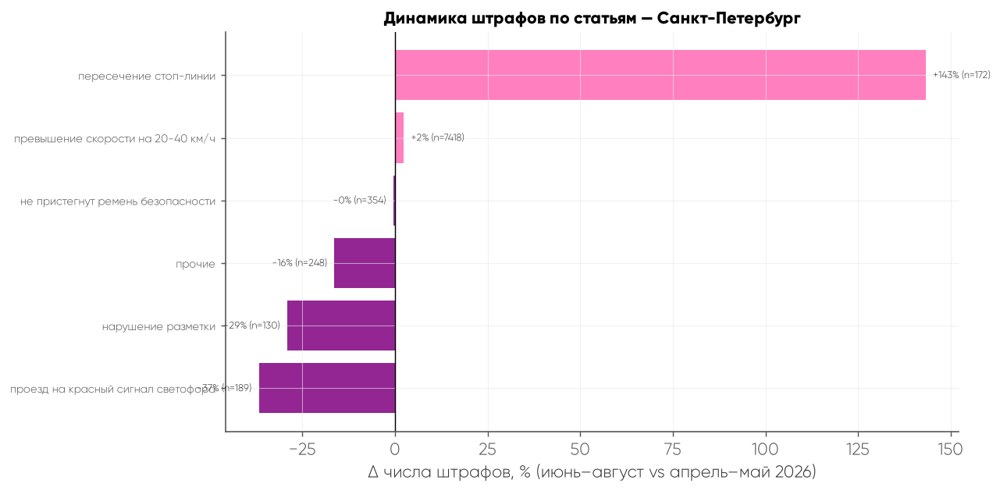

⚠️ Саратовская область: нет статей с total >= 100 — пропуск.
⚠️ Сахалинская область: нет статей с total >= 100 — пропуск.


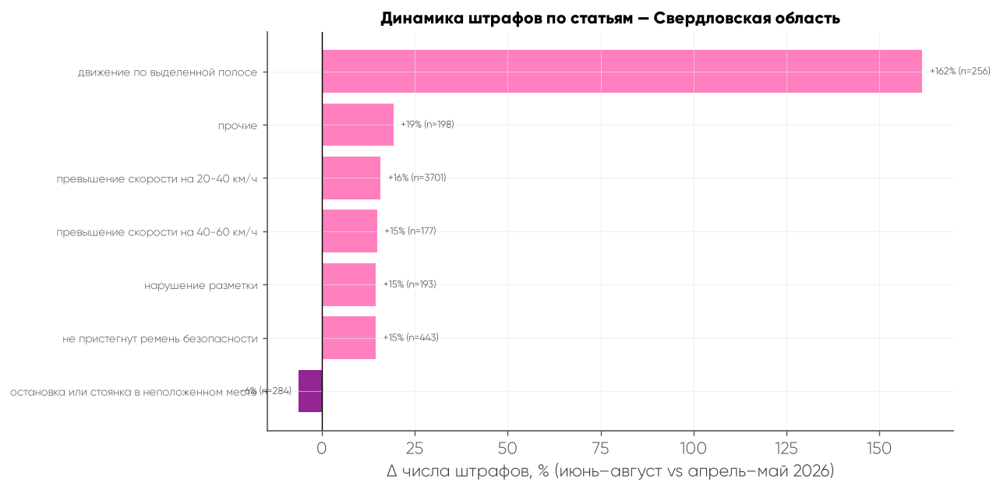

⚠️ Севастополь: нет статей с total >= 100 — пропуск.


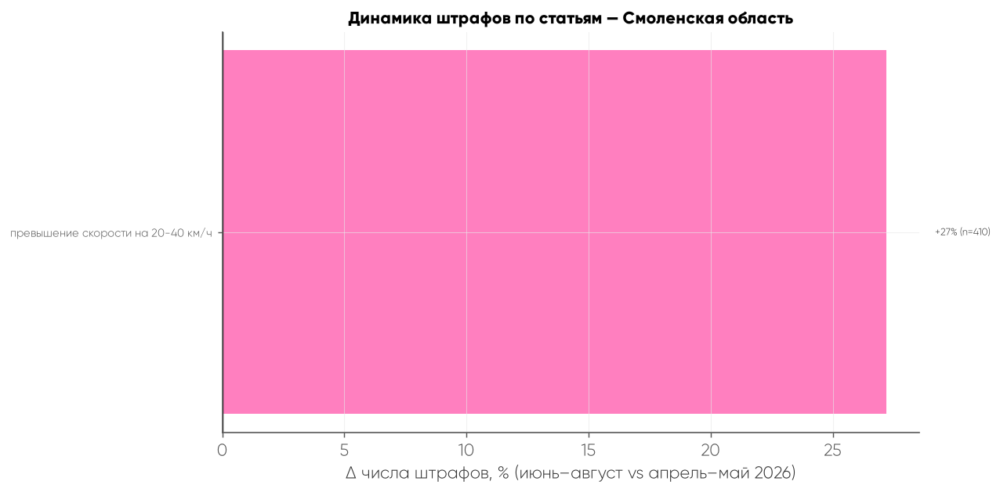

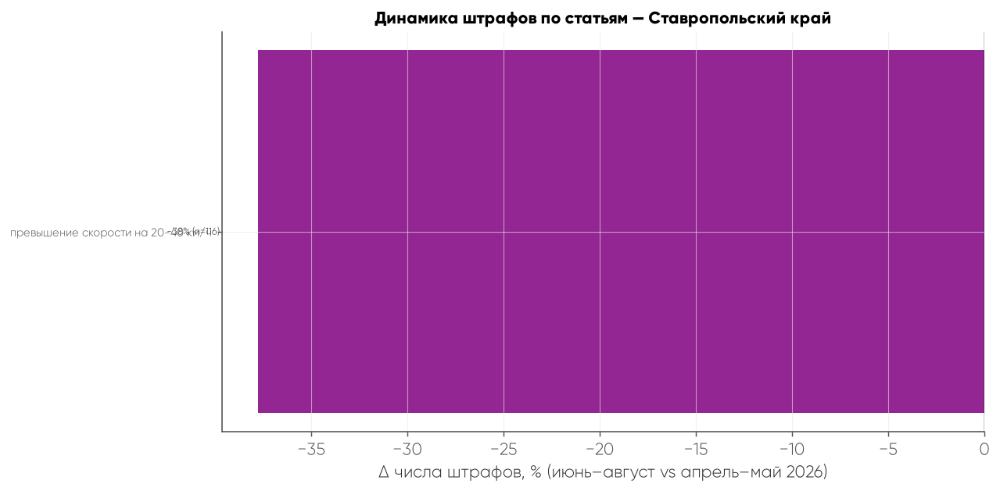

⚠️ Тамбовская область: нет статей с total >= 100 — пропуск.


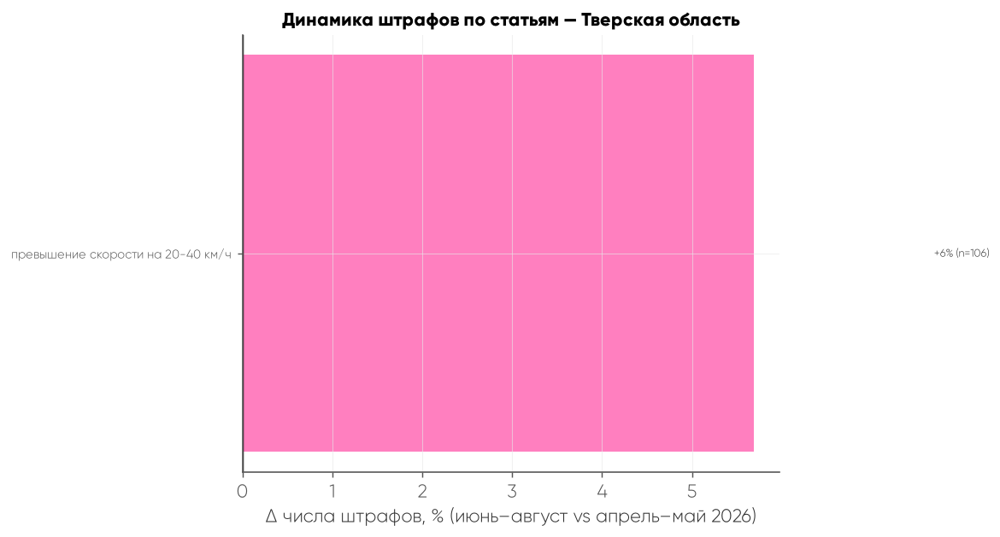

⚠️ Томская область: нет статей с total >= 100 — пропуск.


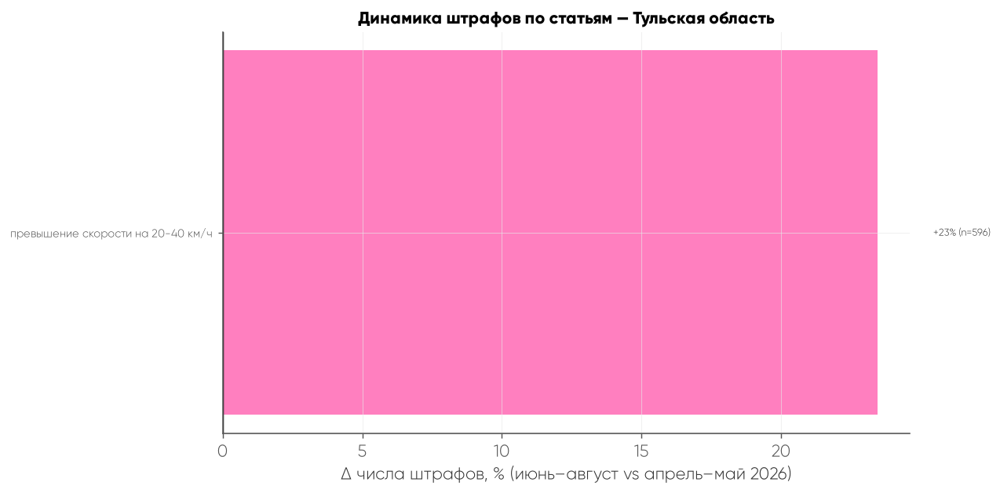

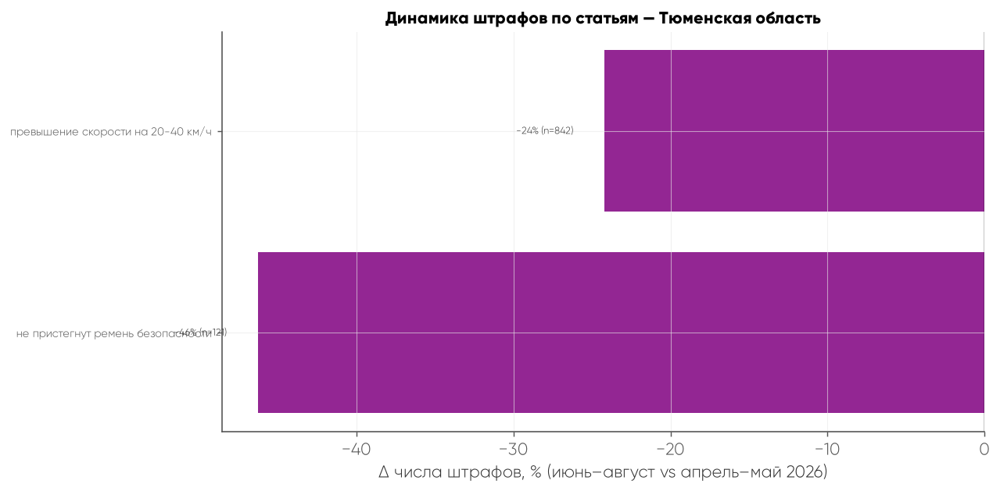

⚠️ Удмуртская Республика: нет статей с total >= 100 — пропуск.


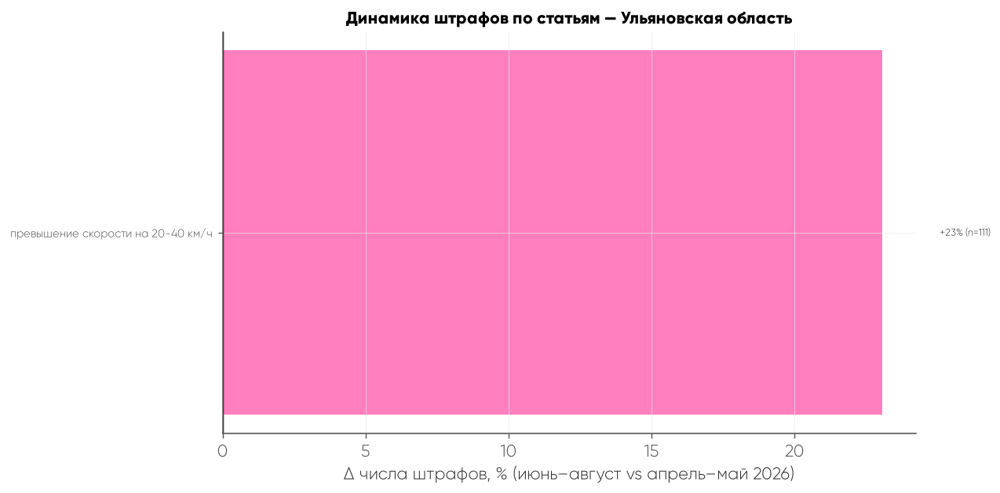

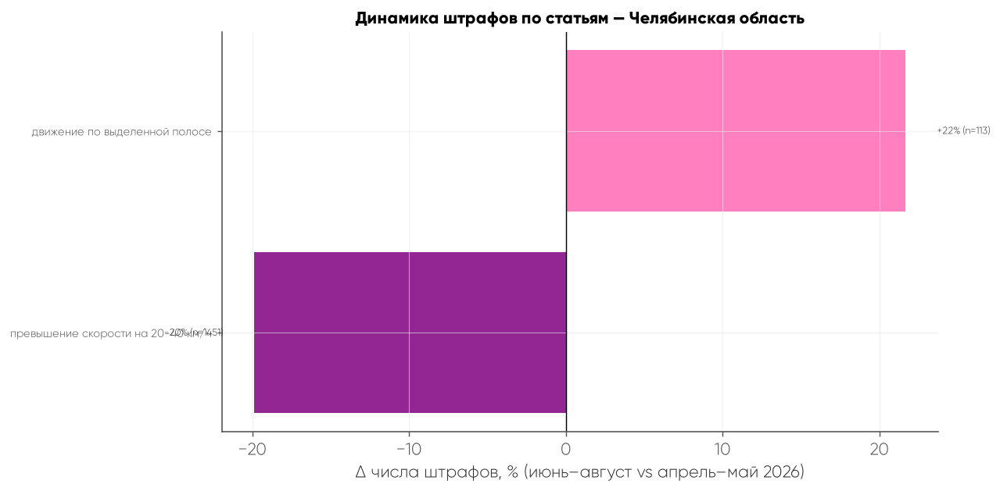

⚠️ Чеченская республика: нет статей с total >= 100 — пропуск.


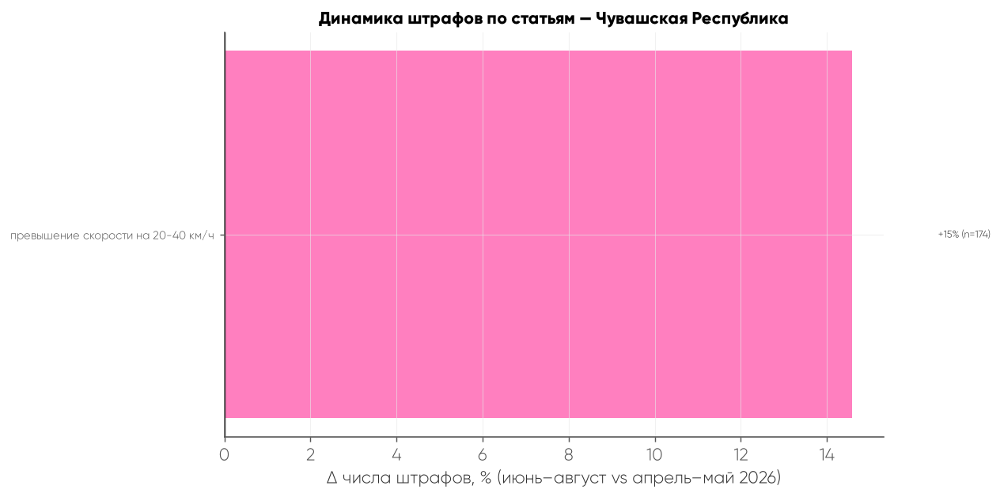

⚠️ Ямало-Ненецкий автономный округ: нет статей с total >= 100 — пропуск.
⚠️ Ярославская область: нет статей с total >= 100 — пропуск.


In [49]:
# ============================================================
# ДИНАМИКА ШТРАФОВ ПО СТАТЬЯМ — ТОЛЬКО СУЩЕСТВУЮЩИЕ РЕГИОНЫ
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

INK    = 'black'
PINK   = '#ff69b4'
PURPLE = '#800080'
MONTHS = [4, 5, 6, 7, 8]
BEFORE = [4, 5]
AFTER  = [6, 7, 8]

# ---------- 1. Определяем колонку с регионом ----------
if 'region_name' in f26.columns:
    reg_col = 'region_name'
    f26[reg_col] = f26[reg_col].astype(str).str.strip()
    # убираем пустые / NaN-подобные
    f26 = f26[~f26[reg_col].isin(['', 'nan', 'None', 'NaN'])]
elif 'kladr_code' in f26.columns:
    reg_col = 'region_code'
    f26[reg_col] = f26['kladr_code'].astype(str).str.zfill(2).str[:2]
else:
    raise ValueError('Нет ни region_name, ни kladr_code — регион определить нельзя.')

# ---------- 2. Список реально существующих регионов ----------
existing_regions = sorted(f26[reg_col].dropna().unique())
print(f'Всего регионов в данных: {len(existing_regions)}')
print('Список:', existing_regions)

# ---------- 3. Только те, что с галочкой ----------
# Сюда впишите ТОЛЬКО те значения, которые реально есть в existing_regions.
# Если список пустой — берём все существующие.
regions_with_checkmark = []   # ← сюда свои значения, ничего лишнего

if regions_with_checkmark:
    regions_to_plot = [r for r in regions_with_checkmark if r in existing_regions]
    missing = [r for r in regions_with_checkmark if r not in existing_regions]
    if missing:
        print('⚠️ Этих регионов нет в данных, пропускаю:', missing)
else:
    regions_to_plot = existing_regions

print('Будут построены графики для:', regions_to_plot)

# ---------- 4. Цикл: график по каждому существующему региону ----------
for region in regions_to_plot:
    df_reg = f26[f26[reg_col] == region]

    if df_reg.empty:
        print(f'⚠️ {region}: пусто — пропуск.')
        continue

    art_month = (
        df_reg
        .groupby(['article_name', 'month'])
        .size()
        .unstack(fill_value=0)
        .reindex(columns=MONTHS, fill_value=0)
    )

    before_mean = art_month[BEFORE].mean(axis=1)
    after_mean  = art_month[AFTER].mean(axis=1)
    change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100
    total       = art_month.sum(axis=1)

    art_dyn = pd.DataFrame({
        'before': before_mean,
        'after':  after_mean,
        'change_pct': change,
        'total': total,
    }).dropna()

    # фильтр: только статьи с total >= 100
    art_dyn = art_dyn[art_dyn['total'] >= 100].sort_values('change_pct')

    if art_dyn.empty:
        print(f'⚠️ {region}: нет статей с total >= 100 — пропуск.')
        continue

    fig, ax = plt.subplots(figsize=(10, max(5, len(art_dyn) * 0.35)))
    colors = [PURPLE if v < 0 else PINK for v in art_dyn['change_pct']]
    ax.barh(art_dyn.index, art_dyn['change_pct'], color=colors, alpha=0.85)
    ax.axvline(0, color=INK, linewidth=0.8)
    ax.set_xlabel('Δ числа штрафов, % (июнь–август vs апрель–май 2026)')
    ax.set_title(f'Динамика штрафов по статьям — {region}',
                 fontsize=12, fontweight='bold', color=INK)

    for i, (v, t) in enumerate(zip(art_dyn['change_pct'], art_dyn['total'])):
        ax.text(v + (2 if v >= 0 else -2), i,
                f'{v:+.0f}% (n={int(t)})',
                va='center', ha='left' if v >= 0 else 'right', fontsize=7)

    ax.tick_params(axis='y', labelsize=8)
    plt.tight_layout()
    plt.show()      # ← вывод в окно, ничего не сохраняется

Регионов: 77 -> ['Алтайский край', 'Амурская область', 'Астраханская область', 'Белгородская область', 'Брянская область', 'Владимирская область', 'Волгоградская область', 'Вологодская область', 'Воронежская область', 'Забайкальский край', 'Запорожская область', 'Ивановская область', 'Иркутская область', 'Кабардино-Балкарская Республика', 'Калининградская область', 'Калужская область', 'Камчатский край', 'Кемеровская область', 'Кировская область', 'Костромская область', 'Краснодарский край', 'Красноярский край', 'Курганская область', 'Курская область', 'Ленинградская область', 'Липецкая область', 'Москва', 'Московская область', 'Мурманская область', 'Нижегородская область', 'Новгородская область', 'Новосибирская область', 'Омская область', 'Оренбургская область', 'Орловская область', 'Пензенская область', 'Пермский край', 'Приморский край', 'Псковская область', 'Республика Адыгея', 'Республика Алтай', 'Республика Башкортостан', 'Республика Бурятия', 'Республика Дагестан', 'Республика К

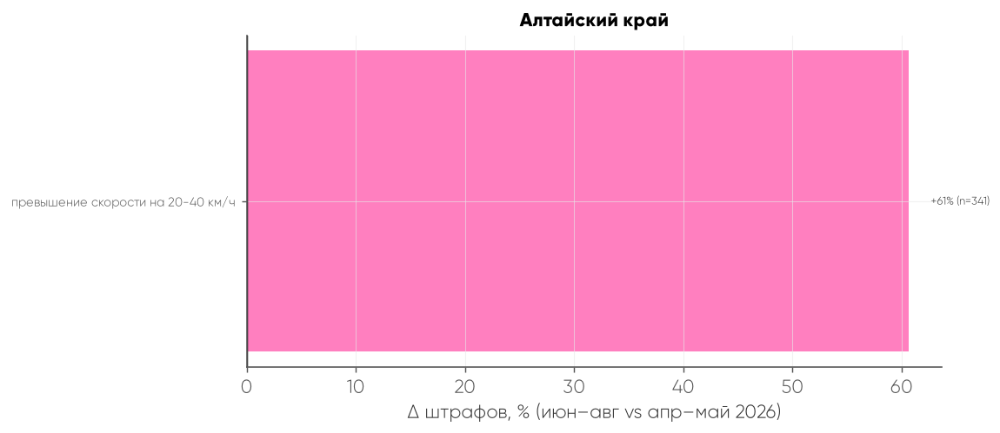

⚠️ Амурская область: нет статей с total >= 50
⚠️ Астраханская область: нет статей с total >= 50
⚠️ Белгородская область: нет статей с total >= 50
⚠️ Брянская область: нет статей с total >= 50


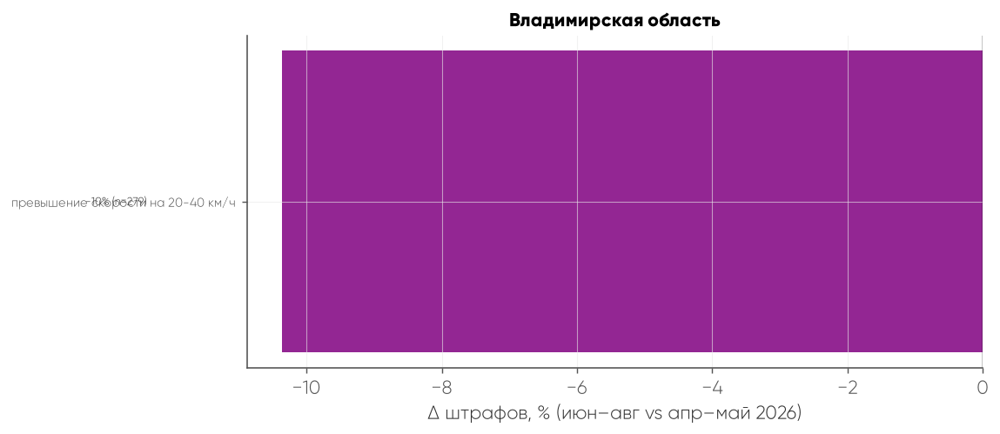

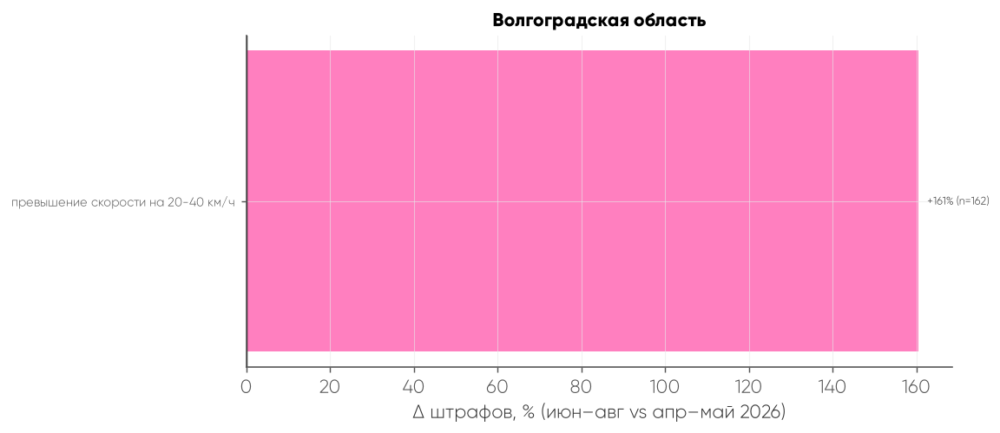

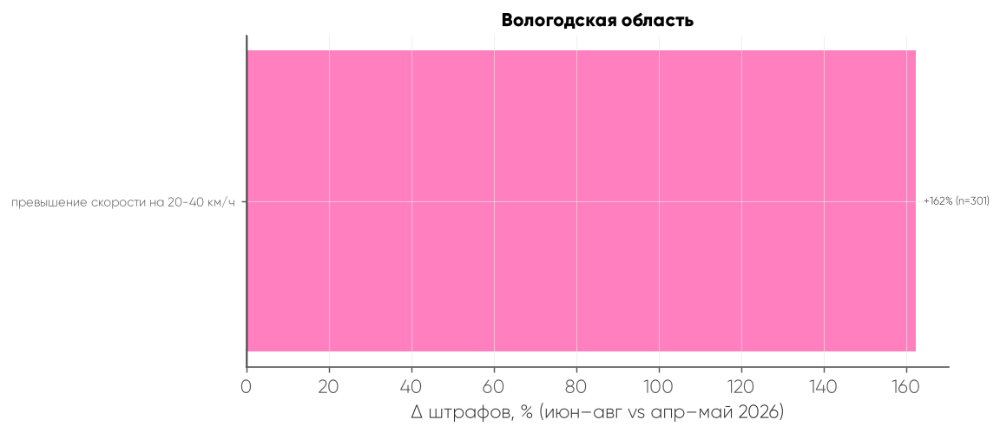

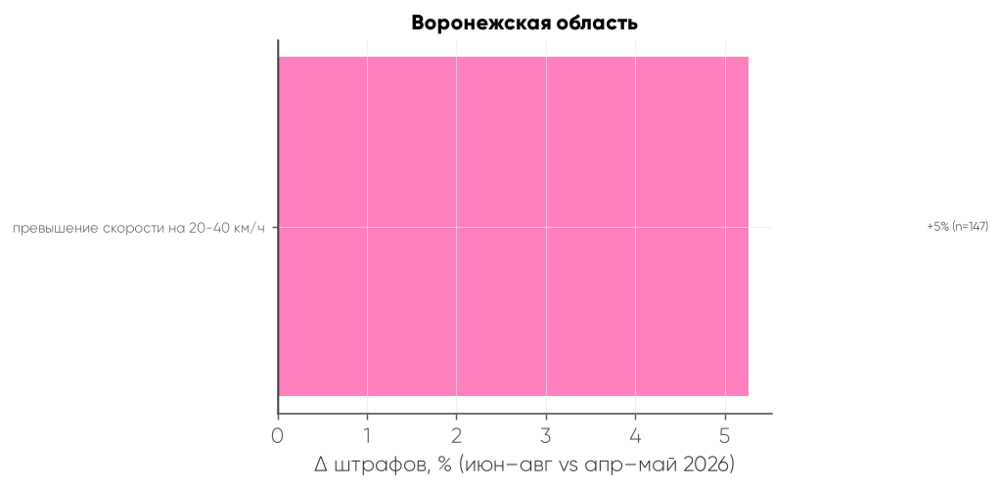

⚠️ Забайкальский край: нет статей с total >= 50
⚠️ Запорожская область: нет статей с total >= 50
⚠️ Ивановская область: нет статей с total >= 50
⚠️ Иркутская область: нет статей с total >= 50


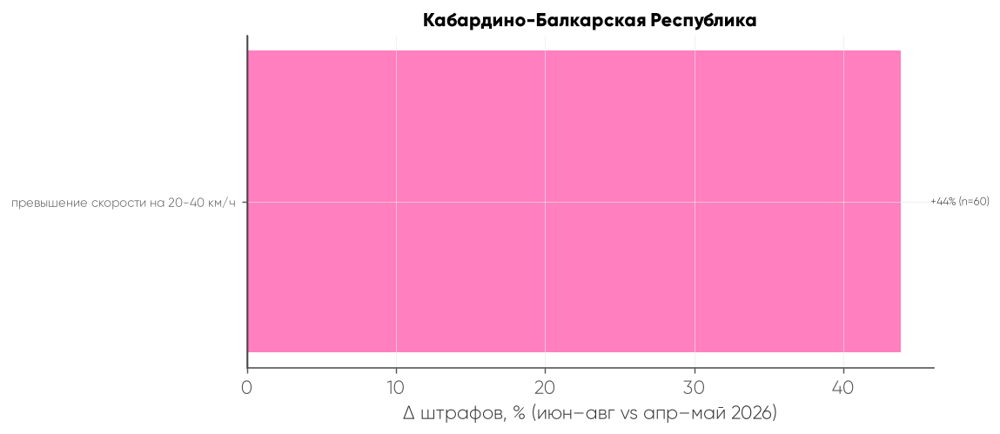

⚠️ Калининградская область: нет статей с total >= 50


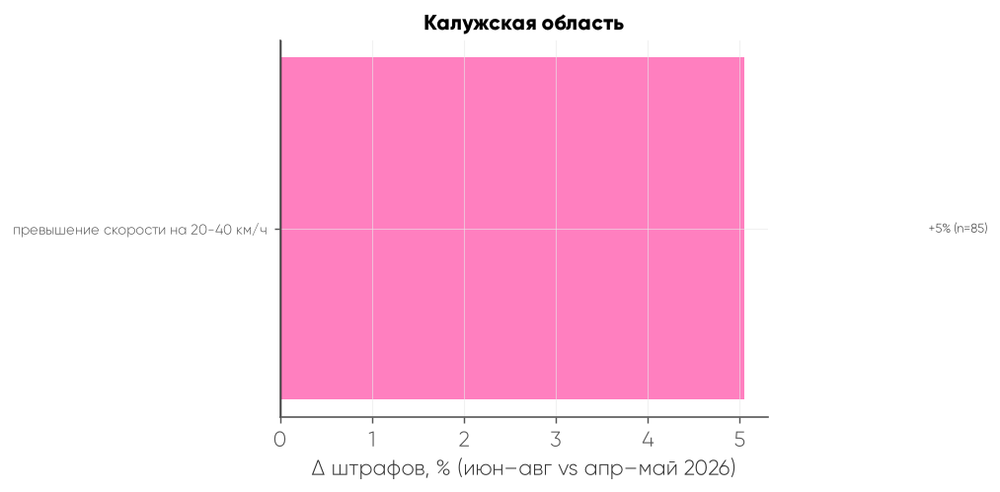

⚠️ Камчатский край: нет статей с total >= 50


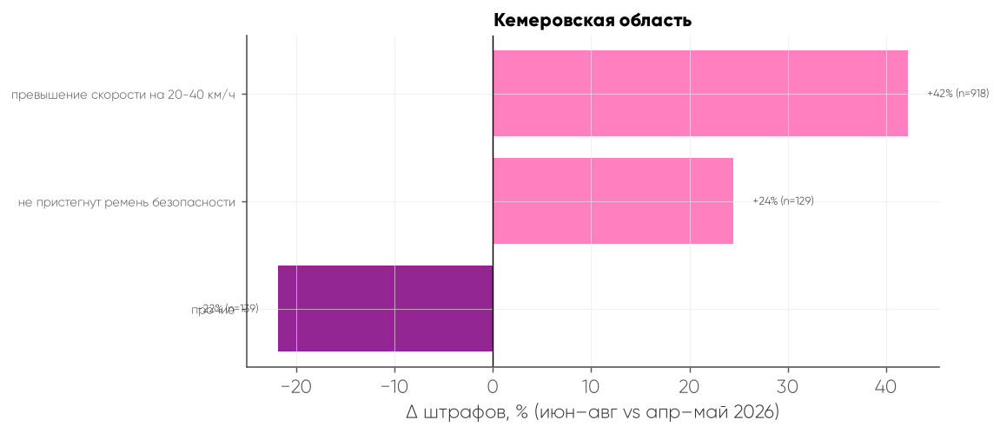

⚠️ Кировская область: нет статей с total >= 50


/tmp/ipykernel_74084/1208646060.py:50: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


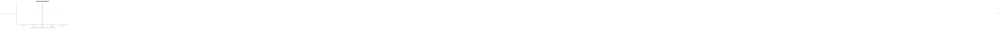

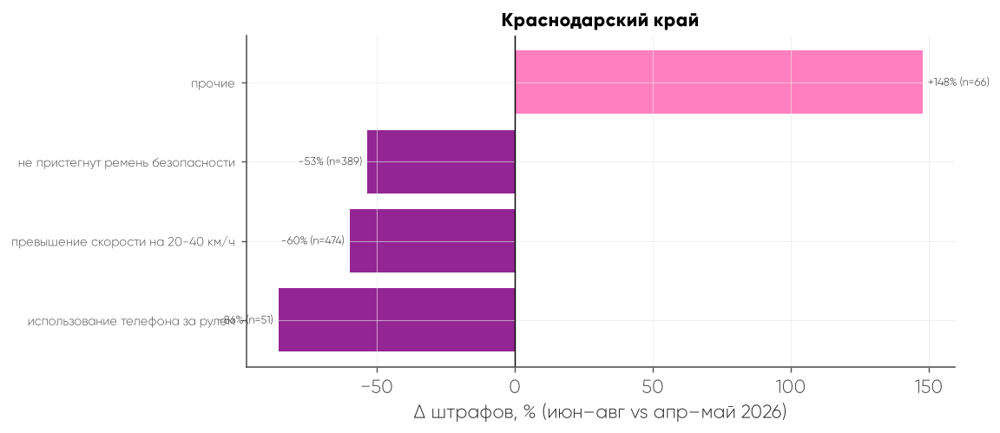

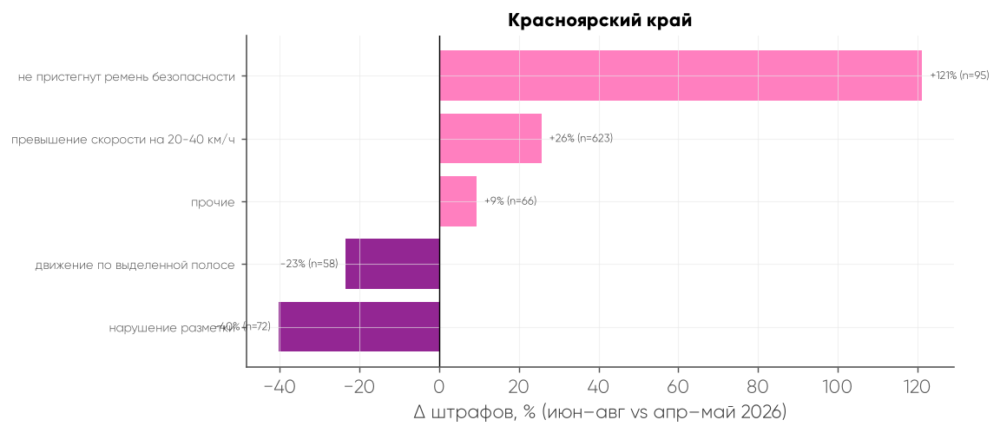

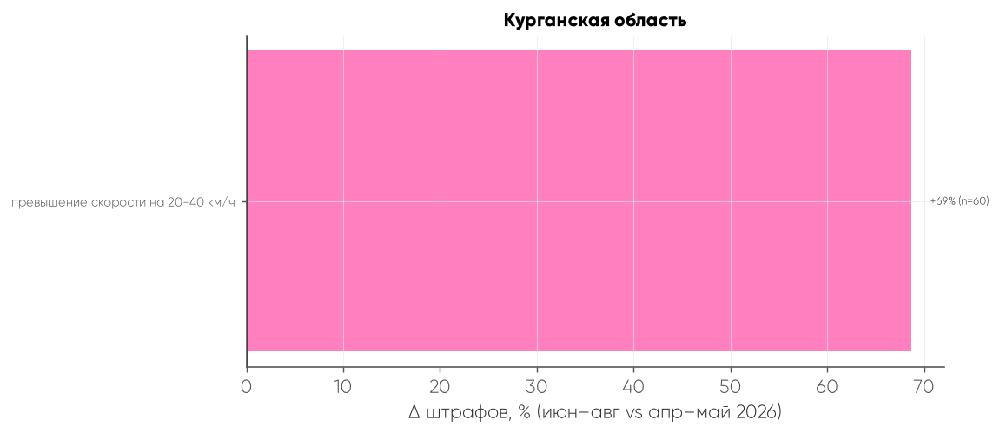

⚠️ Курская область: нет статей с total >= 50


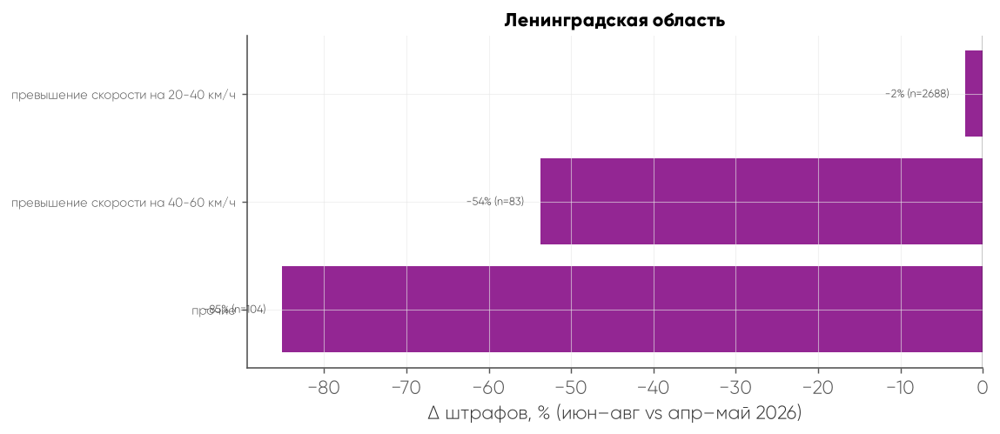

⚠️ Липецкая область: нет статей с total >= 50


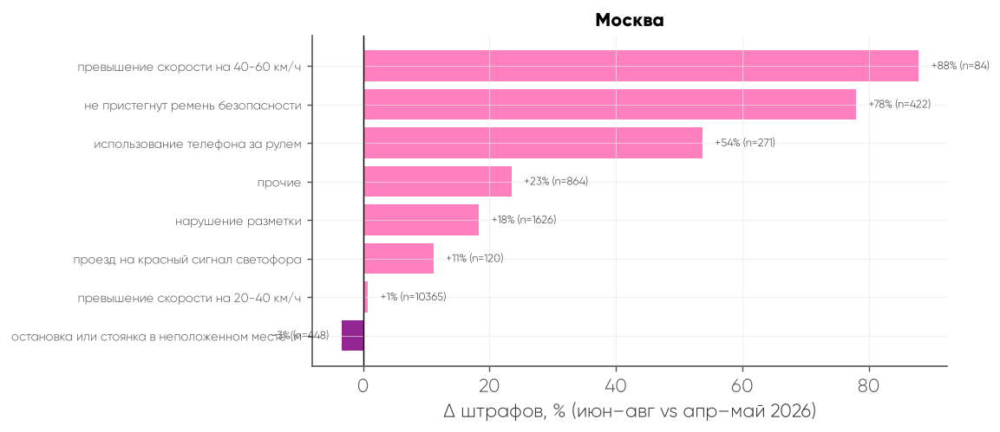

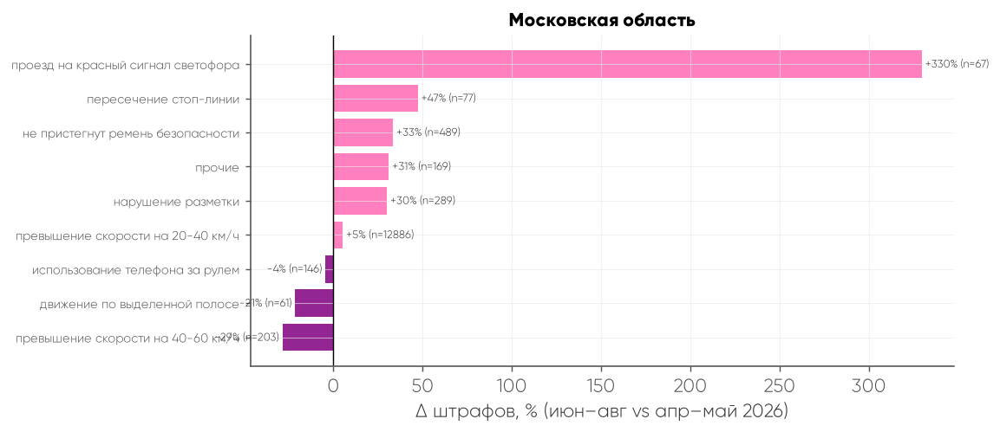

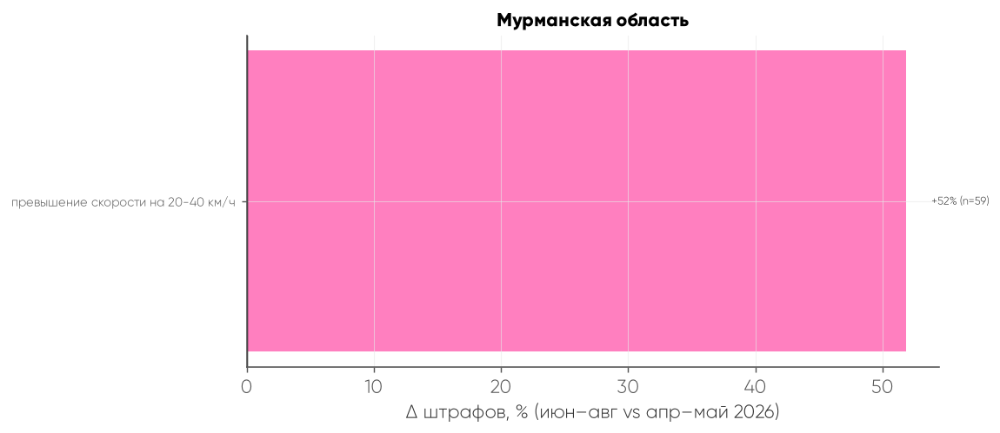

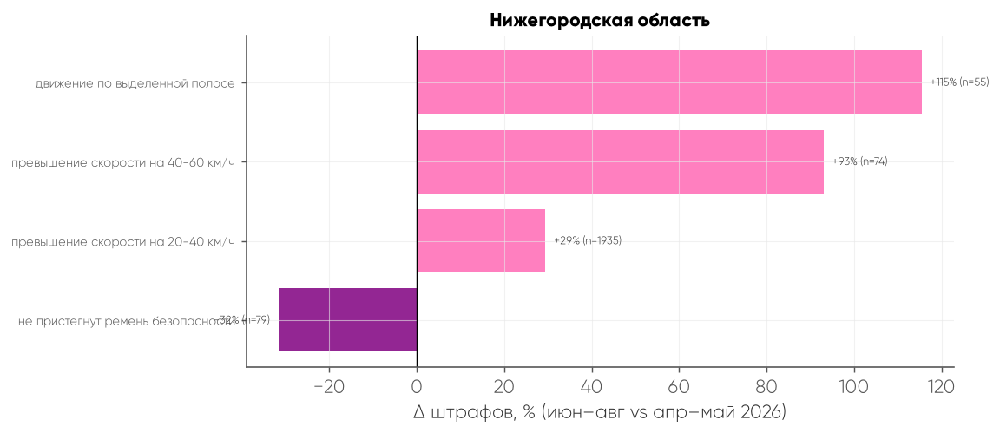

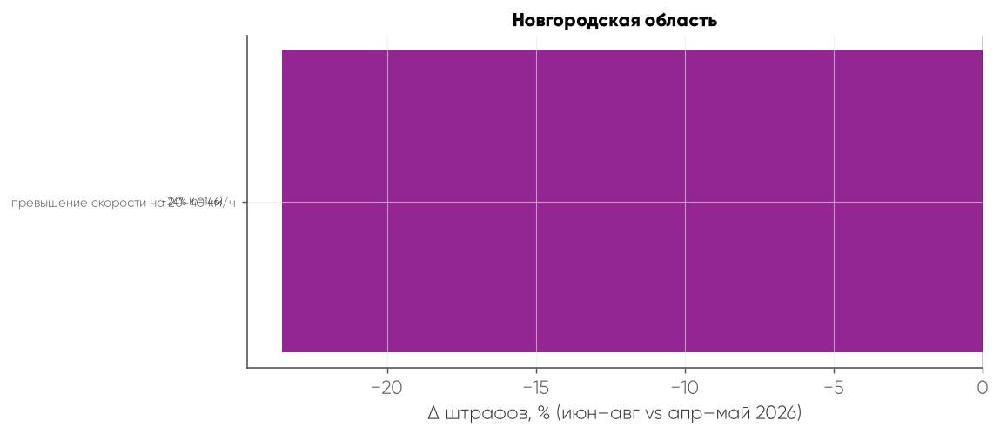

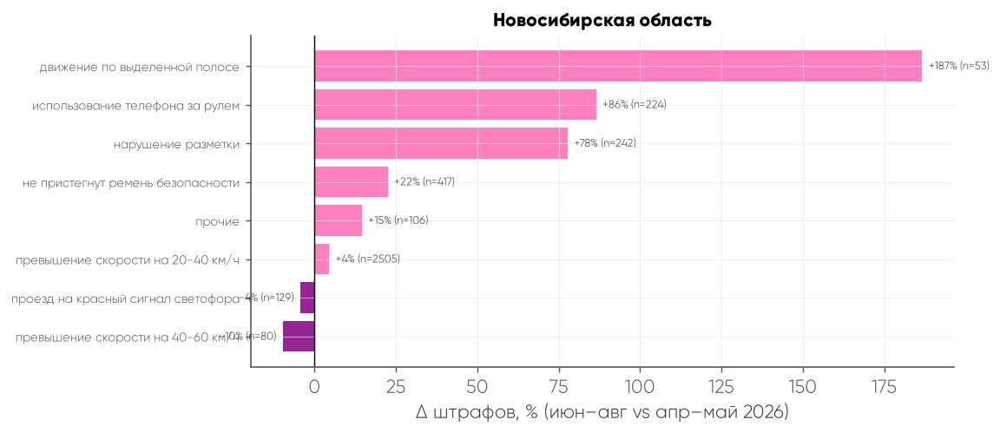

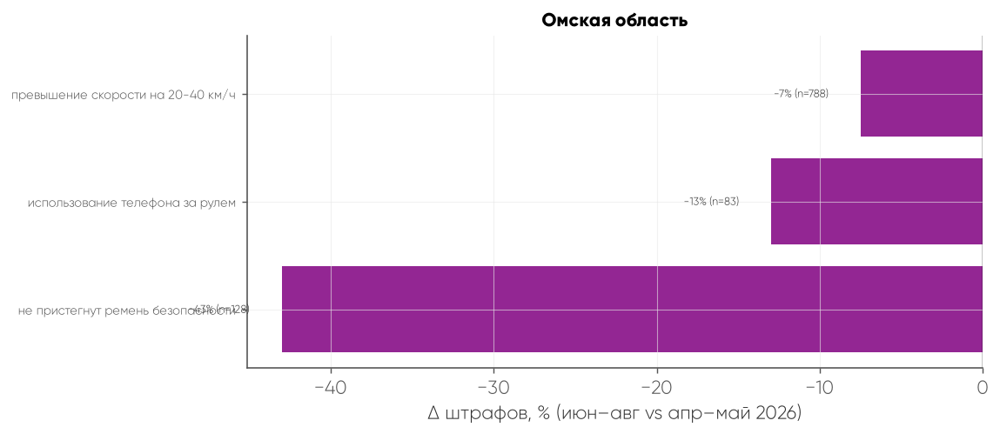

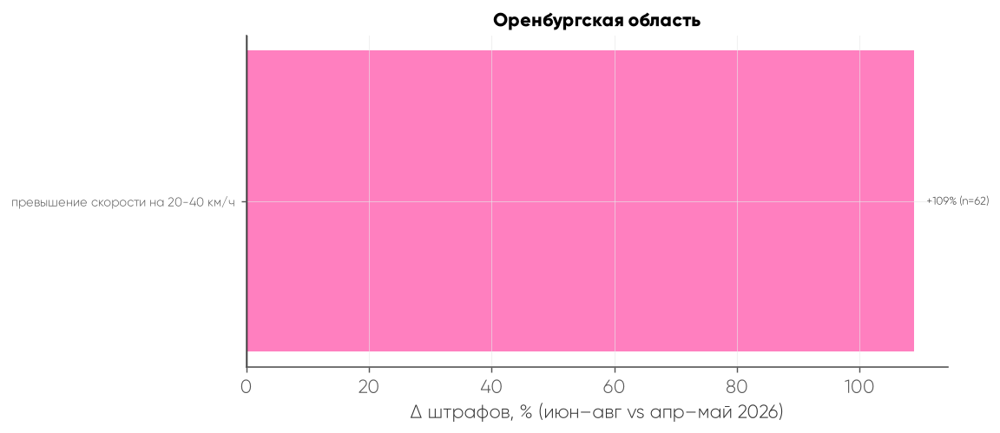

⚠️ Орловская область: нет статей с total >= 50
⚠️ Пензенская область: нет статей с total >= 50


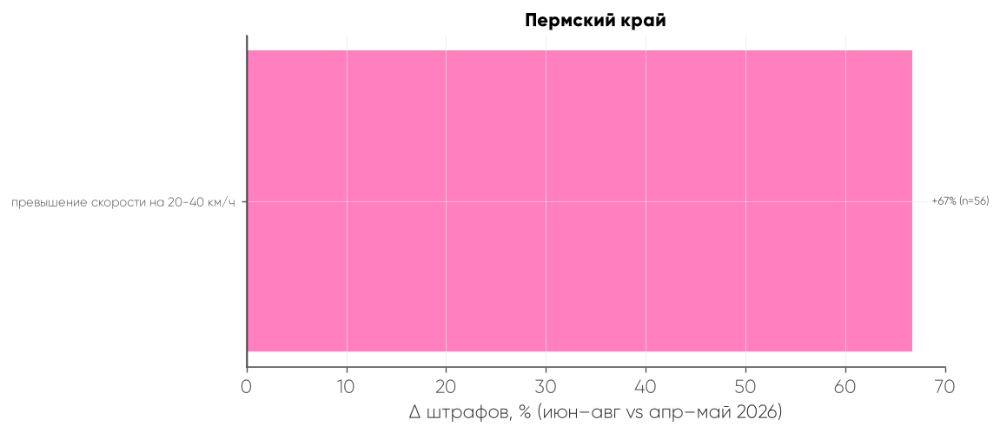

⚠️ Приморский край: нет статей с total >= 50


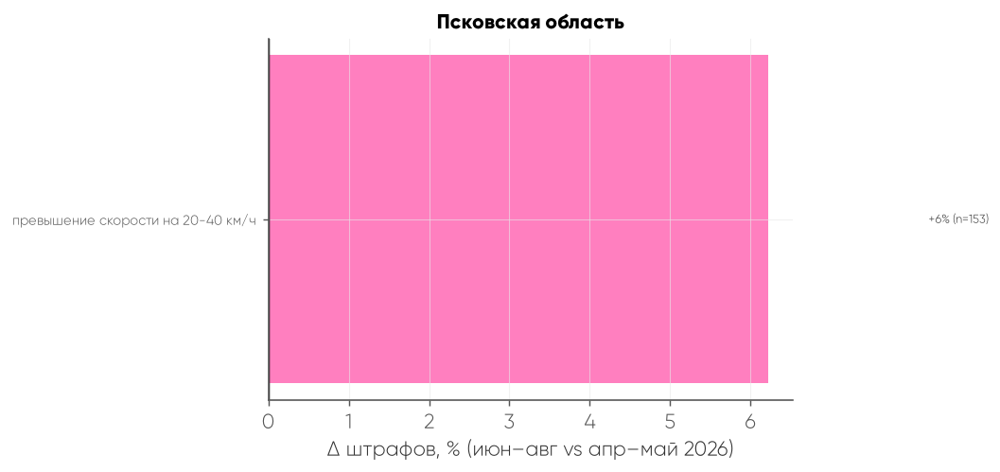

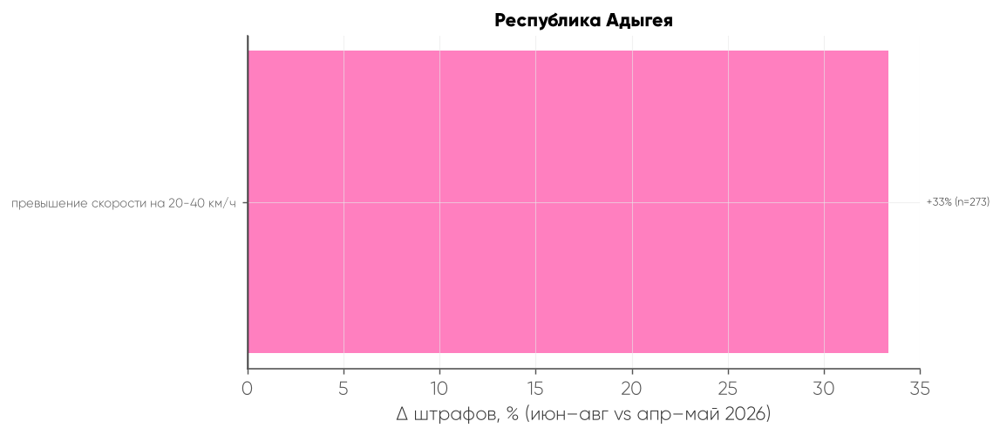

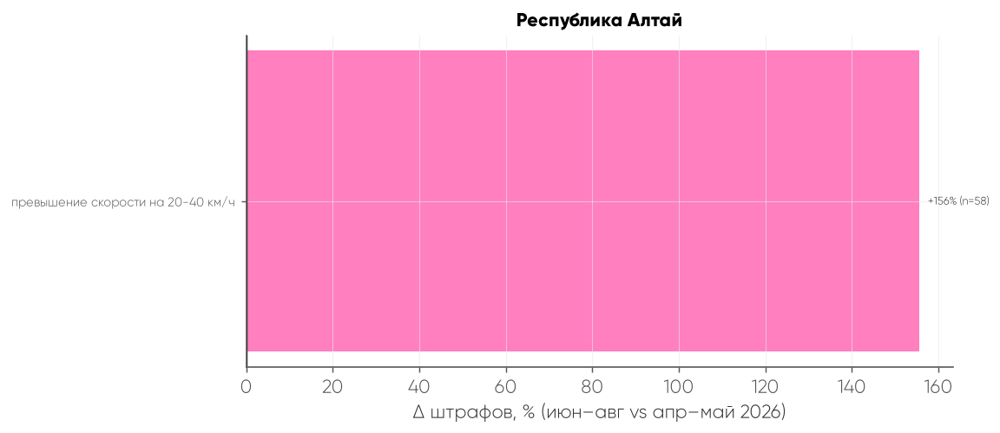

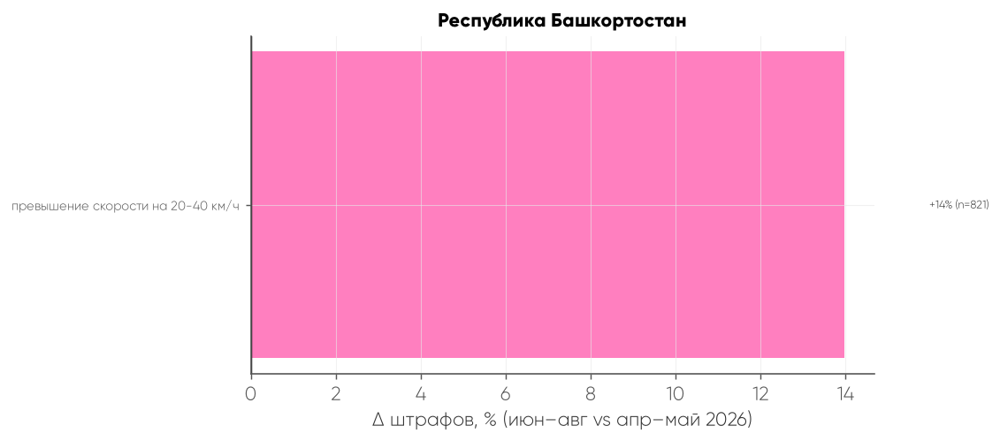

⚠️ Республика Бурятия: нет статей с total >= 50
⚠️ Республика Дагестан: нет статей с total >= 50
⚠️ Республика Калмыкия: нет статей с total >= 50
⚠️ Республика Карачаево-Черкессия: нет статей с total >= 50


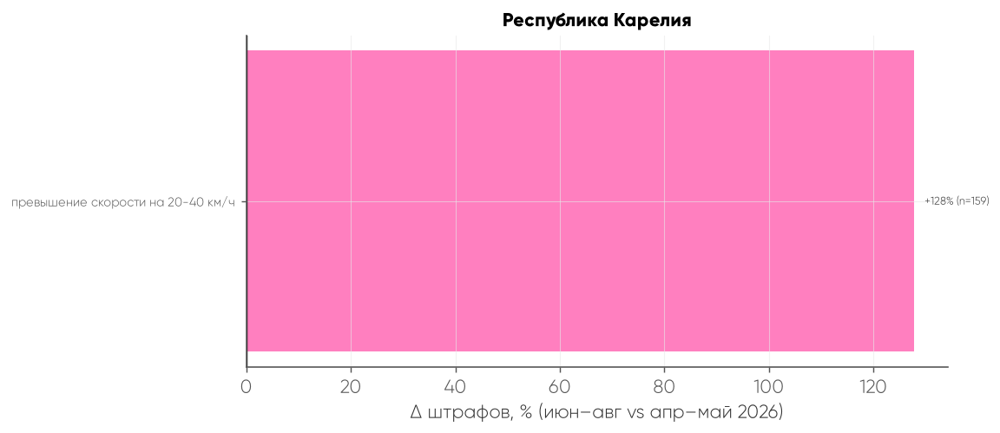

⚠️ Республика Коми: нет статей с total >= 50


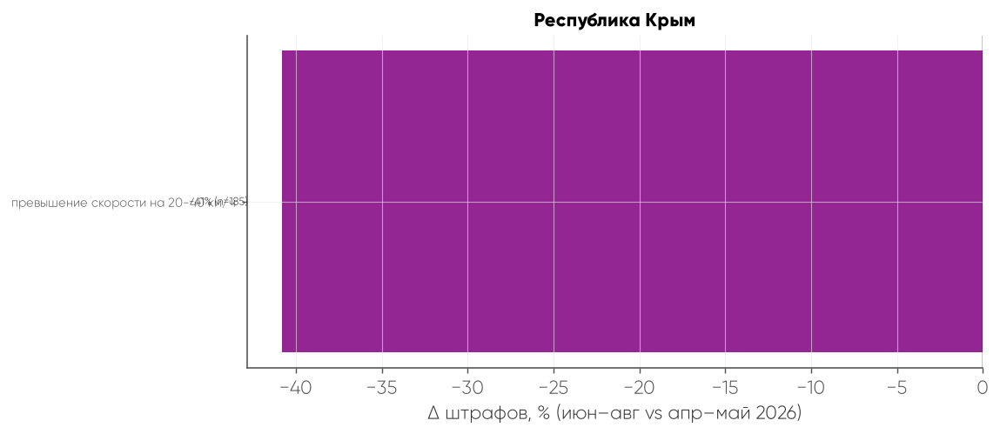

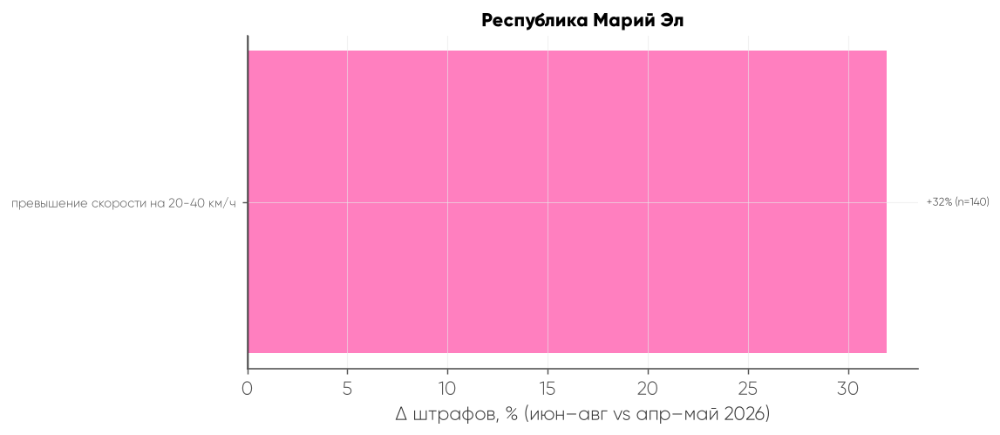

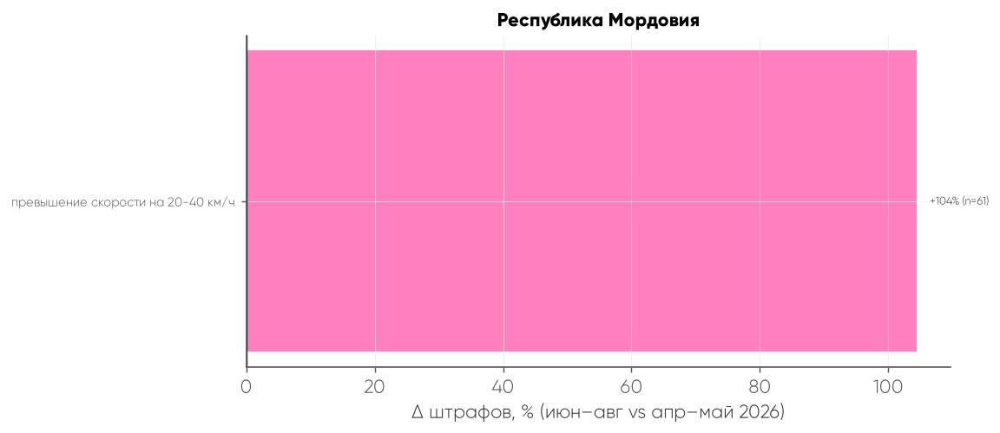

⚠️ Республика Северная Осетия: нет статей с total >= 50


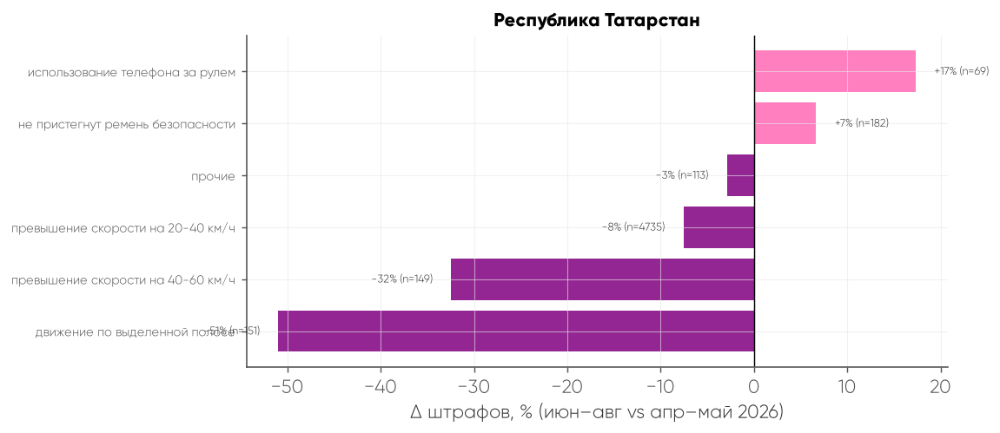

⚠️ Республика Тыва: нет статей с total >= 50
⚠️ Республика Хакасия: нет статей с total >= 50


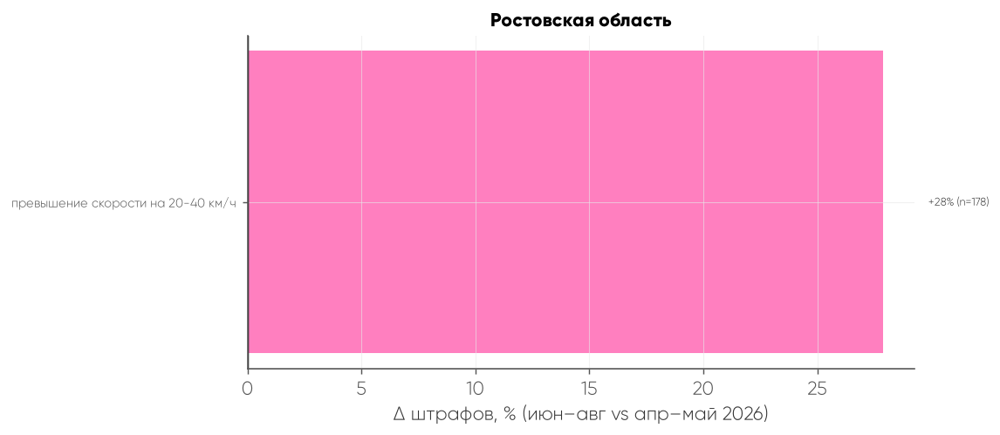

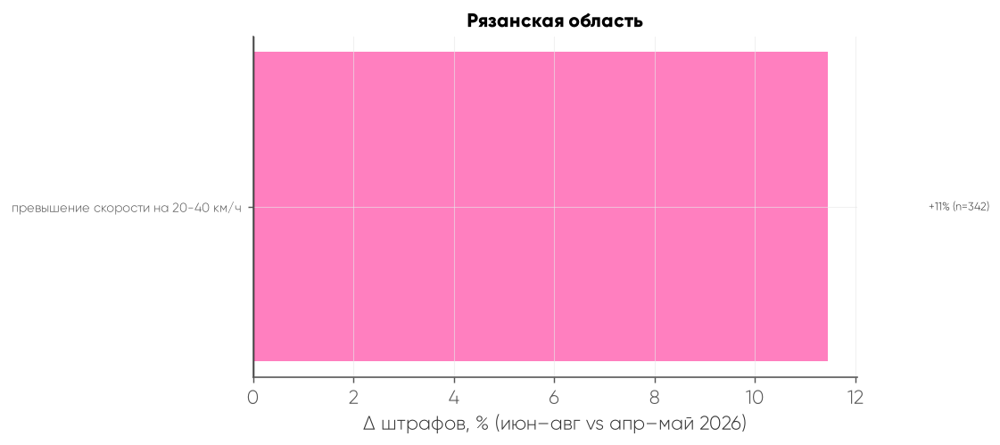

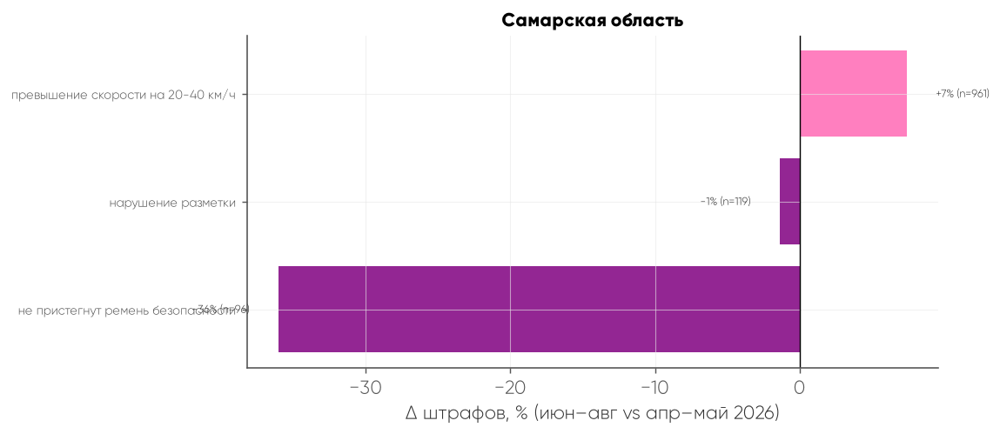

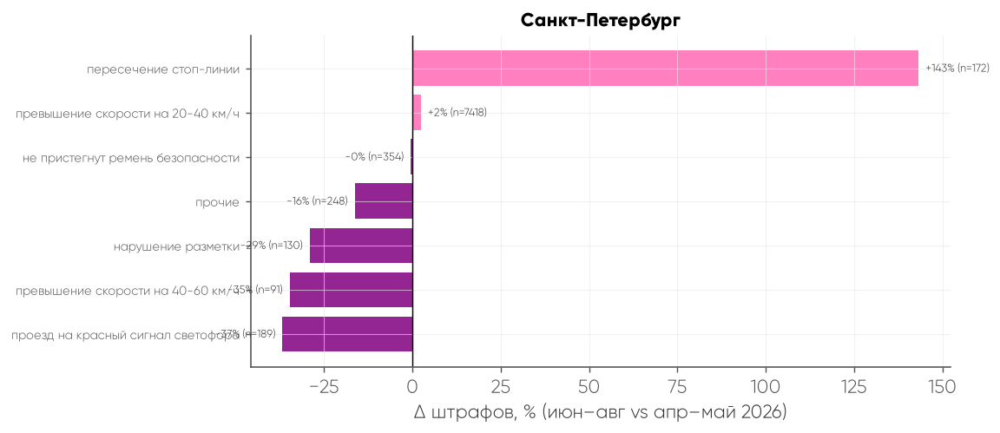

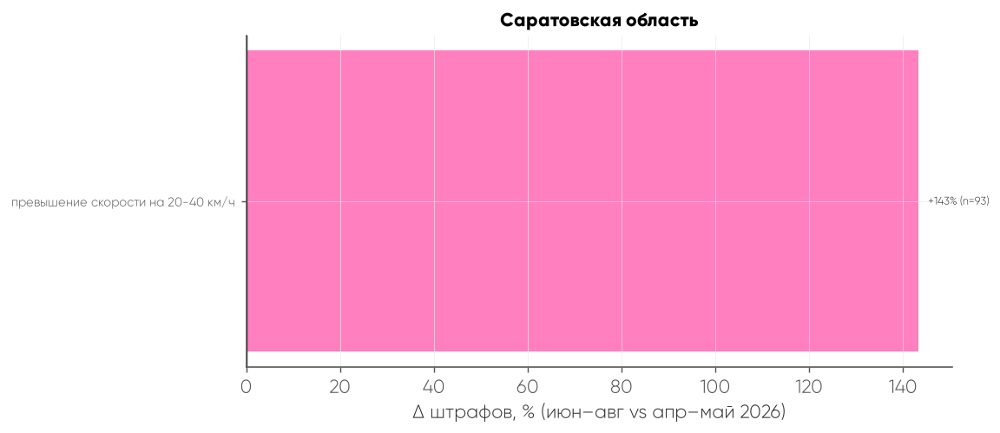

⚠️ Сахалинская область: нет статей с total >= 50


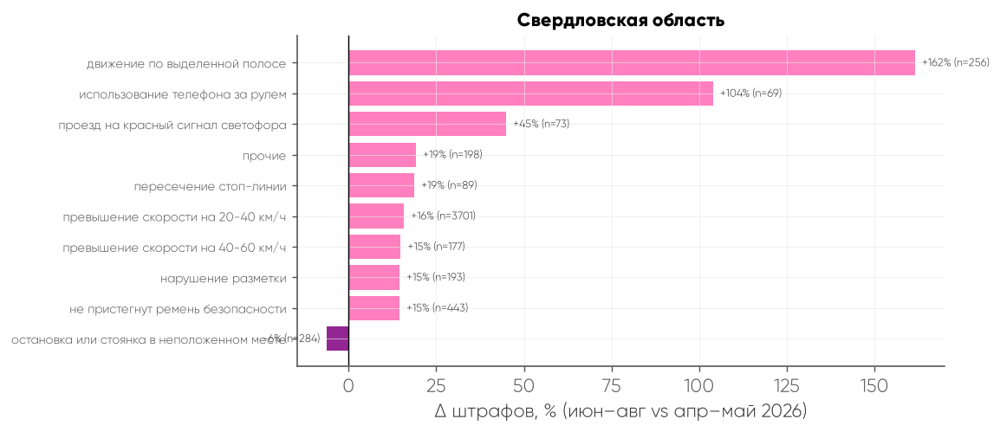

⚠️ Севастополь: нет статей с total >= 50


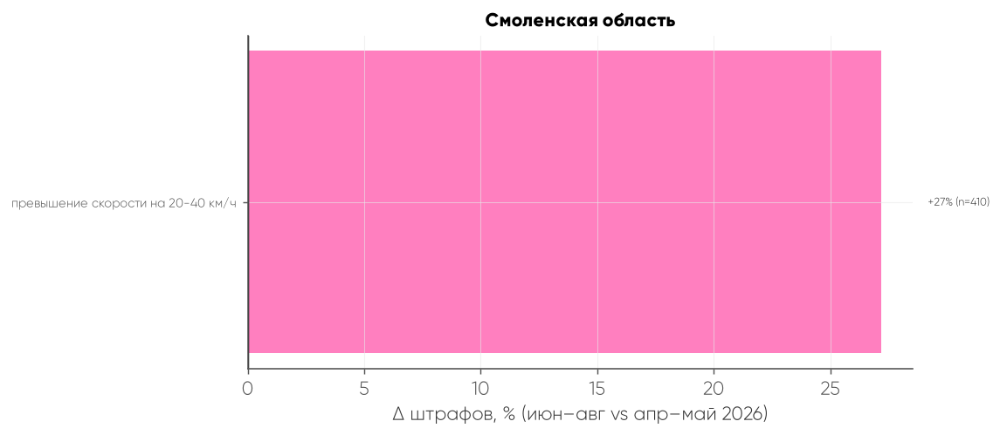

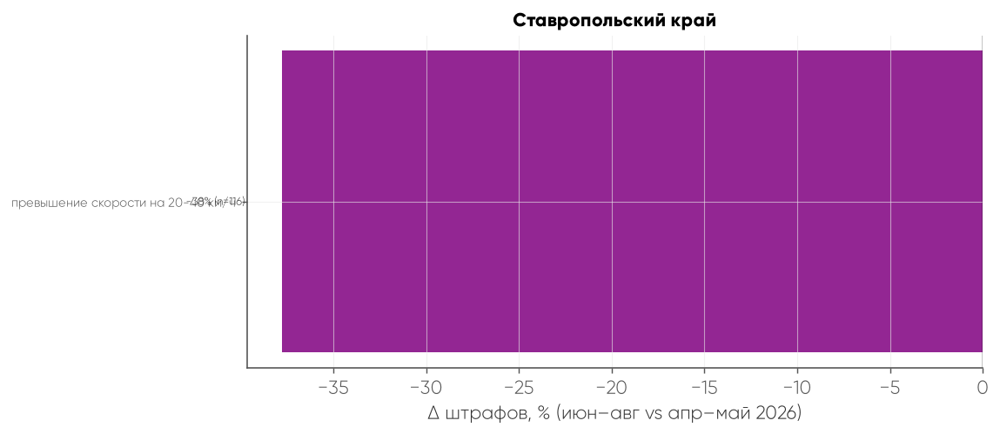

⚠️ Тамбовская область: нет статей с total >= 50


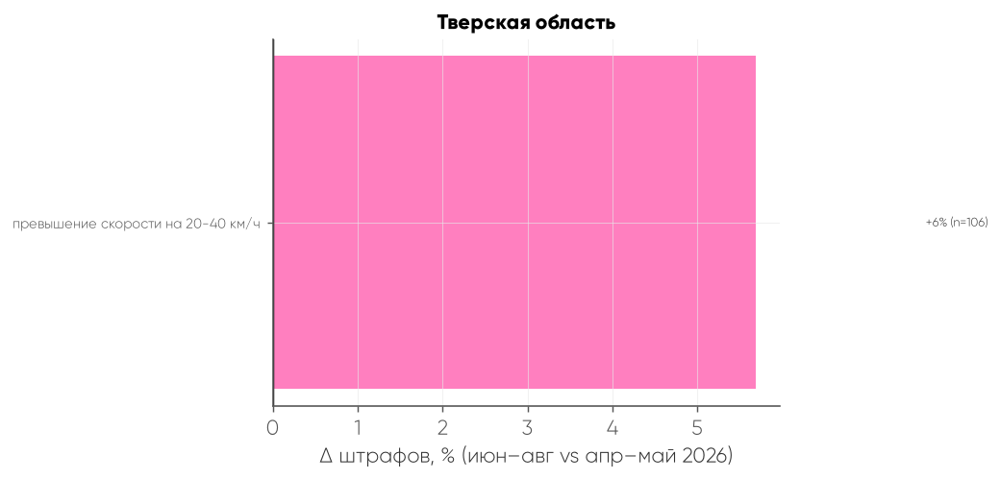

⚠️ Томская область: нет статей с total >= 50


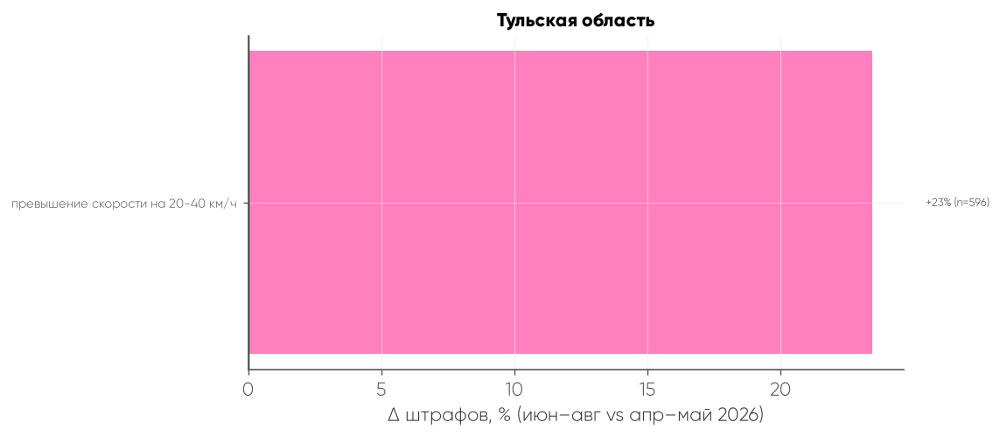

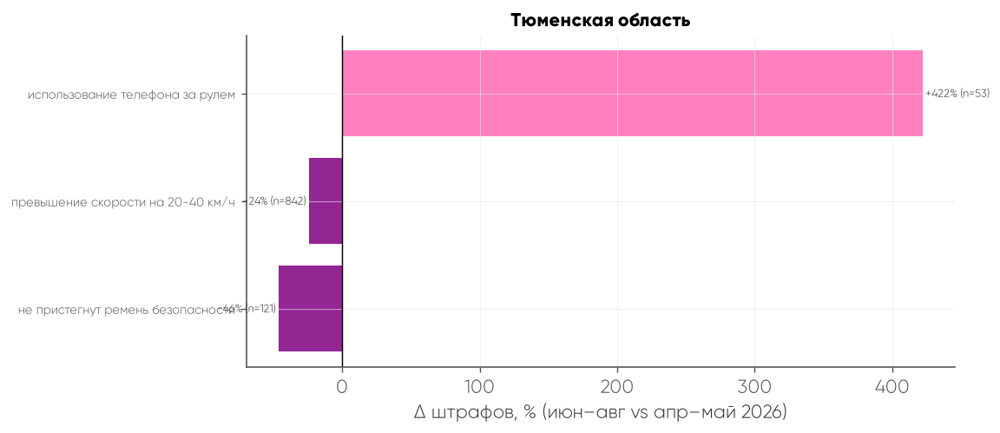

⚠️ Удмуртская Республика: нет статей с total >= 50


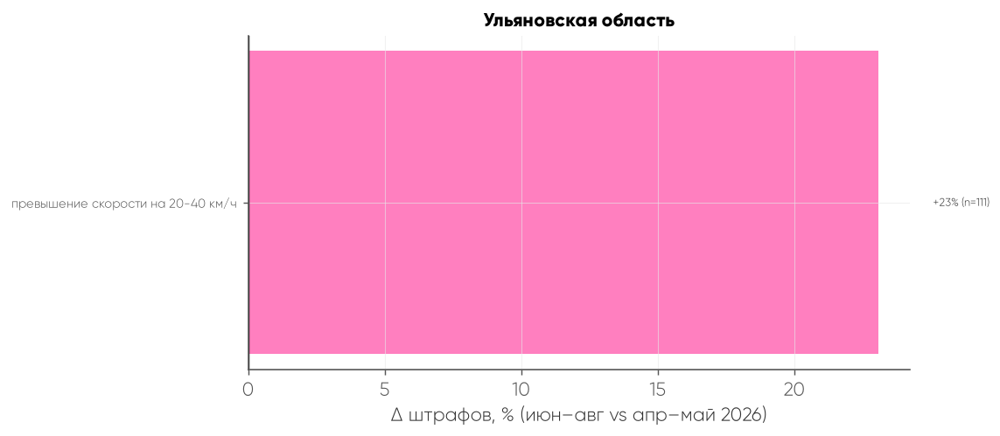

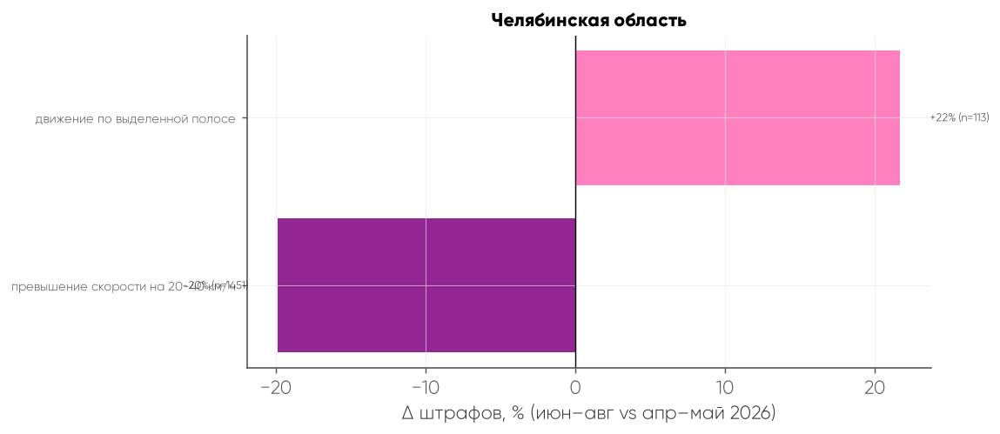

⚠️ Чеченская республика: нет статей с total >= 50


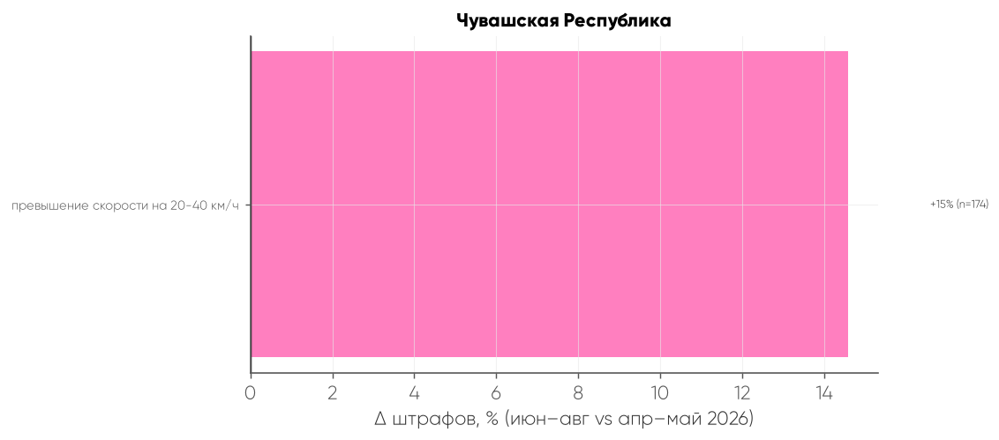

⚠️ Ямало-Ненецкий автономный округ: нет статей с total >= 50


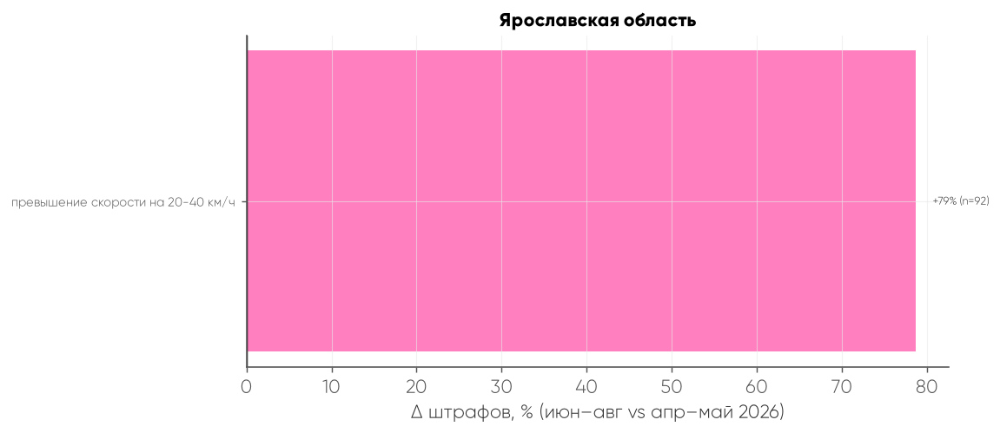

In [50]:
# ============================================================
# 8.6. Динамика по статьям — отдельная диаграмма для каждого региона
# ============================================================
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

BEFORE = [4, 5]
AFTER  = [6, 7, 8]

# только существующие регионы из данных
regions = sorted(f26['region_name'].dropna().unique())
print(f'Регионов: {len(regions)} -> {regions}')

for region in regions:
    df = f26[f26['region_name'] == region]
    if df.empty:
        continue

    # сводка: статья × месяц
    am = (df.groupby(['article_name', 'month']).size()
            .unstack(fill_value=0)
            .reindex(columns=[4, 5, 6, 7, 8], fill_value=0))

    before = am[BEFORE].mean(axis=1)
    after  = am[AFTER].mean(axis=1)
    change = (after / before.replace(0, np.nan) - 1) * 100
    total  = am.sum(axis=1)

    d = pd.DataFrame({'change': change, 'total': total}).dropna()
    d = d[d['total'] >= 50].sort_values('change')   # порог можно снизить

    if d.empty:
        print(f'⚠️ {region}: нет статей с total >= 50')
        continue

    fig, ax = plt.subplots(figsize=(9, max(4, len(d) * 0.4)))
    colors = [PURPLE if v < 0 else PINK for v in d['change']]
    ax.barh(d.index, d['change'], color=colors, alpha=0.85)
    ax.axvline(0, color=INK, linewidth=0.8)
    ax.set_xlabel('Δ штрафов, % (июн–авг vs апр–май 2026)')
    ax.set_title(f'{region}', fontsize=12, fontweight='bold', color=INK)

    for i, (v, t) in enumerate(zip(d['change'], d['total'])):
        ax.text(v + (2 if v >= 0 else -2), i,
                f'{v:+.0f}% (n={int(t)})',
                va='center', ha='left' if v >= 0 else 'right', fontsize=7)

    ax.tick_params(axis='y', labelsize=8)
    plt.tight_layout()
    plt.show()   # в окне, не сохраняем

findfont: Failed to find font weight bold for Gilroy, now using 800.


Строим 16 диаграмм...



/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


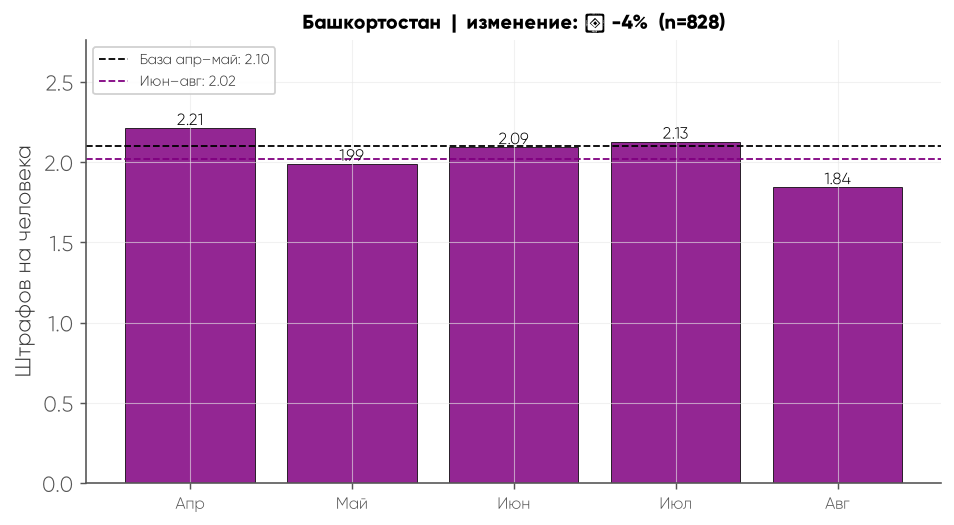

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


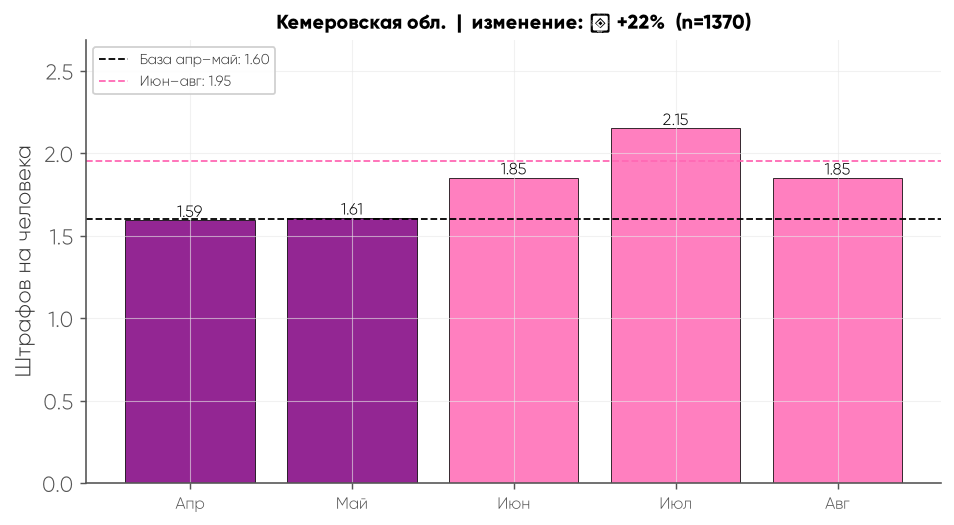

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


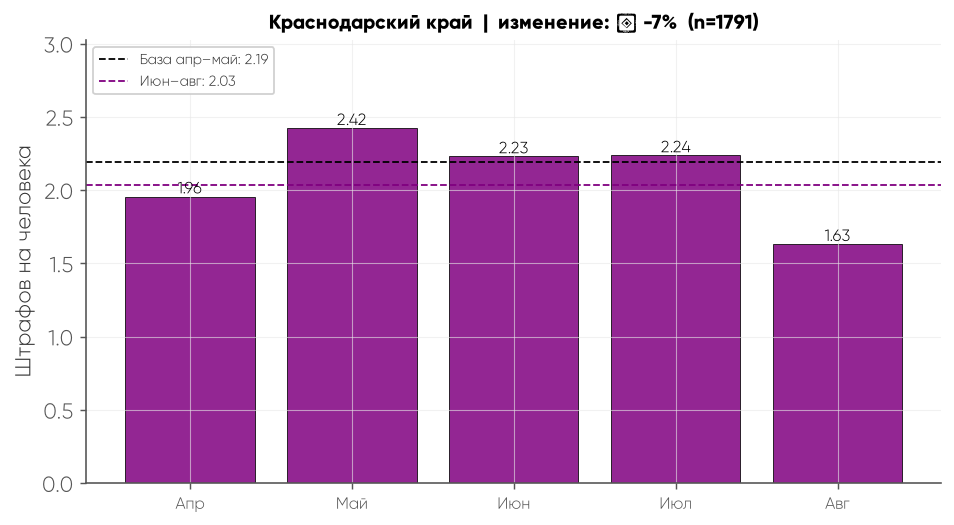

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


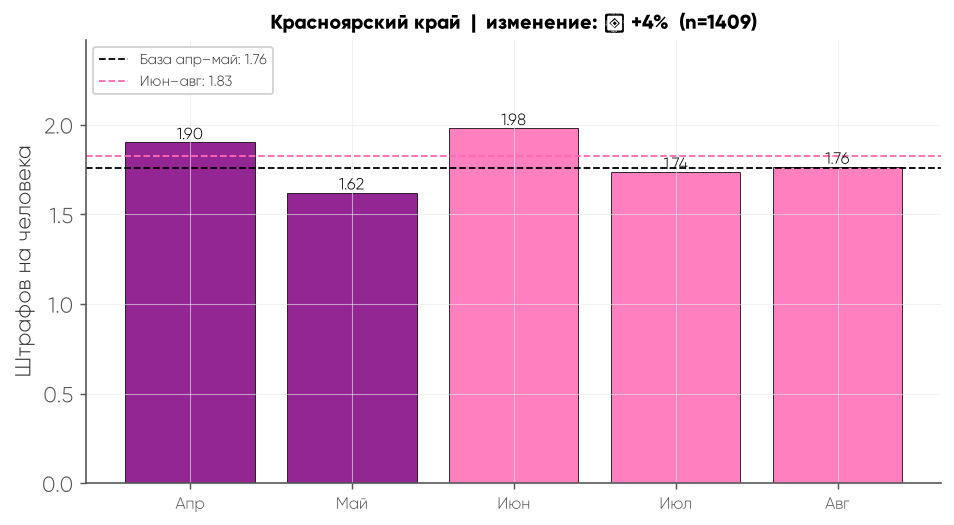

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


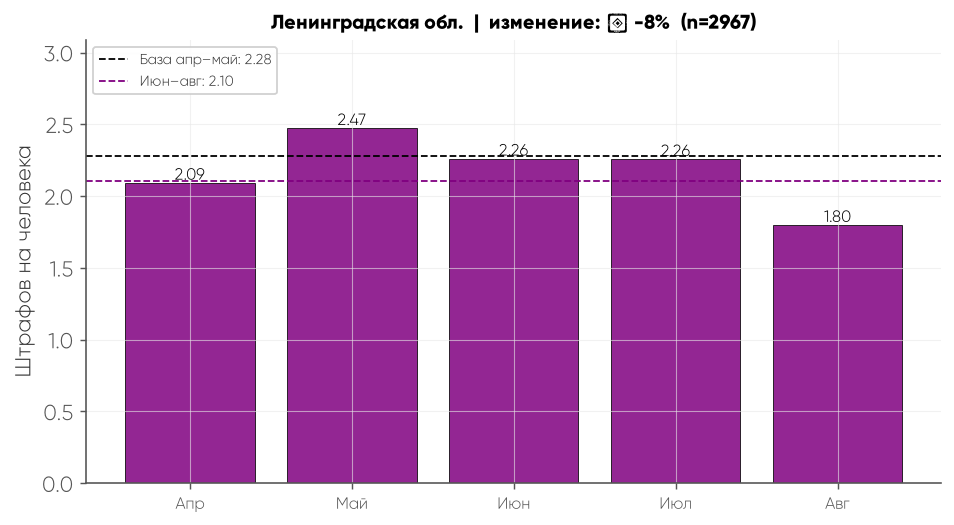

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


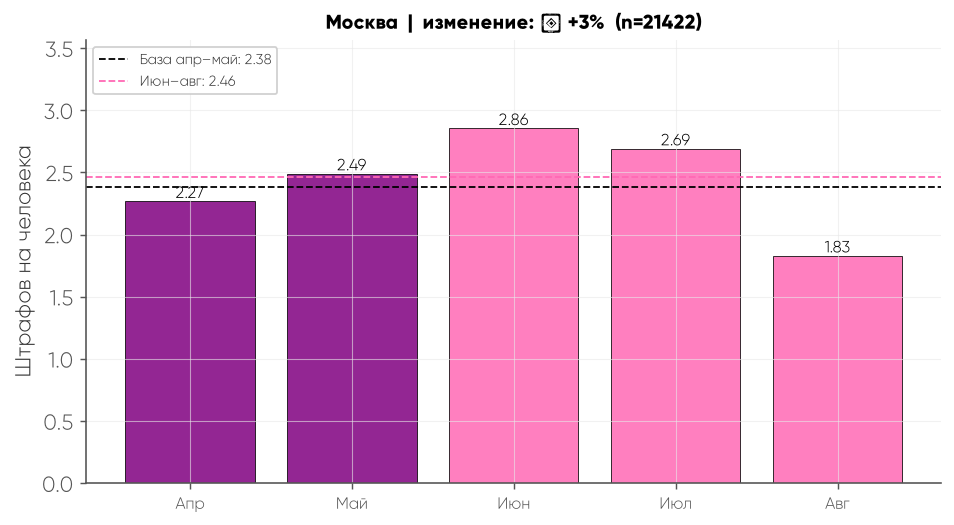

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


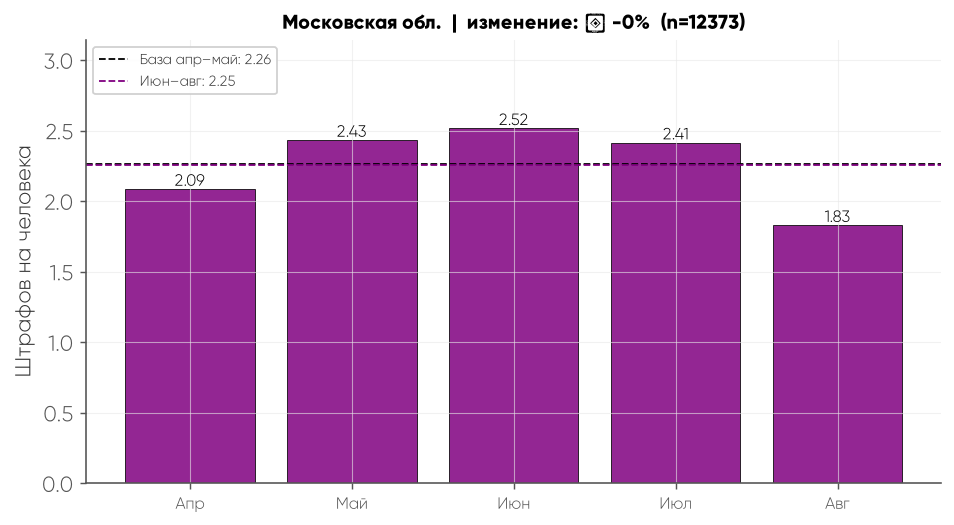

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


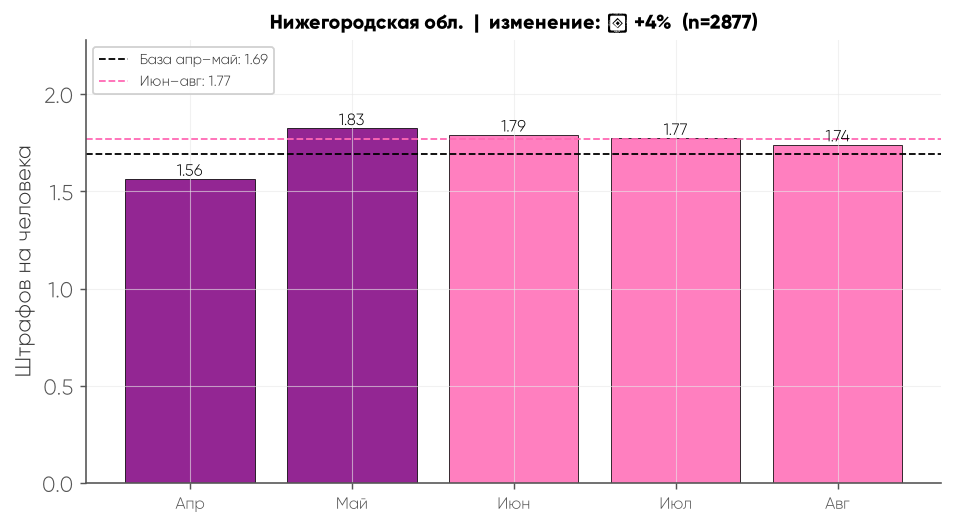

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


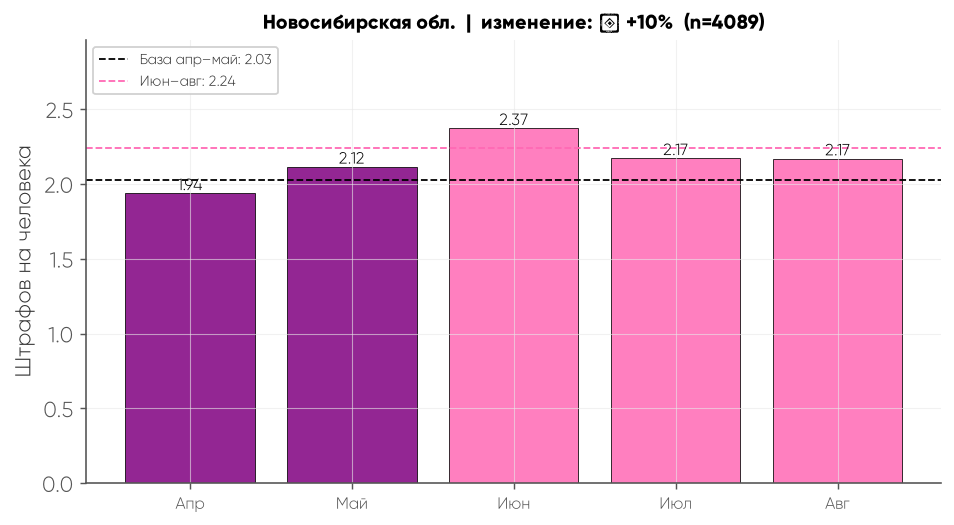

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


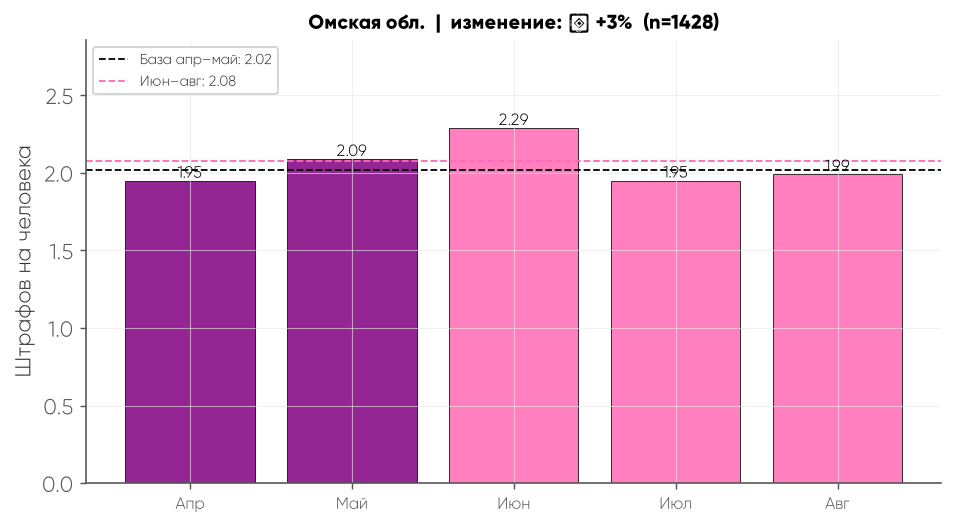

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


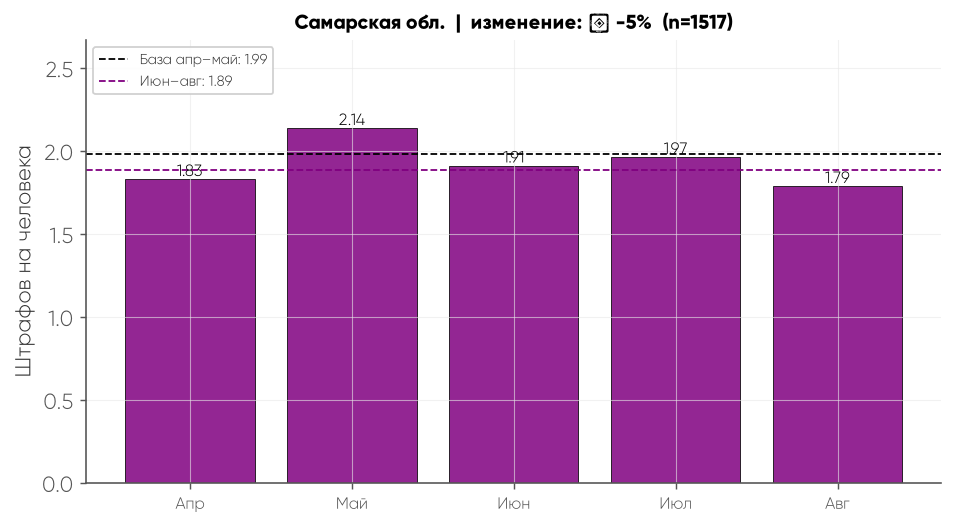

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


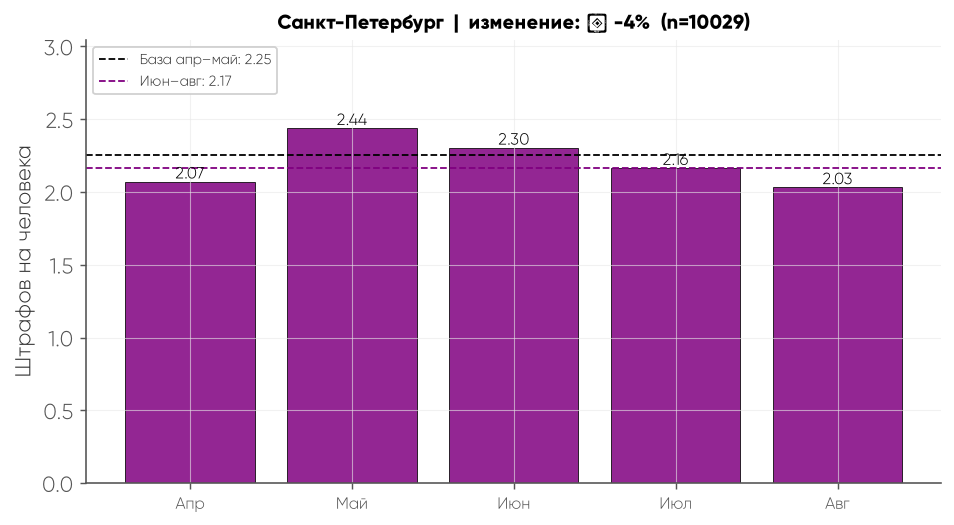

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


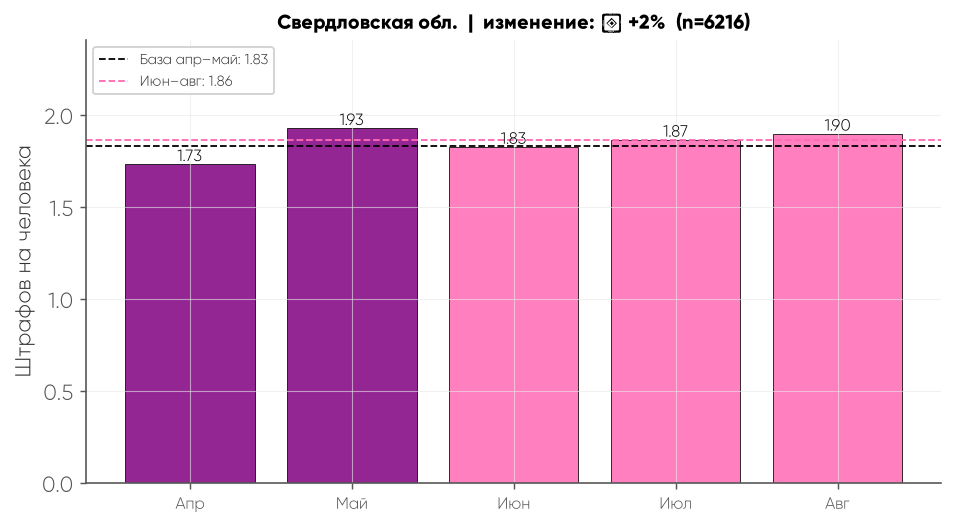

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


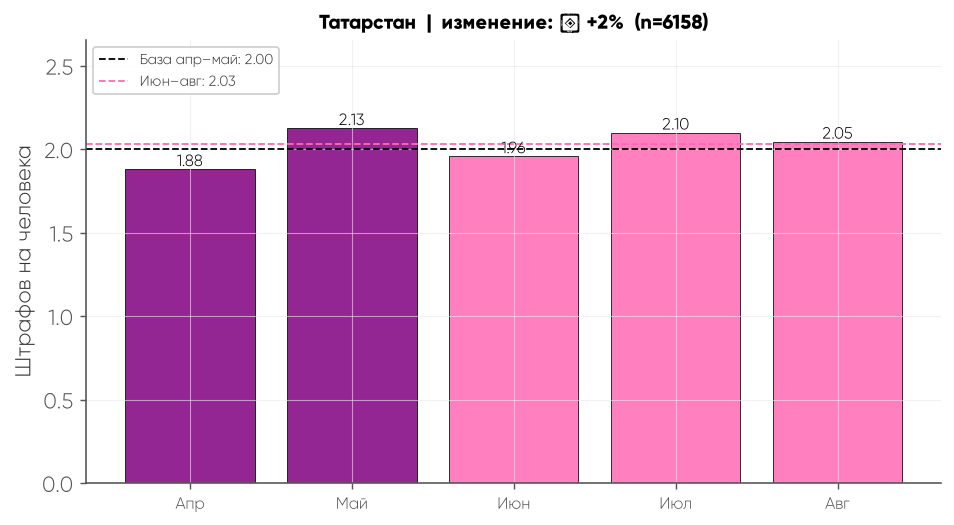

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9660 (\N{BLACK DOWN-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


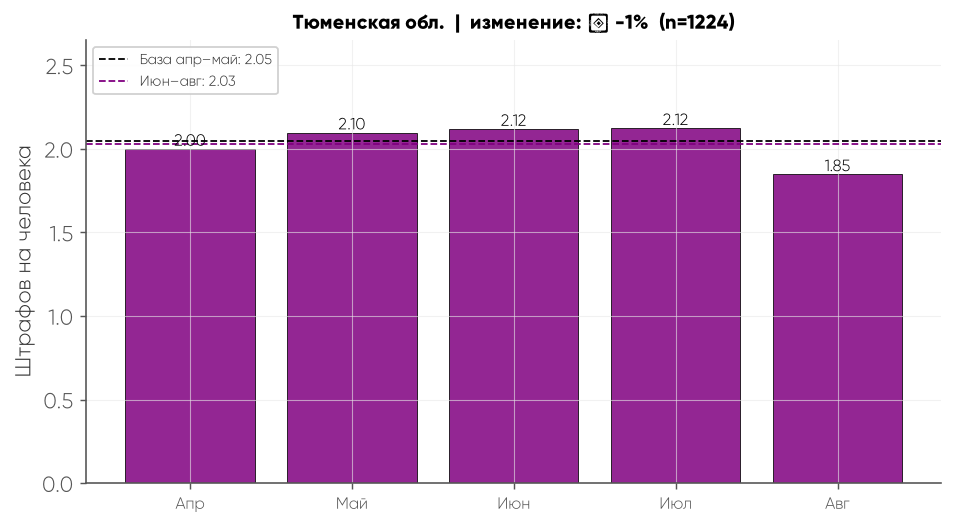

/tmp/ipykernel_74084/4284236219.py:48: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.tight_layout()
/tmp/ipykernel_74084/4284236219.py:51: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
/home/jupyter/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:158: UserWarning: Glyph 9650 (\N{BLACK UP-POINTING TRIANGLE}) missing from font(s) Gilroy.
  fig.canvas.print_figure(bytes_io, **kw)


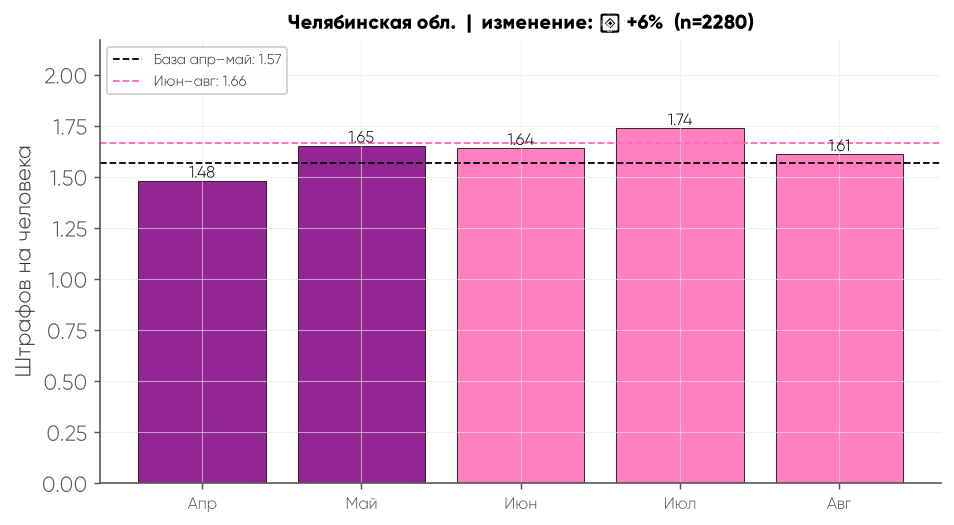


=== Сводка по регионам (сортировка по росту) ===
            region  before  after  change_pct  fines_total
Ленинградская обл.    2.28   2.10       -7.78         2967
Краснодарский край    2.19   2.03       -7.16         1791
    Самарская обл.    1.99   1.89       -4.84         1517
   Санкт-Петербург    2.25   2.17       -3.90        10029
      Башкортостан    2.10   2.02       -3.78          828
    Тюменская обл.    2.05   2.03       -0.91         1224
   Московская обл.    2.26   2.25       -0.28        12373
         Татарстан    2.00   2.03        1.53         6158
 Свердловская обл.    1.83   1.86        1.79         6216
       Омская обл.    2.02   2.08        2.86         1428
            Москва    2.38   2.46        3.34        21422
 Красноярский край    1.76   1.83        3.72         1409
Нижегородская обл.    1.69   1.77        4.38         2877
  Челябинская обл.    1.57   1.66        6.15         2280
Новосибирская обл.    2.03   2.24       10.46         4089
  Кеме

In [51]:
# ============================================================
# 8.6. Отдельная диаграмма по КАЖДОМУ региону (16 шт.)
# ============================================================
MONTH_LABELS = {4: 'Апр', 5: 'Май', 6: 'Июн', 7: 'Июл', 8: 'Авг'}

regions = sorted(pivot.index)
print(f'Строим {len(regions)} диаграмм...\n')

summary = []

for region in regions:
    s = pivot.loc[region, MONTHS].astype(float)
    before = s[BEFORE].mean()
    after  = s[AFTER].mean()
    change = (after / before - 1) * 100 if before and not np.isnan(before) else np.nan

    summary.append((region, before, after, change,
                    int(region_size.get(region, 0))))

    # цвет столбцов: база — фиолетовый, «после» — розовый если рост, иначе фиолетовый
    colors = [PURPLE if m in BEFORE else (PINK if after >= before else PURPLE)
              for m in MONTHS]

    fig, ax = plt.subplots(figsize=(7.5, 4.2))
    bars = ax.bar([MONTH_LABELS[m] for m in MONTHS], s.values,
                  color=colors, alpha=0.85, edgecolor=INK, linewidth=0.5)

    ax.axhline(before, color=INK, linestyle='--', linewidth=1,
               label=f'База апр–май: {before:.2f}')
    ax.axhline(after, color=(PINK if after >= before else PURPLE),
               linestyle='--', linewidth=1,
               label=f'Июн–авг: {after:.2f}')

    for b, v in zip(bars, s.values):
        if not np.isnan(v):
            ax.text(b.get_x() + b.get_width()/2, v,
                    f'{v:.2f}', ha='center', va='bottom', fontsize=9, color=INK)

    sign = '+' if (change or 0) >= 0 else ''
    arrow = '▲' if (change or 0) > 0 else ('▼' if (change or 0) < 0 else '=')
    ax.set_title(f'{region}  |  изменение: {arrow} {sign}{change:.0f}%  '
                 f'(n={int(region_size.get(region,0))})',
                 fontsize=11, fontweight='bold', color=INK)
    ax.set_ylabel('Штрафов на человека')
    ax.set_ylim(0, max(s.max() * 1.25, 0.1))
    ax.legend(loc='upper left', fontsize=8, framealpha=0.9)
    ax.tick_params(axis='x', labelsize=9)
    plt.tight_layout()

    safe = region.replace(' ', '_').replace('/', '_').replace('.', '')
    plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
    plt.show()

# ---------- сводная таблица изменений ----------
summary_df = (pd.DataFrame(summary,
                columns=['region', 'before', 'after', 'change_pct', 'fines_total'])
              .sort_values('change_pct'))
print('\n=== Сводка по регионам (сортировка по росту) ===')
print(summary_df.round(2).to_string(index=False))

In [52]:
# ============================================================
# АНАЛИЗ ШТРАФОВ: РЕГИОНЫ + КАТЕГОРИИ ШТРАФОВ
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ---------- пути и стиль ----------
DATA_DIR = Path('.')                # папка с table1.xlsx / table2.xlsx
KATE_DIR = Path('kate')             # куда сохранять картинки
KATE_DIR.mkdir(exist_ok=True)

PINK    = '#E85A8A'
PURPLE  = '#7B5EA7'
INK     = '#222222'
GRAY    = '#999999'

plt.rcParams.update({
    'font.size': 10,
    'axes.edgecolor': INK,
    'axes.labelcolor': INK,
    'text.color': INK,
    'xtick.color': INK,
    'ytick.color': INK,
})

MONTHS       = [4, 5, 6, 7, 8]
MONTH_LABELS = {4: 'Апр', 5: 'Май', 6: 'Июн', 7: 'Июл', 8: 'Авг'}
BEFORE, AFTER = [4, 5], [6, 7, 8]
YEAR = 2026

# ============================================================
# 1. ЗАГРУЗКА
# ============================================================
clients = pd.read_excel(DATA_DIR / 'table1.xlsx',
                        sheet_name='clients_demographics')

# table2 — лист с штрафами (категории)
t2_path = DATA_DIR / 'table2.xlsx'
xls = pd.ExcelFile(t2_path)
print('Листы в table2.xlsx:', xls.sheet_names)
fines = pd.read_excel(t2_path, sheet_name=xls.sheet_names[0])

print('\nclients shape:', clients.shape)
print('fines   shape:', fines.shape)
print('\nfines columns:', list(fines.columns))
print('clients columns:', list(clients.columns))

# ============================================================
# 2. АВТООПРЕДЕЛЕНИЕ КОЛОНОК В fines
# ============================================================
def pick_col(df, candidates, contains=None, required=True, name=''):
    for c in candidates:
        if c in df.columns:
            return c
    if contains:
        for c in df.columns:
            if all(k.lower() in c.lower() for k in contains):
                return c
    if required:
        raise KeyError(f'Не нашёл колонку «{name}». '
                       f'Кандидаты: {candidates}, contains={contains}. '
                       f'Есть: {list(df.columns)}')
    return None

col_client  = pick_col(fines, ['client_id', 'id_client', 'id_client '],
                       contains=['client'], name='client_id')
col_date    = pick_col(fines, ['fine_date', 'date', 'dt', 'start_dttm',
                               'violation_date', 'decision_date'],
                       contains=['date'], name='fine_date')
col_cat     = pick_col(fines, ['fine_category', 'category', 'koap_article',
                               'article', 'violation_type', 'fine_type',
                               'type'],
                       contains=['categ'], required=False, name='category')

# если категории нет — попробуем взять первую текстовую колонку
if col_cat is None:
    for c in fines.columns:
        if c in (col_client, col_date):
            continue
        if fines[c].dtype == object:
            col_cat = c
            print(f'⚠ Категория взята автоматически: "{col_cat}"')
            break
if col_cat is None:
    raise KeyError('Не нашёл колонку с категорией штрафа в table2.')

col_amount  = pick_col(fines, ['fine_amount', 'amount', 'sum', 'sum_rub',
                               'fine_sum_rub', 'cost'],
                       contains=['amount'], required=False, name='amount')

print(f'\nИспользуем: client="{col_client}", date="{col_date}", '
      f'cat="{col_cat}", amount="{col_amount}"')

# ============================================================
# 3. ЧИСТКА fines
# ============================================================
fines = fines.rename(columns={col_client: 'client_id',
                              col_date:   'fine_date',
                              col_cat:    'fine_category'})
fines['fine_date'] = pd.to_datetime(fines['fine_date'], errors='coerce')
fines = fines.dropna(subset=['fine_date', 'client_id'])
fines['year']  = fines['fine_date'].dt.year
fines['month'] = fines['fine_date'].dt.month

if col_amount:
    fines = fines.rename(columns={col_amount: 'fine_amount'})
    fines['fine_amount'] = pd.to_numeric(fines['fine_amount'], errors='coerce').fillna(0)

# ============================================================
# 4. РЕГИОНЫ (KLADR)
# ============================================================
KLADR_NAMES = {
    '02': 'Башкортостан',
    '16': 'Татарстан',
    '23': 'Краснодарский край',
    '24': 'Красноярский край',
    '42': 'Кемеровская обл.',
    '47': 'Ленинградская обл.',
    '50': 'Московская обл.',
    '52': 'Нижегородская обл.',
    '54': 'Новосибирская обл.',
    '55': 'Омская обл.',
    '63': 'Самарская обл.',
    '66': 'Свердловская обл.',
    '72': 'Тюменская обл.',
    '74': 'Челябинская обл.',
    '77': 'Москва',
    '78': 'Санкт-Петербург',
}

def norm_kladr(x):
    if pd.isna(x):
        return None
    try:
        return str(int(x)).zfill(2)
    except (ValueError, TypeError):
        return str(x).zfill(2)

clients_reg = (
    clients[['client_id', 'kladr_code']]
    .drop_duplicates('client_id')
    .assign(region=lambda d: d['kladr_code'].apply(norm_kladr))
    [['client_id', 'region']]
)

fines_r = fines.merge(clients_reg, on='client_id', how='left')
fines_r = fines_r.dropna(subset=['region'])
fines_r['region_name'] = (fines_r['region']
                          .map(KLADR_NAMES)
                          .fillna(fines_r['region']))

print('\nШтрафов без региона:', fines_r['region'].isna().sum())
print('Регионов в данных:', fines_r['region_name'].nunique())

# ============================================================
# 5. РЕГИОНЫ: ШТРАФОВ НА ЧЕЛОВЕКА ПО МЕСЯЦАМ
# ============================================================
reg_month = (
    fines_r[fines_r['year'] == YEAR]
    .groupby(['region_name', 'month'])
    .agg(fines=('client_id', 'size'),
         people=('client_id', 'nunique'))
    .reset_index()
)
reg_month['per_person'] = reg_month['fines'] / reg_month['people']

pivot = (reg_month
         .pivot(index='region_name', columns='month', values='per_person')
         .reindex(columns=MONTHS))

region_size = (fines_r[fines_r['year'] == YEAR]
               .groupby('region_name').size()
               .reindex(pivot.index))

before_mean = pivot[BEFORE].mean(axis=1)
after_mean  = pivot[AFTER].mean(axis=1)
change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100

result = pd.DataFrame({
    'per_person_before': before_mean,
    'per_person_after':  after_mean,
    'change_pct':        change,
    'fines_total':       region_size,
}).dropna(subset=['change_pct'])
result = result[result['fines_total'] >= 10].sort_values('change_pct')

print(f'\nРегионов в анализе: {len(result)}')
print(result[['per_person_before', 'per_person_after',
              'change_pct', 'fines_total']].round(2))

# ============================================================
# 6. РЕГИОНЫ: ОБЩИЙ ГОРИЗОНТАЛЬНЫЙ БАР
# ============================================================
n = len(result)
fig, ax = plt.subplots(figsize=(10, max(6, n * 0.4)))
colors = [PINK if v > 0 else PURPLE for v in result['change_pct'].values]
bars = ax.barh(result.index, result['change_pct'].values,
               color=colors, alpha=0.85)
ax.axvline(0, color=INK, linewidth=0.8)
ax.set_xlabel('Изменение штрафов на человека, %\n'
              '(среднее июн–авг vs среднее апр–май)')
ax.set_title(f'Динамика штрафов на человека по регионам ({YEAR})\n'
             f'база = апр–май = 0%, n={n}',
             fontsize=12, fontweight='bold', color=INK)
for b, v, total in zip(bars, result['change_pct'].values,
                       result['fines_total'].values):
    ax.text(v + (2 if v >= 0 else -2),
            b.get_y() + b.get_height() / 2,
            f'{v:+.0f}%  (n={total})',
            va='center', ha='left' if v >= 0 else 'right', fontsize=8)
ax.tick_params(axis='y', labelsize=9)
plt.tight_layout()
plt.savefig(KATE_DIR / '08_regions.png', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================
# 7. РЕГИОНЫ: ОТДЕЛЬНАЯ ДИАГРАММА ПО КАЖДОМУ РЕГИОНУ
# ============================================================
print(f'\nСтроим диаграммы по {len(pivot.index)} регионам...')
for region in sorted(pivot.index):
    s = pivot.loc[region, MONTHS].astype(float)
    before = s[BEFORE].mean()
    after  = s[AFTER].mean()
    chg = (after / before - 1) * 100 if before and not np.isnan(before) else np.nan
    n_r = int(region_size.get(region, 0))

    colors = [PURPLE if m in BEFORE else (PINK if after >= before else PURPLE)
              for m in MONTHS]

    fig, ax = plt.subplots(figsize=(7.5, 4.2))
    bars = ax.bar([MONTH_LABELS[m] for m in MONTHS], s.values,
                  color=colors, alpha=0.85, edgecolor=INK, linewidth=0.5)
    ax.axhline(before, color=INK, linestyle='--', linewidth=1,
               label=f'База апр–май: {before:.2f}')
    ax.axhline(after, color=(PINK if after >= before else PURPLE),
               linestyle='--', linewidth=1,
               label=f'Июн–авг: {after:.2f}')
    for b, v in zip(bars, s.values):
        if not np.isnan(v):
            ax.text(b.get_x() + b.get_width() / 2, v, f'{v:.2f}',
                    ha='center', va='bottom', fontsize=9, color=INK)

    sign  = '+' if (chg or 0) >= 0 else ''
    arrow = '▲' if (chg or 0) > 0 else ('▼' if (chg or 0) < 0 else '=')
    ax.set_title(f'{region}  |  {arrow} {sign}{chg:.0f}%  (n={n_r})',
                 fontsize=11, fontweight='bold', color=INK)
    ax.set_ylabel('Штрафов на человека')
    ax.set_ylim(0, max(s.max() * 1.25, 0.1))
    ax.legend(loc='upper left', fontsize=8, framealpha=0.9)
    plt.tight_layout()
    safe = region.replace(' ', '_').replace('/', '_').replace('.', '')
    plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
    plt.show()

# ============================================================
# 8. КАТЕГОРИИ ШТРАФОВ: ШТРАФОВ НА ЧЕЛОВЕКА ПО МЕСЯЦАМ
# ============================================================
print('\n=== АНАЛИЗ ПО КАТЕГОРИЯМ ШТРАФОВ ===')

fines_c = fines[fines['year'] == YEAR].copy()

cat_month = (
    fines_c
    .groupby(['fine_category', 'month'])
    .agg(fines=('client_id', 'size'),
         people=('client_id', 'nunique'))
    .reset_index()
)
cat_month['per_person'] = cat_month['fines'] / cat_month['people']

pivot_cat = (cat_month
             .pivot(index='fine_category', columns='month',
                    values='per_person')
             .reindex(columns=MONTHS))

cat_size = fines_c.groupby('fine_category').size().reindex(pivot_cat.index)

before_c = pivot_cat[BEFORE].mean(axis=1)
after_c  = pivot_cat[AFTER].mean(axis=1)
change_c = (after_c / before_c.replace(0, np.nan) - 1) * 100

result_c = pd.DataFrame({
    'per_person_before': before_c,
    'per_person_after':  after_c,
    'change_pct':        change_c,
    'fines_total':       cat_size,
}).dropna(subset=['change_pct'])
result_c = result_c[result_c['fines_total'] >= 10].sort_values('change_pct')

print(f'\nКатегорий в анализе: {len(result_c)}')
print(result_c.round(2))

# ---------- 8.1 общий горизонтальный бар по категориям ----------
if len(result_c) > 0:
    n_c = len(result_c)
    fig, ax = plt.subplots(figsize=(10, max(5, n_c * 0.45)))
    colors = [PINK if v > 0 else PURPLE for v in result_c['change_pct'].values]
    bars = ax.barh(result_c.index, result_c['change_pct'].values,
                   color=colors, alpha=0.85)
    ax.axvline(0, color=INK, linewidth=0.8)
    ax.set_xlabel('Изменение штрафов на человека, %\n'
                  '(среднее июн–авг vs среднее апр–май)')
    ax.set_title(f'Динамика штрафов на человека по категориям ({YEAR})\n'
                 f'база = апр–май = 0%, n={n_c}',
                 fontsize=12, fontweight='bold', color=INK)
    for b, v, total in zip(bars, result_c['change_pct'].values,
                           result_c['fines_total'].values):
        ax.text(v + (2 if v >= 0 else -2),
                b.get_y() + b.get_height() / 2,
                f'{v:+.0f}%  (n={total})',
                va='center', ha='left' if v >= 0 else 'right', fontsize=8)
    ax.tick_params(axis='y', labelsize=9)
    plt.tight_layout()
    plt.savefig(KATE_DIR / '08_categories.png', dpi=150, bbox_inches='tight')
    plt.show()

# ---------- 8.2 отдельная диаграмма по КАЖДОЙ категории ----------
print(f'\nСтроим диаграммы по {len(pivot_cat.index)} категориям...')
for cat in sorted(pivot_cat.index.astype(str)):
    s = pivot_cat.loc[cat, MONTHS].astype(float)
    before = s[BEFORE].mean()
    after  = s[AFTER].mean()
    chg = (after / before - 1) * 100 if before and not np.isnan(before) else np.nan
    n_cat = int(cat_size.get(cat, 0))

    colors = [PURPLE if m in BEFORE else (PINK if after >= before else PURPLE)
              for m in MONTHS]

    fig, ax = plt.subplots(figsize=(7.5, 4.2))
    bars = ax.bar([MONTH_LABELS[m] for m in MONTHS], s.values,
                  color=colors, alpha=0.85, edgecolor=INK, linewidth=0.5)
    ax.axhline(before, color=INK, linestyle='--', linewidth=1,
               label=f'База апр–май: {before:.2f}')
    ax.axhline(after, color=(PINK if after >= before else PURPLE),
               linestyle='--', linewidth=1,
               label=f'Июн–авг: {after:.2f}')
    for b, v in zip(bars, s.values):
        if not np.isnan(v):
            ax.text(b.get_x() + b.get_width() / 2, v, f'{v:.2f}',
                    ha='center', va='bottom', fontsize=9, color=INK)

    sign  = '+' if (chg or 0) >= 0 else ''
    arrow = '▲' if (chg or 0) > 0 else ('▼' if (chg or 0) < 0 else '=')
    ax.set_title(f'{cat}  |  {arrow} {sign}{chg:.0f}%  (n={n_cat})',
                 fontsize=11, fontweight='bold', color=INK)
    ax.set_ylabel('Штрафов на человека')
    ax.set_ylim(0, max(s.max() * 1.25, 0.1))
    ax.legend(loc='upper left', fontsize=8, framealpha=0.9)
    plt.tight_layout()
    safe = str(cat).replace(' ', '_').replace('/', '_').replace('.', '')
    plt.savefig(KATE_DIR / f'08_cat_{safe}.png', dpi=150, bbox_inches='tight')
    plt.show()

print('\n✅ Готово. Файлы в папке:', KATE_DIR.resolve())

FileNotFoundError: [Errno 2] No such file or directory: 'table1.xlsx'

In [ ]:
# ============================================================
# АНАЛИЗ ШТРАФОВ: РЕГИОНЫ + КАТЕГОРИИ ШТРАФОВ
# файлы: /shared/uploads/clients_demographics.xlsx
#        /shared/uploads/fines_2026.csv
# ============================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ---------- пути ----------
UPLOADS  = Path('/shared/uploads')
KATE_DIR = Path('/shared/uploads/kate')
KATE_DIR.mkdir(exist_ok=True, parents=True)

path_clients = UPLOADS / 'clients_demographics.xlsx'
path_fines   = UPLOADS / 'fines_2026.csv'

print('clients →', path_clients, path_clients.exists())
print('fines   →', path_fines,   path_fines.exists())

# ---------- стиль ----------
PINK    = '#E85A8A'
PURPLE  = '#7B5EA7'
INK     = '#222222'

plt.rcParams.update({
    'font.size': 10,
    'axes.edgecolor': INK, 'axes.labelcolor': INK,
    'text.color': INK, 'xtick.color': INK, 'ytick.color': INK,
})

MONTHS       = [4, 5, 6, 7, 8]
MONTH_LABELS = {4: 'Апр', 5: 'Май', 6: 'Июн', 7: 'Июл', 8: 'Авг'}
BEFORE, AFTER = [4, 5], [6, 7, 8]
YEAR = 2026

# ============================================================
# 1. ЗАГРУЗКА
# ============================================================
clients = pd.read_excel(path_clients, sheet_name='clients_demographics')
print('\nclients shape:', clients.shape)
print('clients columns:', list(clients.columns))

fines = pd.read_csv(path_fines)
print('\nfines shape:', fines.shape)
print('fines columns:', list(fines.columns))

# ============================================================
# 2. АВТООПРЕДЕЛЕНИЕ КОЛОНОК В fines
# ============================================================
def pick_col(df, candidates, contains=None, required=True, name=''):
    for c in candidates:
        if c in df.columns:
            return c
    if contains:
        for c in df.columns:
            if all(k.lower() in c.lower() for k in contains):
                return c
    if required:
        raise KeyError(f'Не нашёл колонку «{name}». '
                       f'Кандидаты: {candidates}, contains={contains}. '
                       f'Есть: {list(df.columns)}')
    return None

col_client = pick_col(fines, ['client_id', 'id_client'],
                      contains=['client'], name='client_id')
col_date   = pick_col(fines, ['fine_date', 'date', 'dt', 'start_dttm',
                              'violation_date', 'decision_date'],
                      contains=['date'], name='fine_date')
col_cat    = pick_col(fines, ['fine_category', 'category', 'koap_article',
                              'article', 'violation_type', 'fine_type',
                              'type'],
                      contains=['categ'], required=False, name='category')
if col_cat is None:
    for c in fines.columns:
        if c in (col_client, col_date):
            continue
        if fines[c].dtype == object:
            col_cat = c
            print(f'⚠ Категория взята автоматически: "{col_cat}"')
            break
if col_cat is None:
    raise KeyError('Не нашёл колонку с категорией штрафа в fines.')

col_amount = pick_col(fines, ['fine_amount', 'amount', 'sum', 'sum_rub',
                              'fine_sum_rub', 'cost'],
                      contains=['amount'], required=False, name='amount')

print(f'\nИспользуем: client="{col_client}", date="{col_date}", '
      f'cat="{col_cat}", amount="{col_amount}"')

# ============================================================
# 3. ЧИСТКА fines
# ============================================================
fines = fines.rename(columns={col_client: 'client_id',
                              col_date:   'fine_date',
                              col_cat:    'fine_category'})
fines['fine_date'] = pd.to_datetime(fines['fine_date'], errors='coerce')
fines = fines.dropna(subset=['fine_date', 'client_id'])
fines['year']  = fines['fine_date'].dt.year
fines['month'] = fines['fine_date'].dt.month

if col_amount:
    fines = fines.rename(columns={col_amount: 'fine_amount'})
    fines['fine_amount'] = pd.to_numeric(fines['fine_amount'],
                                         errors='coerce').fillna(0)

print('\nГоды в fines:', sorted(fines['year'].dropna().unique().tolist()))
print('Месяцы в fines:', sorted(fines['month'].dropna().unique().tolist()))

# ============================================================
# 4. РЕГИОНЫ (KLADR)
# ============================================================
KLADR_NAMES = {
    '02': 'Башкортостан', '16': 'Татарстан',
    '23': 'Краснодарский край', '24': 'Красноярский край',
    '42': 'Кемеровская обл.', '47': 'Ленинградская обл.',
    '50': 'Московская обл.', '52': 'Нижегородская обл.',
    '54': 'Новосибирская обл.', '55': 'Омская обл.',
    '63': 'Самарская обл.', '66': 'Свердловская обл.',
    '72': 'Тюменская обл.', '74': 'Челябинская обл.',
    '77': 'Москва', '78': 'Санкт-Петербург',
}

def norm_kladr(x):
    if pd.isna(x):
        return None
    try:
        return str(int(x)).zfill(2)
    except (ValueError, TypeError):
        return str(x).zfill(2)

clients_reg = (clients[['client_id', 'kladr_code']]
               .drop_duplicates('client_id')
               .assign(region=lambda d: d['kladr_code'].apply(norm_kladr))
               [['client_id', 'region']])

fines_r = fines.merge(clients_reg, on='client_id', how='left')
fines_r = fines_r.dropna(subset=['region'])
fines_r['region_name'] = (fines_r['region']
                          .map(KLADR_NAMES)
                          .fillna(fines_r['region']))

print('\nШтрафов без региона:', fines_r['region'].isna().sum())
print('Регионов в данных:', fines_r['region_name'].nunique())

# ============================================================
# 5. РЕГИОНЫ: ШТРАФОВ НА ЧЕЛОВЕКА ПО МЕСЯЦАМ
# ============================================================
reg_month = (fines_r[fines_r['year'] == YEAR]
             .groupby(['region_name', 'month'])
             .agg(fines=('client_id', 'size'),
                  people=('client_id', 'nunique'))
             .reset_index())
reg_month['per_person'] = reg_month['fines'] / reg_month['people']

pivot = (reg_month
         .pivot(index='region_name', columns='month', values='per_person')
         .reindex(columns=MONTHS))

region_size = (fines_r[fines_r['year'] == YEAR]
               .groupby('region_name').size()
               .reindex(pivot.index))

before_mean = pivot[BEFORE].mean(axis=1)
after_mean  = pivot[AFTER].mean(axis=1)
change      = (after_mean / before_mean.replace(0, np.nan) - 1) * 100

result = pd.DataFrame({
    'per_person_before': before_mean,
    'per_person_after':  after_mean,
    'change_pct':        change,
    'fines_total':       region_size,
}).dropna(subset=['change_pct'])
result = result[result['fines_total'] >= 10].sort_values('change_pct')

print(f'\nРегионов в анализе: {len(result)}')
print(result.round(2))

# ============================================================
# 6. РЕГИОНЫ: ОБЩИЙ ГОРИЗОНТАЛЬНЫЙ БАР
# ============================================================
n = len(result)
if n > 0:
    fig, ax = plt.subplots(figsize=(10, max(6, n * 0.4)))
    colors = [PINK if v > 0 else PURPLE for v in result['change_pct'].values]
    bars = ax.barh(result.index, result['change_pct'].values,
                   color=colors, alpha=0.85)
    ax.axvline(0, color=INK, linewidth=0.8)
    ax.set_xlabel('Изменение штрафов на человека, %\n'
                  '(среднее июн–авг vs среднее апр–май)')
    ax.set_title(f'Динамика штрафов на человека по регионам ({YEAR})\n'
                 f'база = апр–май = 0%, n={n}',
                 fontsize=12, fontweight='bold', color=INK)
    for b, v, total in zip(bars, result['change_pct'].values,
                           result['fines_total'].values):
        ax.text(v + (2 if v >= 0 else -2),
                b.get_y() + b.get_height() / 2,
                f'{v:+.0f}%  (n={total})',
                va='center', ha='left' if v >= 0 else 'right', fontsize=8)
    ax.tick_params(axis='y', labelsize=9)
    plt.tight_layout()
    plt.savefig(KATE_DIR / '08_regions.png', dpi=150, bbox_inches='tight')
    plt.show()

# ============================================================
# 7. РЕГИОНЫ: ДИАГРАММА ПО КАЖДОМУ РЕГИОНУ
# ============================================================
print(f'\nСтроим диаграммы по {len(pivot.index)} регионам...')
for region in sorted(pivot.index):
    s = pivot.loc[region, MONTHS].astype(float)
    before = s[BEFORE].mean()
    after  = s[AFTER].mean()
    chg = (after / before - 1) * 100 if before and not np.isnan(before) else np.nan
    n_r = int(region_size.get(region, 0))

    colors = [PURPLE if m in BEFORE else (PINK if after >= before else PURPLE)
              for m in MONTHS]

    fig, ax = plt.subplots(figsize=(7.5, 4.2))
    bars = ax.bar([MONTH_LABELS[m] for m in MONTHS], s.values,
                  color=colors, alpha=0.85, edgecolor=INK, linewidth=0.5)
    ax.axhline(before, color=INK, linestyle='--', linewidth=1,
               label=f'База апр–май: {before:.2f}')
    ax.axhline(after, color=(PINK if after >= before else PURPLE),
               linestyle='--', linewidth=1,
               label=f'Июн–авг: {after:.2f}')
    for b, v in zip(bars, s.values):
        if not np.isnan(v):
            ax.text(b.get_x() + b.get_width() / 2, v, f'{v:.2f}',
                    ha='center', va='bottom', fontsize=9, color=INK)

    sign  = '+' if (chg or 0) >= 0 else ''
    arrow = '▲' if (chg or 0) > 0 else ('▼' if (chg or 0) < 0 else '=')
    ax.set_title(f'{region}  |  {arrow} {sign}{chg:.0f}%  (n={n_r})',
                 fontsize=11, fontweight='bold', color=INK)
    ax.set_ylabel('Штрафов на человека')
    ax.set_ylim(0, max(s.max() * 1.25, 0.1))
    ax.legend(loc='upper left', fontsize=8, framealpha=0.9)
    plt.tight_layout()
    safe = region.replace(' ', '_').replace('/', '_').replace('.', '')
    plt.savefig(KATE_DIR / f'08_region_{safe}.png', dpi=150, bbox_inches='tight')
    plt.show()

# ============================================================
# 8. КАТЕГОРИИ ШТРАФОВ
# ============================================================
print('\n=== АНАЛИЗ ПО КАТЕГОРИЯМ ШТРАФОВ ===')
print('Уникальных категорий:', fines['fine_category'].nunique())
print(fines['fine_category'].value_counts().head(20))

fines_c = fines[fines['year'] == YEAR].copy()

cat_month = (fines_c
             .groupby(['fine_category', 'month'])
             .agg(fines=('client_id', 'size'),
                  people=('client_id', 'nunique'))
             .reset_index())
cat_month['per_person'] = cat_month['fines'] / cat_month['people']

pivot_cat = (cat_month
             .pivot(index='fine_category', columns='month',
                    values='per_person')
             .reindex(columns=MONTHS))

cat_size = fines_c.groupby('fine_category').size().reindex(pivot_cat.index)

before_c = pivot_cat[BEFORE].mean(axis=1)
after_c  = pivot_cat[AFTER].mean(axis=1)
change_c = (after_c / before_c.replace(0, np.nan) - 1) * 100

result_c = pd.DataFrame({
    'per_person_before': before_c,
    'per_person_after':  after_c,
    'change_pct':        change_c,
    'fines_total':       cat_size,
}).dropna(subset=['change_pct'])
result_c = result_c[result_c['fines_total'] >= 10].sort_values('change_pct')

print(f'\nКатегорий в анализе: {len(result_c)}')
print(result_c.round(2))

# ---------- 8.1 общий бар по категориям ----------
if len(result_c) > 0:
    n_c = len(result_c)
    fig, ax = plt.subplots(figsize=(10, max(5, n_c * 0.45)))
    colors = [PINK if v > 0 else PURPLE for v in result_c['change_pct'].values]
    bars = ax.barh(result_c.index, result_c['change_pct'].values,
                   color=colors, alpha=0.85)
    ax.axvline(0, color=INK, linewidth=0.8)
    ax.set_xlabel('Изменение штрафов на человека, %\n'
                  '(среднее июн–авг vs среднее апр–май)')
    ax.set_title(f'Динамика штрафов на человека по категориям ({YEAR})\n'
                 f'база = апр–май = 0%, n={n_c}',
                 fontsize=12, fontweight='bold', color=INK)
    for b, v, total in zip(bars, result_c['change_pct'].values,
                           result_c['fines_total'].values):
        ax.text(v + (2 if v >= 0 else -2),
                b.get_y() + b.get_height() / 2,
                f'{v:+.0f}%  (n={total})',
                va='center', ha='left' if v >= 0 else 'right', fontsize=8)
    ax.tick_params(axis='y', labelsize=9)
    plt.tight_layout()
    plt.savefig(KATE_DIR / '08_categories.png', dpi=150, bbox_inches='tight')
    plt.show()

# ---------- 8.2 диаграмма по каждой категории ----------
print(f'\nСтроим диаграммы по {len(pivot_cat.index)} категориям...')
for cat in sorted(pivot_cat.index.astype(str)):
    s = pivot_cat.loc[cat, MONTHS].astype(float)
    before = s[BEFORE].mean()
    after  = s[AFTER].mean()
    chg = (after / before - 1) * 100 if before and not np.isnan(before) else np.nan
    n_cat = int(cat_size.get(cat, 0))

    colors = [PURPLE if m in BEFORE else (PINK if after >= before else PURPLE)
              for m in MONTHS]

    fig, ax = plt.subplots(figsize=(7.5, 4.2))
    bars = ax.bar([MONTH_LABELS[m] for m in MONTHS], s.values,
                  color=colors, alpha=0.85, edgecolor=INK, linewidth=0.5)
    ax.axhline(before, color=INK, linestyle='--', linewidth=1,
               label=f'База апр–май: {before:.2f}')
    ax.axhline(after, color=(PINK if after >= before else PURPLE),
               linestyle='--', linewidth=1,
               label=f'Июн–авг: {after:.2f}')
    for b, v in zip(bars, s.values):
        if not np.isnan(v):
            ax.text(b.get_x() + b.get_width() / 2, v, f'{v:.2f}',
                    ha='center', va='bottom', fontsize=9, color=INK)

    sign  = '+' if (chg or 0) >= 0 else ''
    arrow = '▲' if (chg or 0) > 0 else ('▼' if (chg or 0) < 0 else '=')
    ax.set_title(f'{cat}  |  {arrow} {sign}{chg:.0f}%  (n={n_cat})',
                 fontsize=11, fontweight='bold', color=INK)
    ax.set_ylabel('Штрафов на человека')
    ax.set_ylim(0, max(s.max() * 1.25, 0.1))
    ax.legend(loc='upper left', fontsize=8, framealpha=0.9)
    plt.tight_layout()
    safe = str(cat).replace(' ', '_').replace('/', '_').replace('.', '')
    plt.savefig(KATE_DIR / f'08_cat_{safe}.png', dpi=150, bbox_inches='tight')
    plt.show()

print('\n✅ Готово. Файлы в:', KATE_DIR.resolve())